In [2]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
import scipy.stats as st
import seaborn as sns
import matplotlib.transforms as transforms

# Model Description

1. with tilde_beta
$$\epsilon_{it} = \epsilon\sum_{k^{'}\in K\backslash k}|I_{tk^{'}}|d_{kk^{'}}^{-\tilde{\beta}}$$
2. without tilde_beta
$$\epsilon_{it} = \epsilon\sum_{k^{'}\in K\backslash k}|I_{tk^{'}}|d_{kk^{'}}^{-\beta}$$
3. without epsilon(use $\alpha_0$ and $\alpha_1$ instead)
$$\epsilon_{it} = (\alpha_0+\alpha_1\cdot s_i)\sum_{k^{'}\in K\backslash k}|I_{tk^{'}}|d_{kk^{'}}^{-\tilde{\beta}}$$
4. use centroids of infected population instead of cluster centroids
$$\epsilon_{it} = (\alpha_0+\alpha_1\cdot s_i)\sum_{k^{'}\in K\backslash k}|I_{tk^{'}}|d_{kk^{'}_{inf}}^{-\tilde{\beta}}$$
5. likelihood inflated (only calculate the likelihood of one cluster (cluster j) and expand it to the power of K)  
$$l^{'} = \log L^{'} = \log(\prod_{t = 1}^{T_{end}}\left[\prod_{i\in I_{j}(t+1)\backslash I_{j}(t)}P_{it}\right]\left[\prod_{i\in S_{j}(t+1)}(1-P_{it})\right])^{K}= K\log(\prod_{t = 1}^{T_{end}}\left[\prod_{i\in I_{j}(t+1)\backslash I_{j}(t)}P_{it}\right]\left[\prod_{i\in S_{j}(t+1)}(1-P_{it})\right])$$
use the spark function in 4: $\epsilon_{it} = (\alpha_0+\alpha_1\cdot s_i)\sum_{k^{'}\in K\backslash k}|I_{tk^{'}}|d_{kk^{'}_{inf}}^{-\tilde{\beta}}$





# 3 Clusters

In [1102]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]
cluster_id = df["cluster_id"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


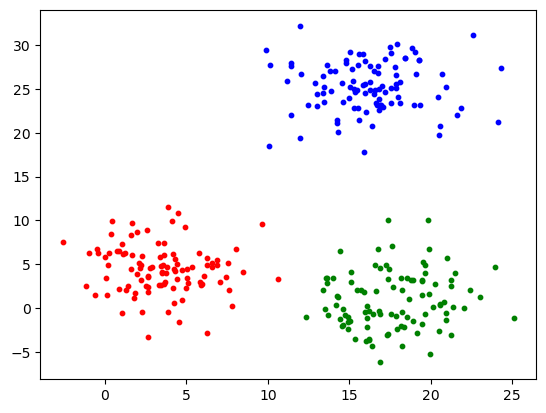

In [1094]:
X = df[["position_x", "position_y"]].values
n_clusters = 3
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [1095]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [818]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


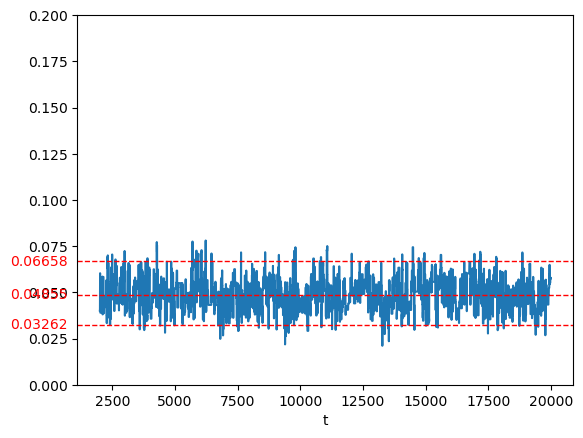

In [601]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


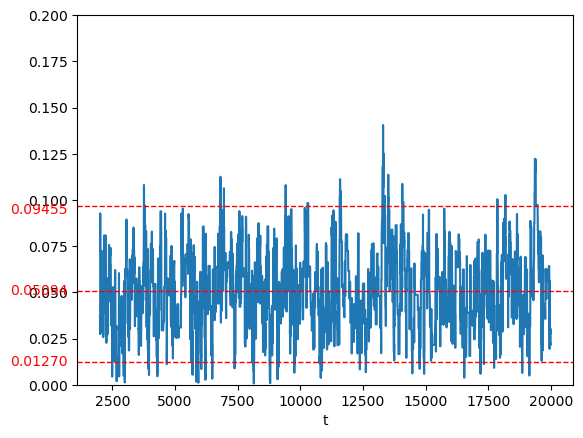

In [602]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


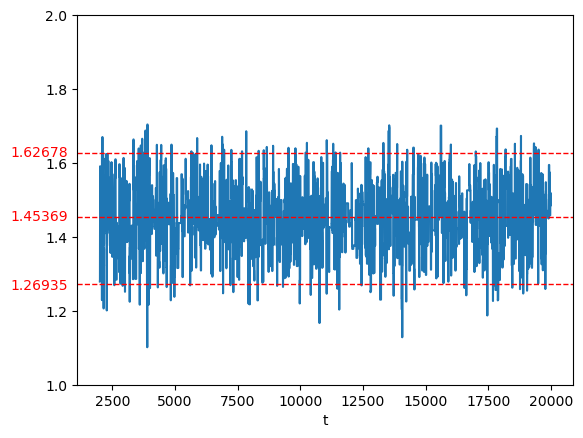

In [603]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


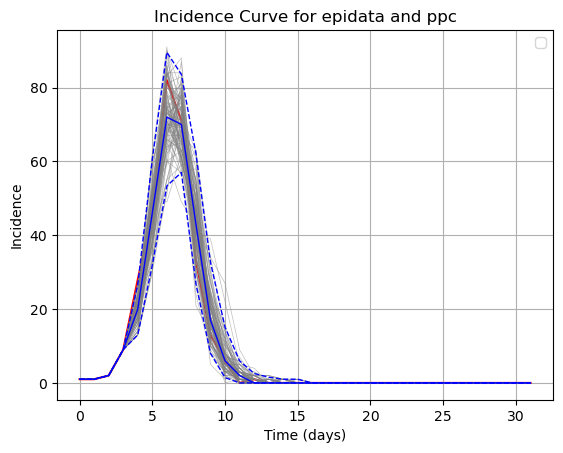

In [1106]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


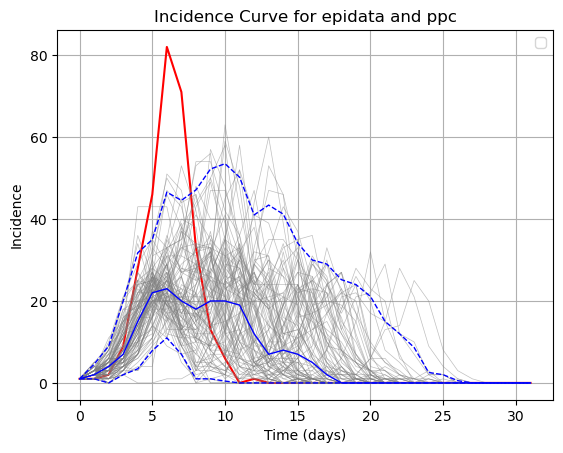

In [1109]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


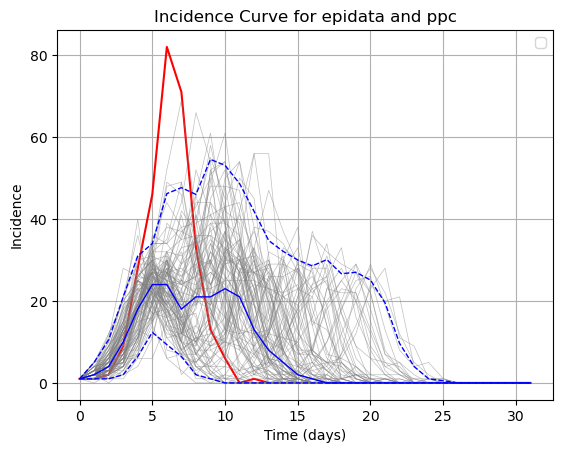

In [1107]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


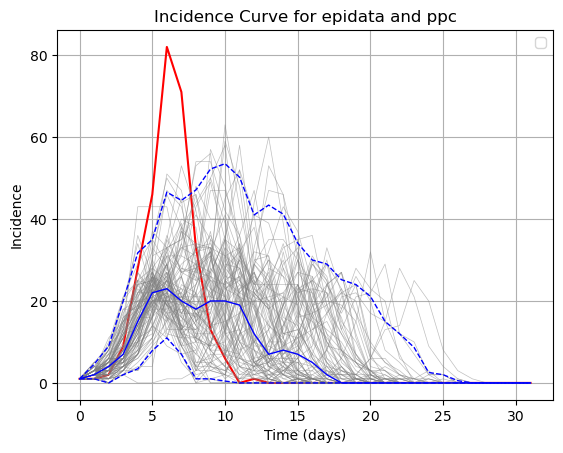

In [1110]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model III: without epsilon

In [1096]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


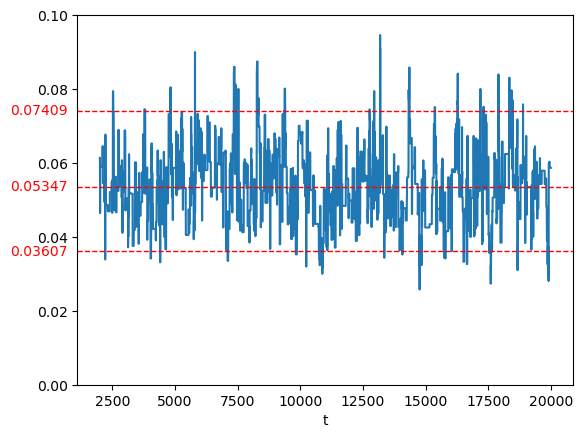

In [1097]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


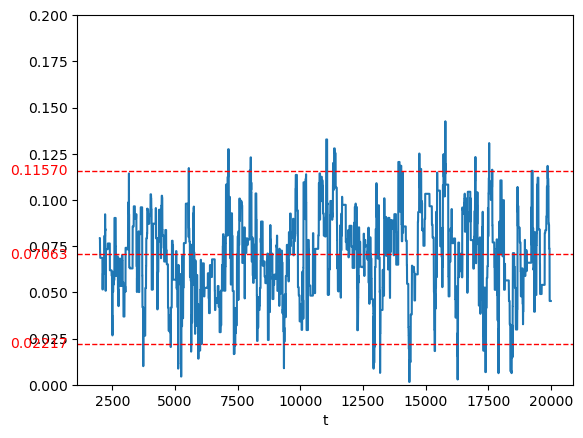

In [1098]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


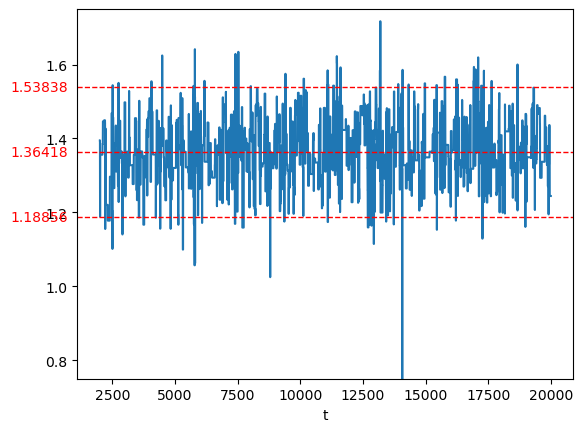

In [1099]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


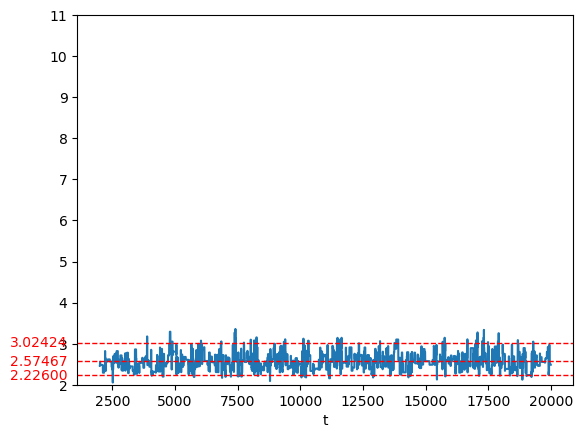

In [1100]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 11)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


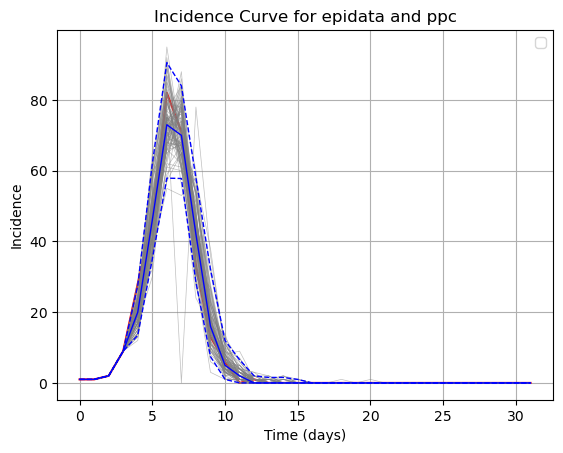

In [1111]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


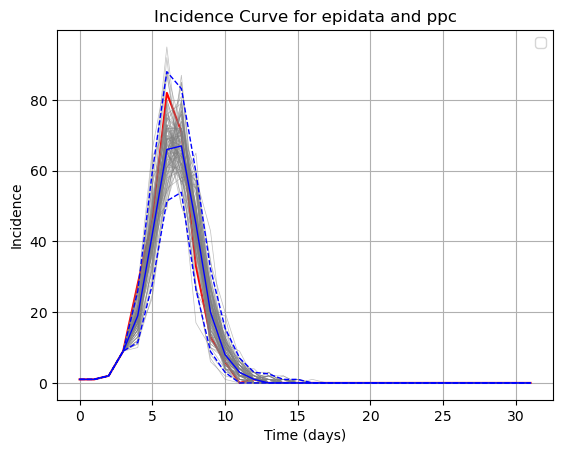

In [1112]:
#set beta to 1.5
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


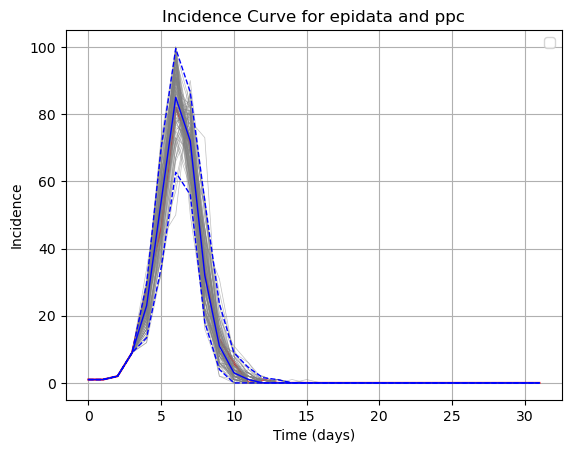

In [1116]:
#tilde_beta-1
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


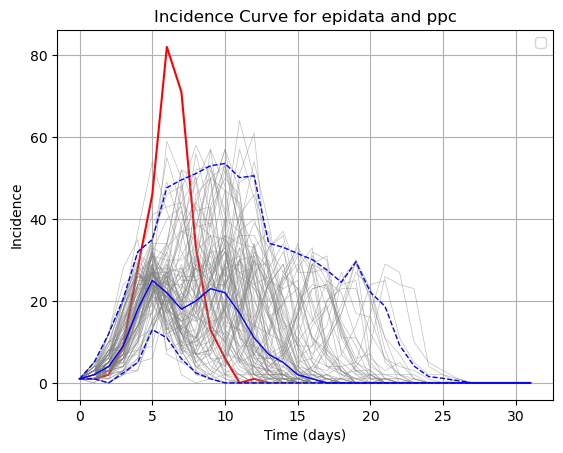

In [1114]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


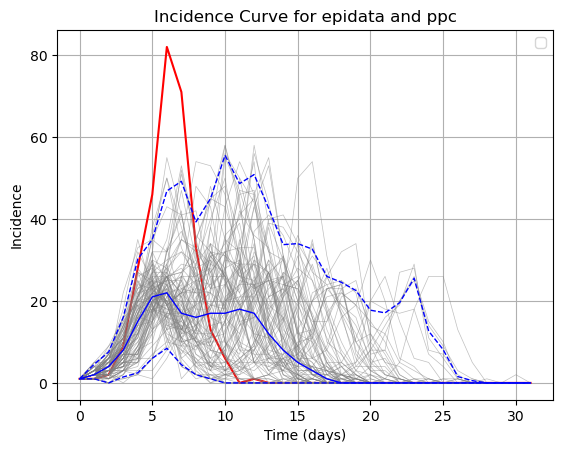

In [1113]:
#set beta to 1.5
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


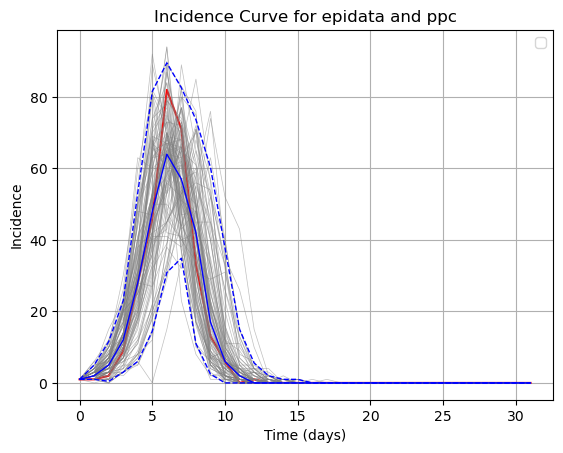

In [1115]:
# tilde_beta -1 
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [869]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


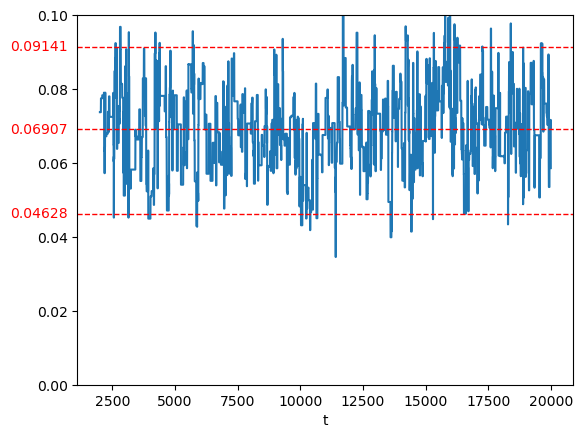

In [820]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


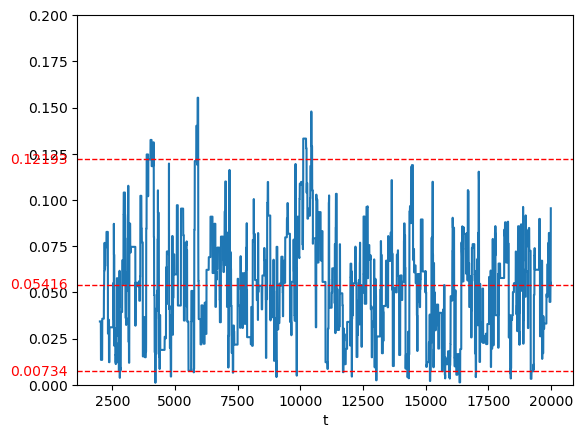

In [821]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


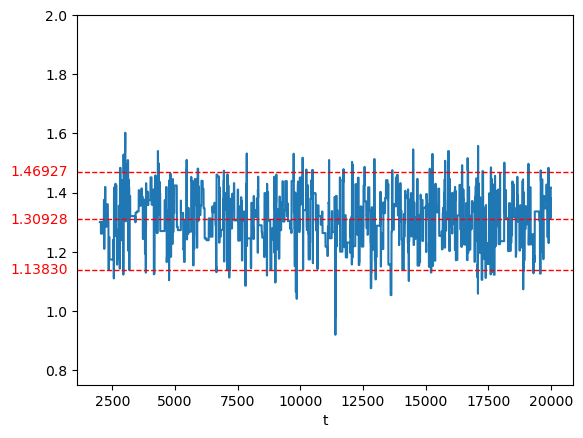

In [822]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


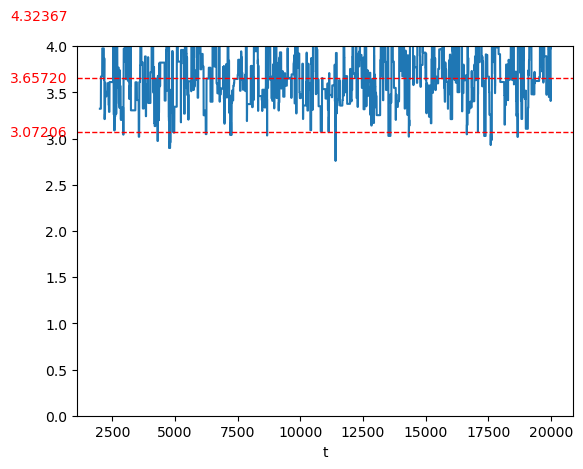

In [823]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


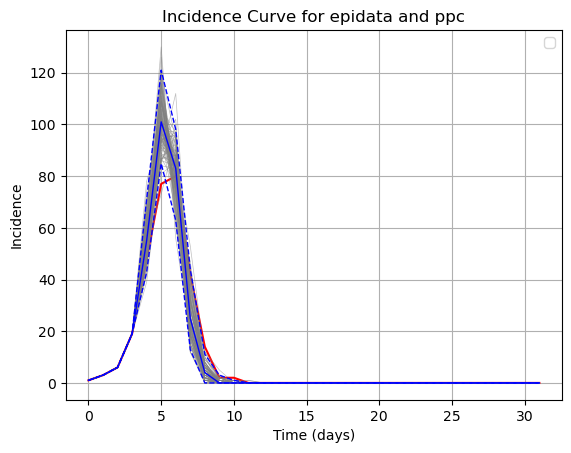

In [969]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


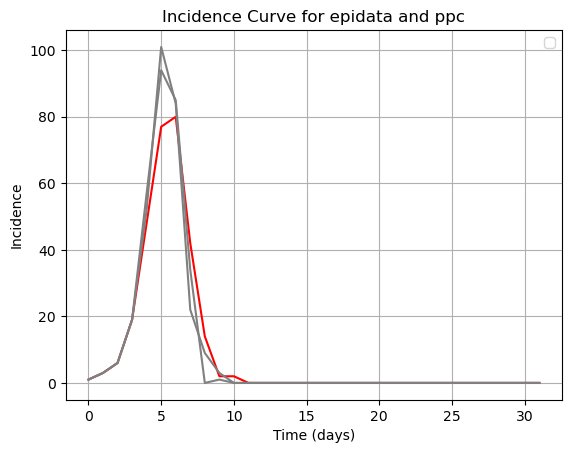

In [970]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
plt.plot(range(32), cal_inc(df_ppc.iloc[30].astype(int)), linewidth = 1.5, color = "grey")
plt.plot(range(32), cal_inc(df_ppc.iloc[50].astype(int)), linewidth = 1.5, color = "grey")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

In [936]:
def plot_t_days(ppc, time):#ppc: a row of df_ppc; time: current time
    for i in range(300):
        if ppc[i]==-1:
            if cluster_id[i]==0:
                plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==1:
                plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==2:
                plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='black', facecolors='none')
        else:
            if time<ppc[i]:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='black', facecolors='none')
            elif ppc[i]<=time<ppc[i]+3:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='red', facecolors='red')
            else:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='blue', facecolors='blue')
    plt.show()
def plot_t_days_records(time):
    for i in range(300):
        if df.iloc[i][1]==-1:
            if cluster_id[i]==0:
                plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==1:
                plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==2:
                plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='black', facecolors='none')
        else:
            if time<df.iloc[i][1]:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='black', facecolors='none')
            elif df.iloc[i][1]<=time<df.iloc[i][2]:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='red', facecolors='red')
            else:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='blue', facecolors='blue')
    plt.show()

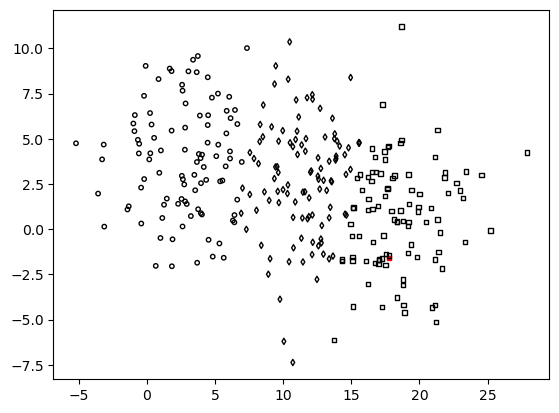

In [937]:
plot_t_days_records(0)

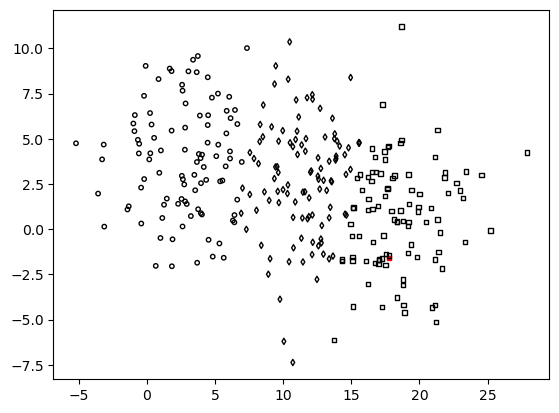

In [938]:
plot_t_days(df_ppc.iloc[30], 0)

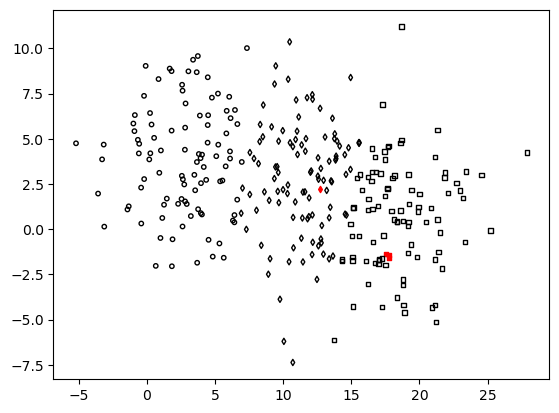

In [939]:
plot_t_days_records(1)

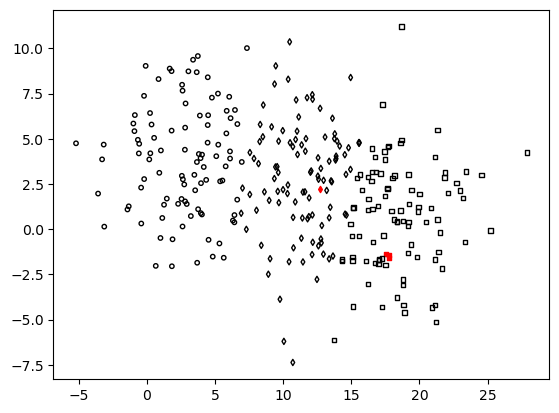

In [940]:
plot_t_days(df_ppc.iloc[30], 1)

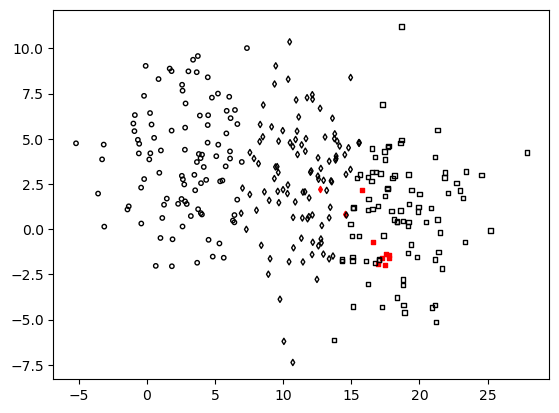

In [941]:
plot_t_days_records(2)

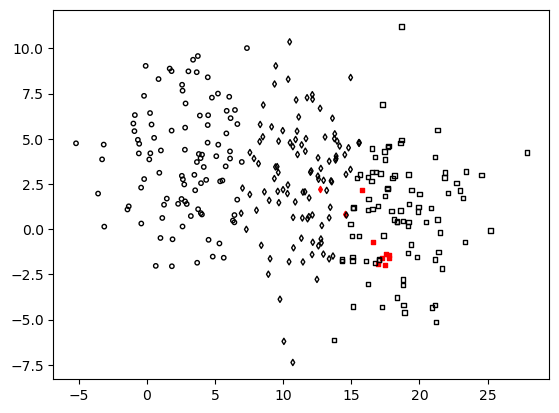

In [942]:
plot_t_days(df_ppc.iloc[30], 2)

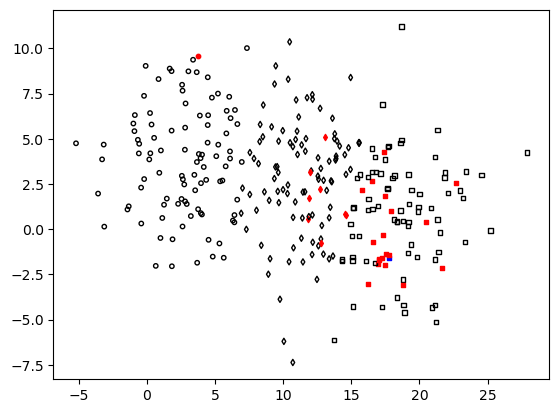

In [943]:
plot_t_days_records(3)

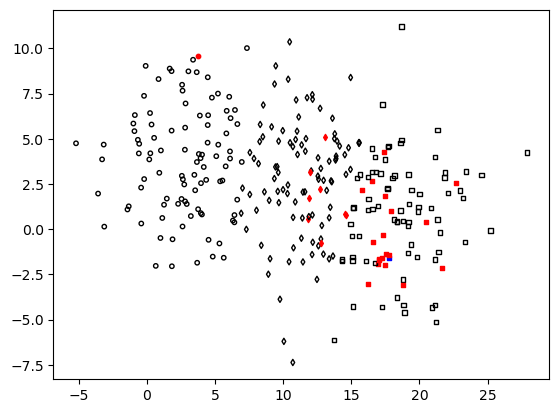

In [944]:
plot_t_days(df_ppc.iloc[30], 3)

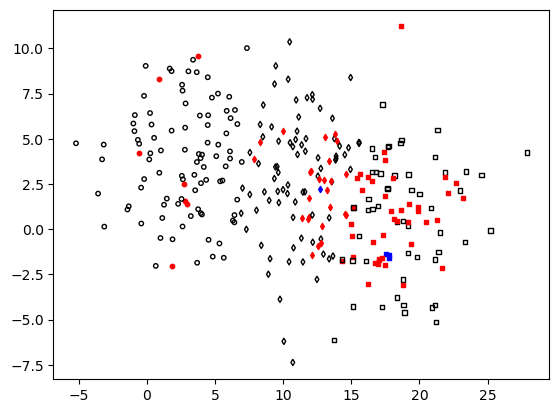

In [945]:
plot_t_days_records(4)

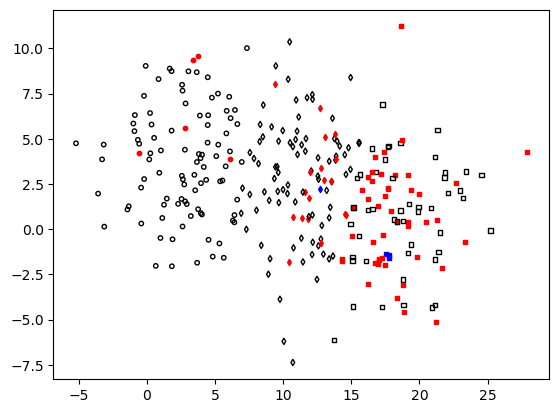

In [946]:
plot_t_days(df_ppc.iloc[30], 4)

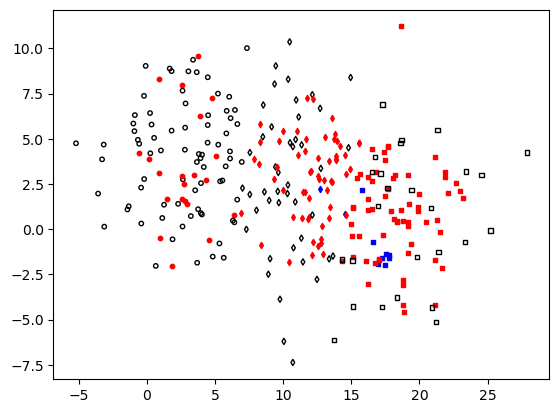

In [947]:
plot_t_days_records(5)

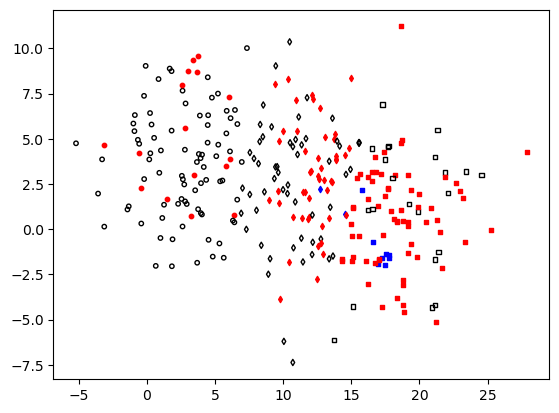

In [948]:
plot_t_days(df_ppc.iloc[30], 5)

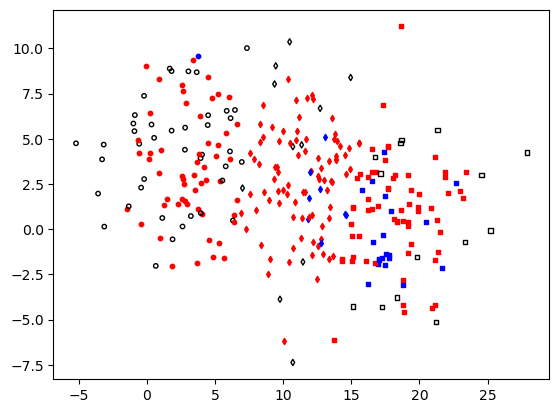

In [949]:
plot_t_days_records(6)

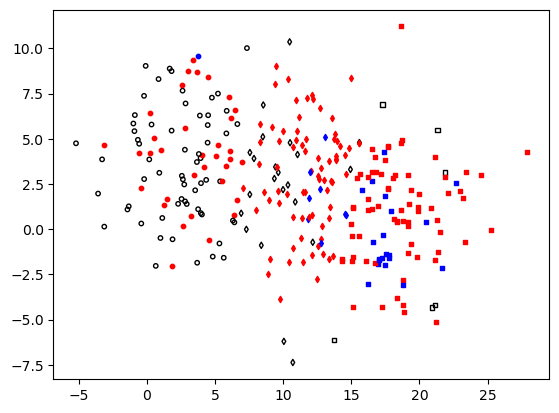

In [950]:
plot_t_days(df_ppc.iloc[30], 6)

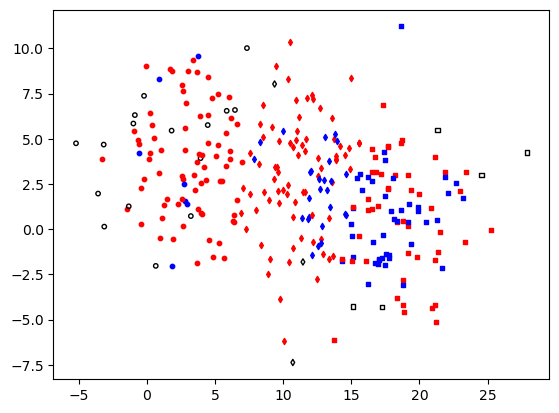

In [951]:
plot_t_days_records(7)

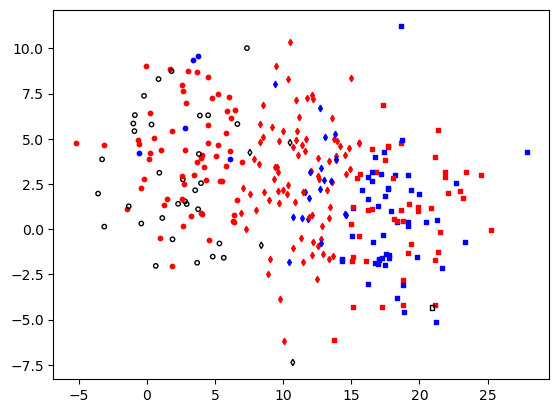

In [952]:
plot_t_days(df_ppc.iloc[30], 7)

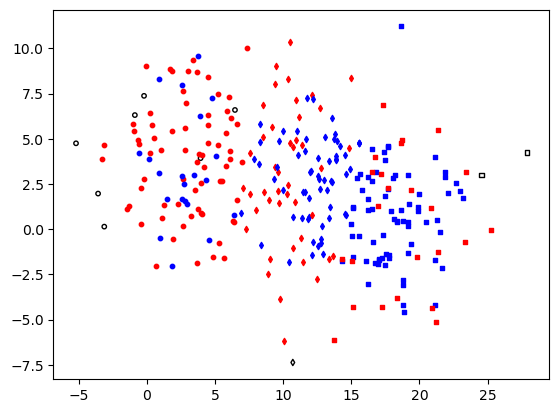

In [953]:
plot_t_days_records(8)

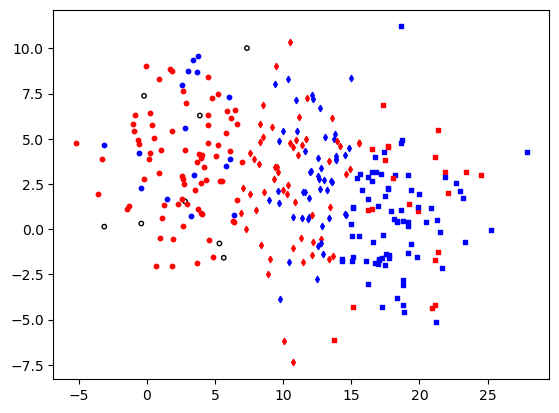

In [954]:
plot_t_days(df_ppc.iloc[30], 8)

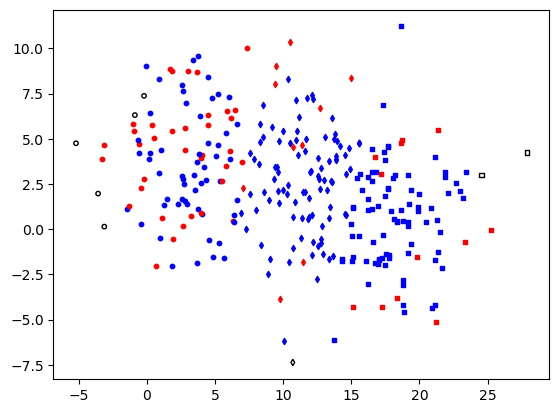

In [955]:
plot_t_days_records(9)

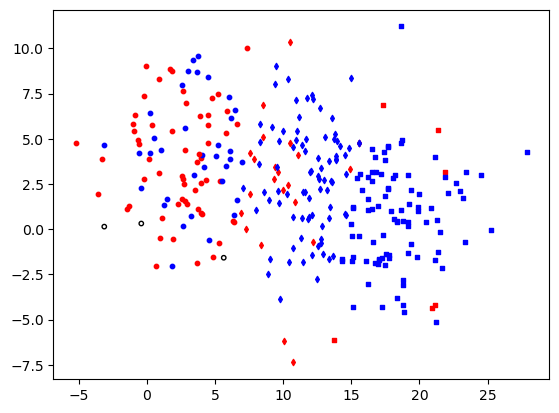

In [956]:
plot_t_days(df_ppc.iloc[30], 9)

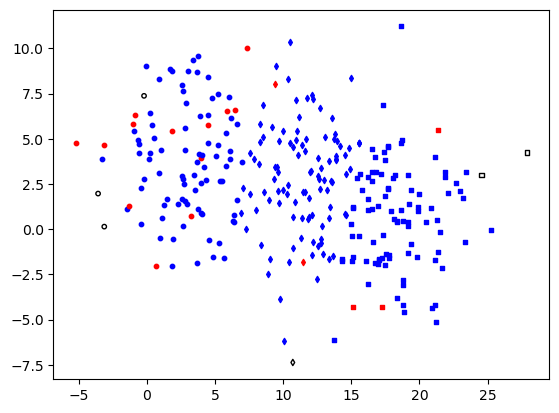

In [957]:
plot_t_days_records(10)

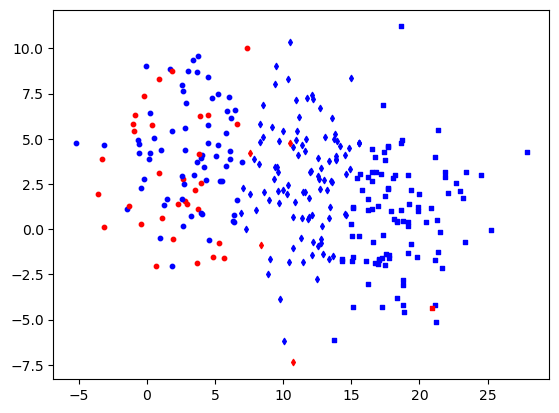

In [958]:
plot_t_days(df_ppc.iloc[30], 10)

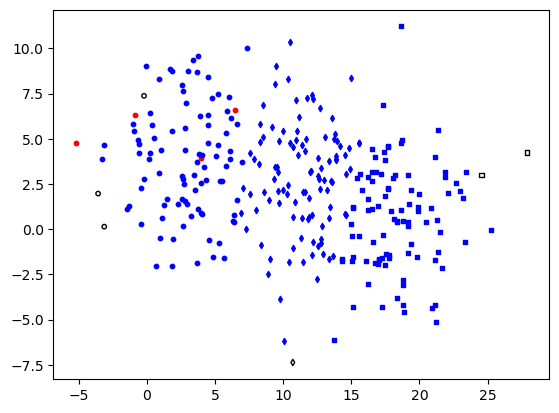

In [959]:
plot_t_days_records(11)

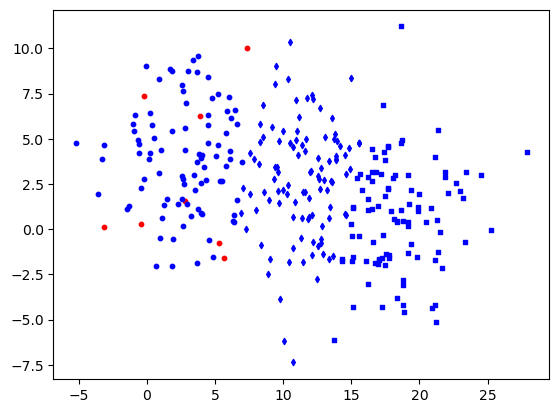

In [960]:
plot_t_days(df_ppc.iloc[30], 11)

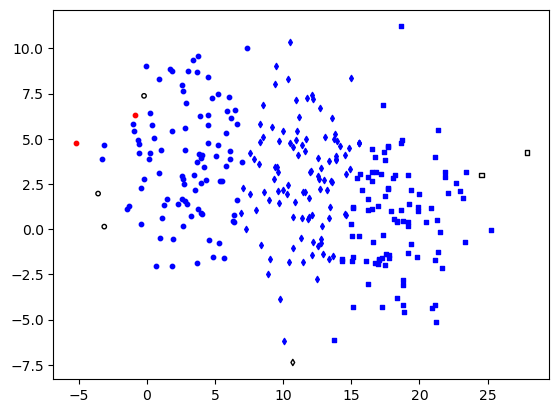

In [961]:
plot_t_days_records(12)

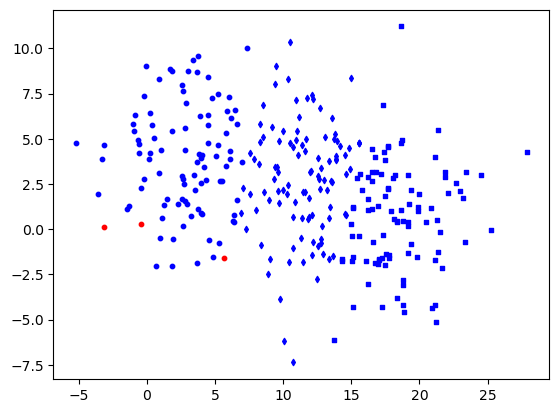

In [962]:
plot_t_days(df_ppc.iloc[30], 12)

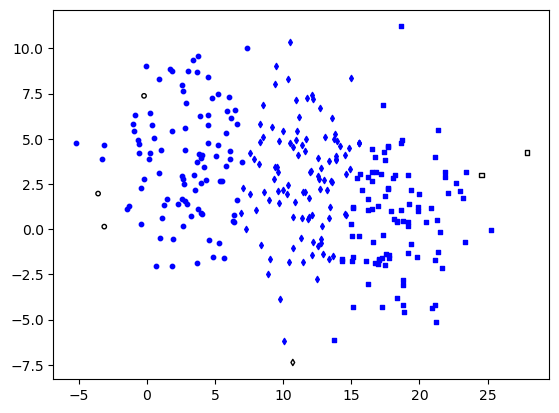

In [963]:
plot_t_days_records(13)

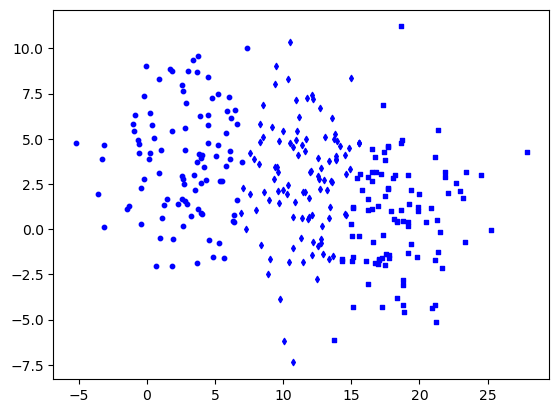

In [964]:
plot_t_days(df_ppc.iloc[30], 13)

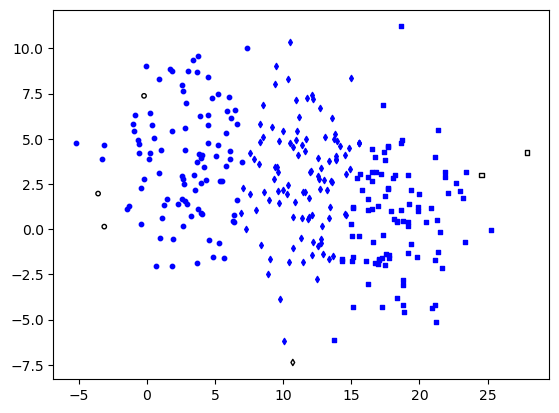

In [965]:
plot_t_days_records(14)

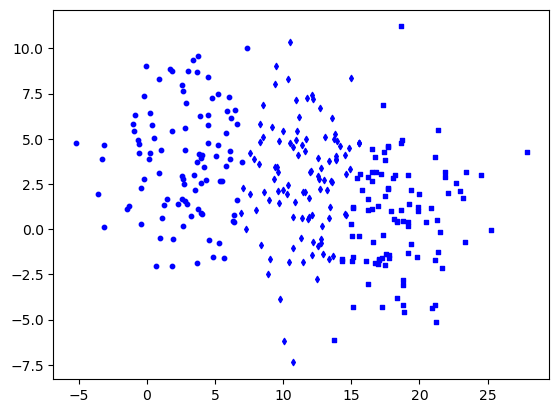

In [966]:
plot_t_days(df_ppc.iloc[30], 14)

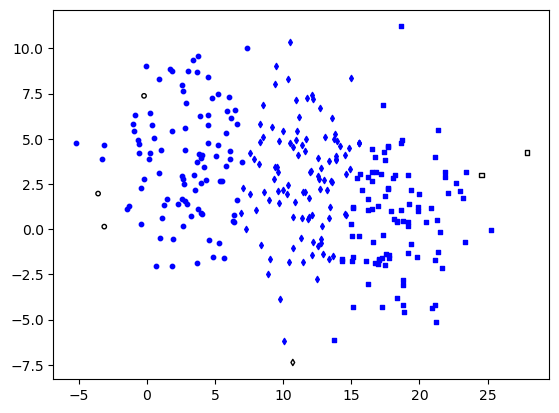

In [967]:
plot_t_days_records(15)

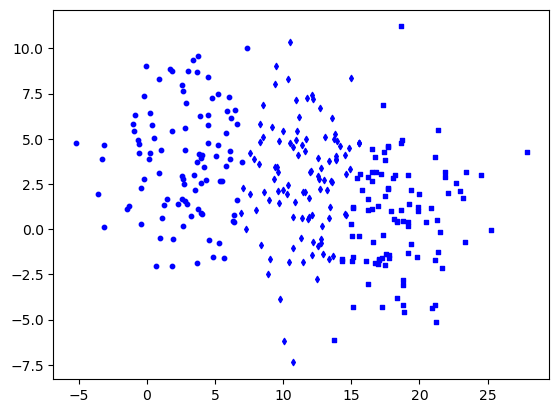

In [968]:
plot_t_days(df_ppc.iloc[30], 15)

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


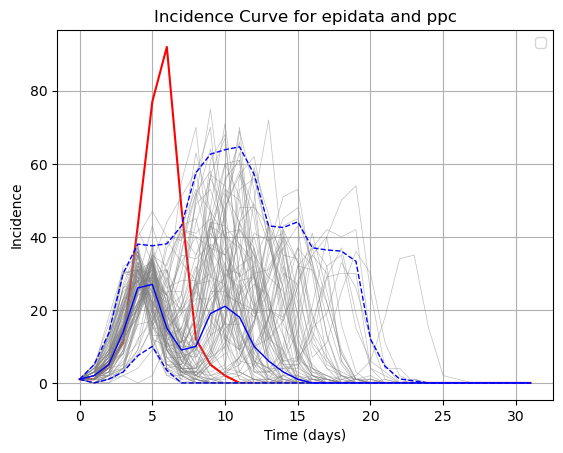

In [621]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 4 Clusters

## Spread of Infection

(-1.0, 40.0)

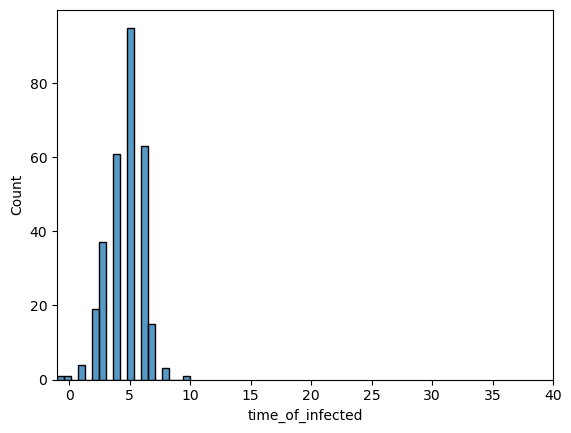

In [993]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]
sns.histplot(time)
plt.xlim(-1, 40)

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


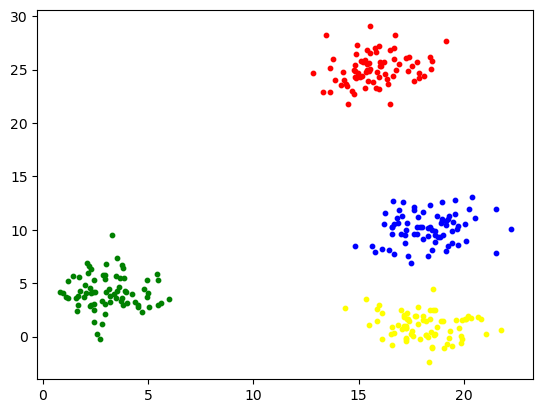

In [994]:
X = df[["position_x", "position_y"]].values
n_clusters = 4
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [995]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [652]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


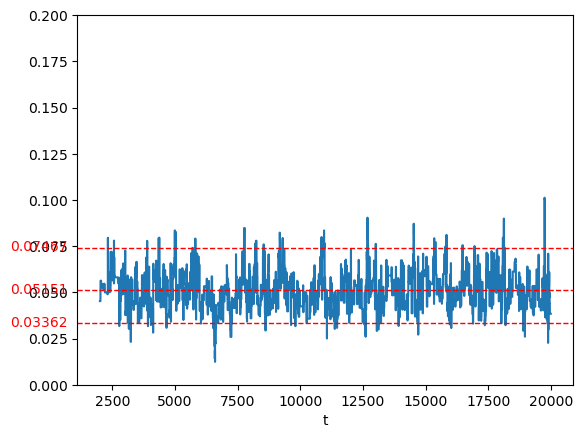

In [653]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


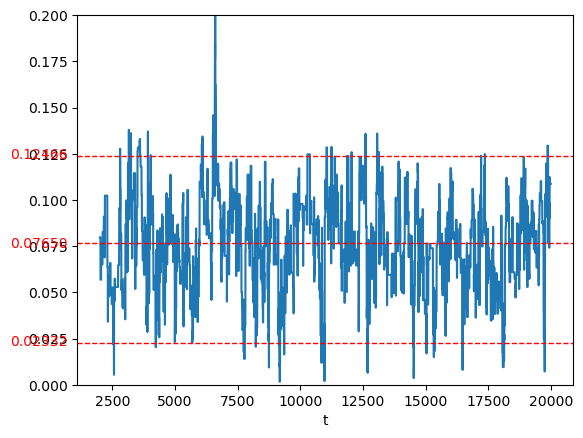

In [654]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


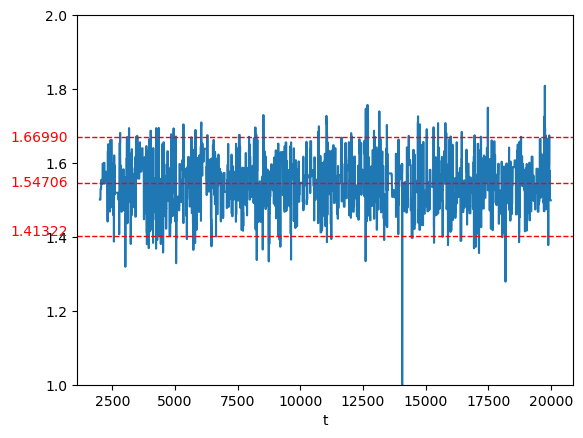

In [655]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


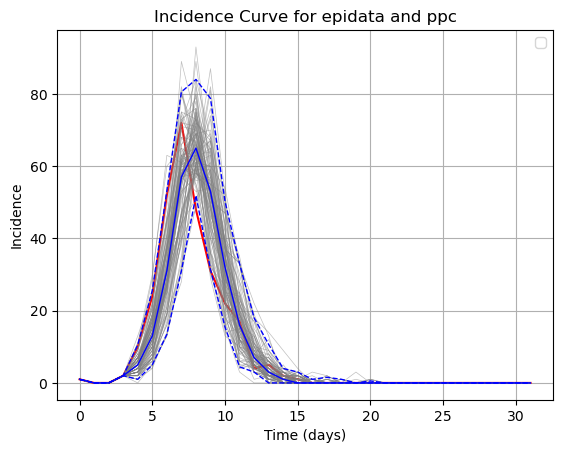

In [656]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


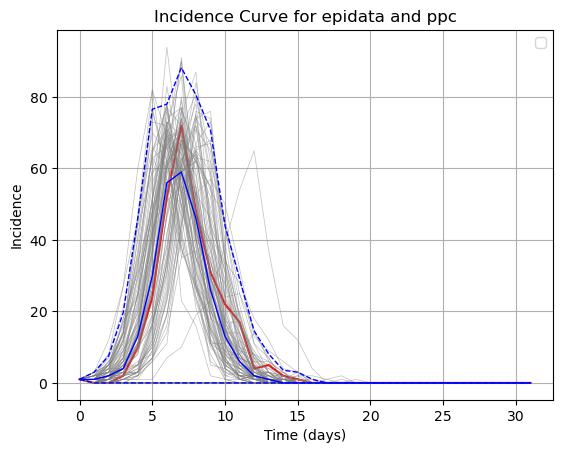

In [657]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model I: with tilde_beta

In [110]:
#full model
#composite-between clusters
samples_composite_bc_tilde = pd.read_csv('samples_composite_bc_tilde.csv')
samples_compositebc_tilde_a0 = pd.DataFrame(samples_composite_bc_tilde["a0"])
samples_compositebc_tilde_a1 = pd.DataFrame(samples_composite_bc_tilde["a1"])
samples_compositebc_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["beta"])
samples_compositebc_tilde_epsilon = pd.DataFrame(samples_composite_bc_tilde["epsilon"])
samples_compositebc_tilde_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["tilde_beta"])


### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


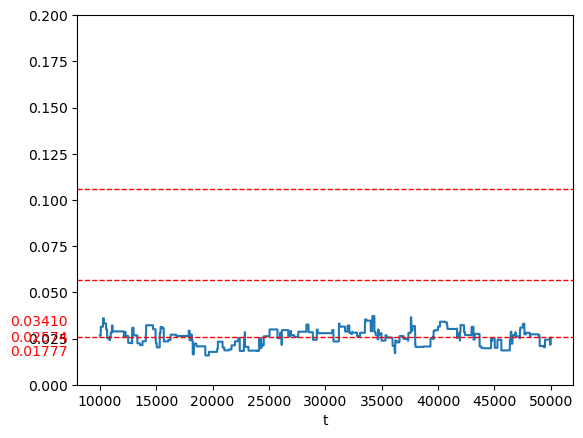

In [111]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a0[9999:50000])[0]
p025 = samples_compositebc_tilde_a0[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


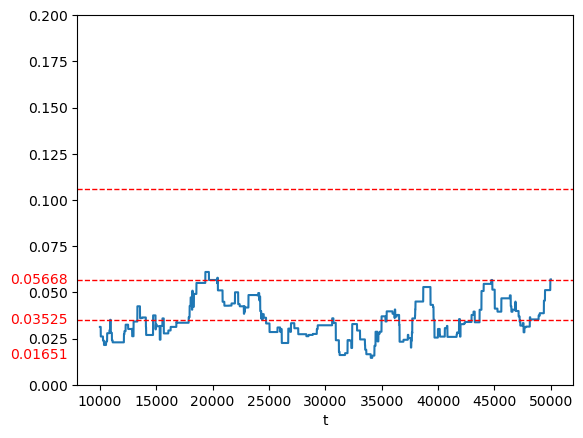

In [112]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a1[9999:50000])[0]
p025 = samples_compositebc_tilde_a1[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


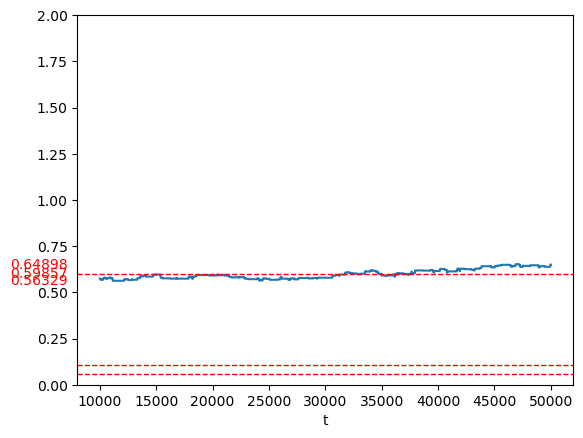

In [113]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_beta[9999:50000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\epsilon$


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


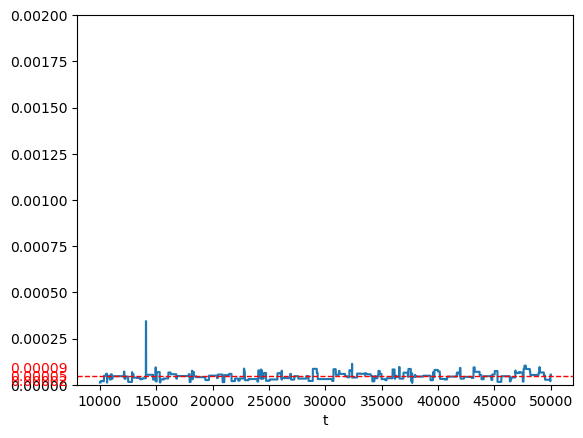

In [114]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_epsilon[9999:50000])[0]
p025 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_epsilon[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


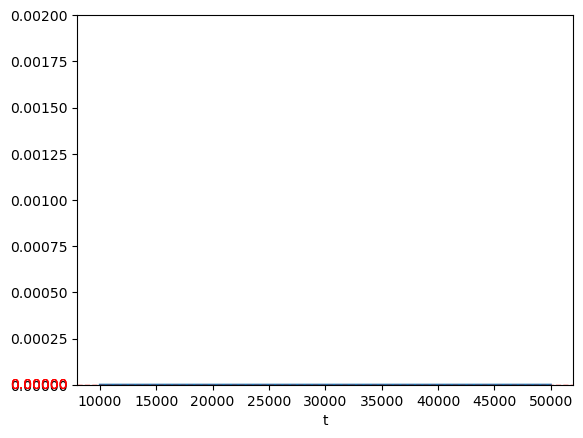

In [115]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_tilde_beta[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Model II: without tilde_beta

In [7]:
#composite-between clusters
samples_composite_bc = pd.read_csv('samples_composite_bc.csv')
samples_compositebc_a0 = pd.DataFrame(samples_composite_bc["a0"])
samples_compositebc_a1 = pd.DataFrame(samples_composite_bc["a1"])
samples_compositebc_beta = pd.DataFrame(samples_composite_bc["beta"])
samples_compositebc_epsilon = pd.DataFrame(samples_composite_bc["epsilon"])

### $\alpha_{0}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


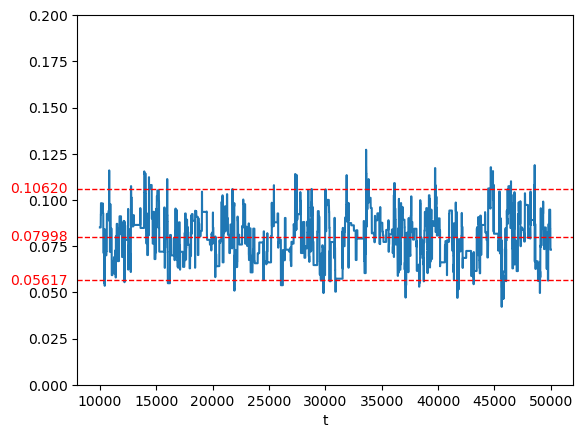

In [33]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_a0[9999:50000])[0]
p025 = samples_compositebc_a0[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


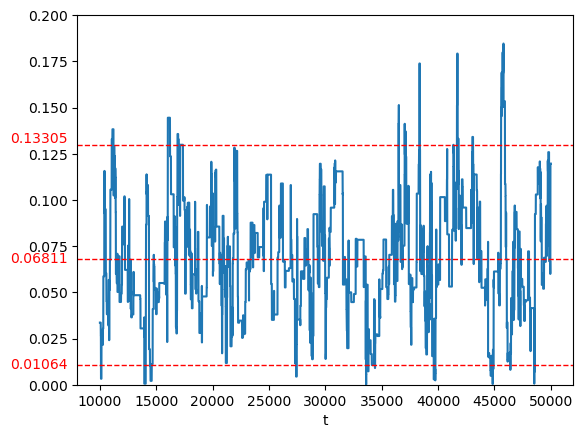

In [34]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_a1[9999:50000])[0]
p025 = samples_compositebc_a1[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


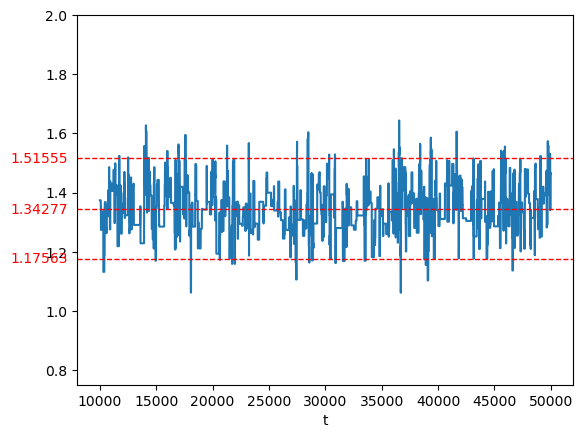

In [38]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_beta[9999:50000])[0]
p025 = samples_compositebc_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_beta[9999:50000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\epsilon$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


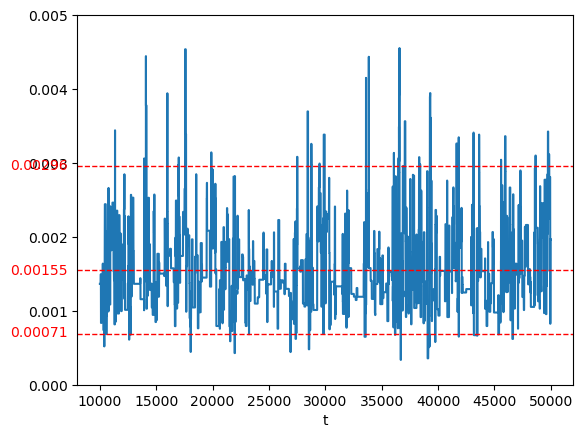

In [43]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_epsilon[9999:50000])[0]
p025 = samples_compositebc_epsilon[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_epsilon[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_epsilon[9999:50000])
plt.ylim(0, 0.005)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_epsilon.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_epsilon.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Model III: without epsilon

In [996]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


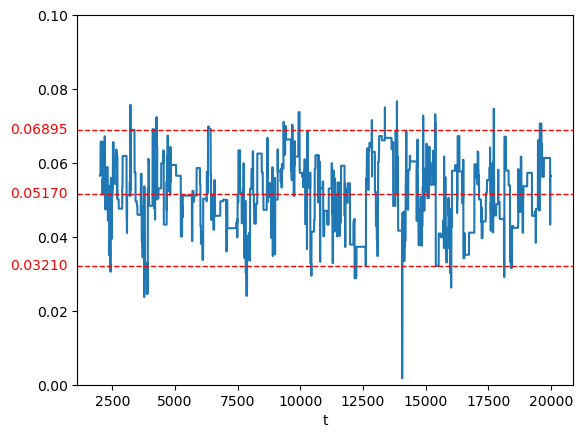

In [997]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


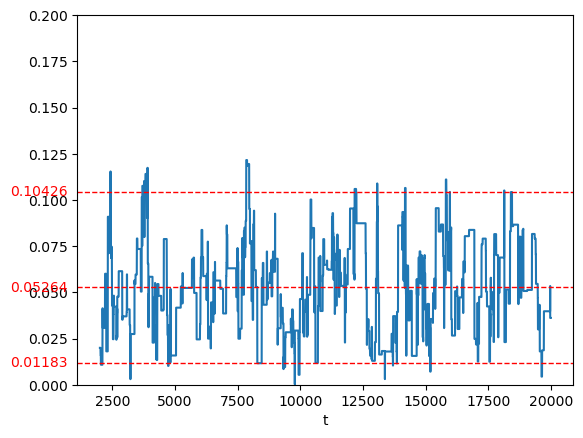

In [998]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


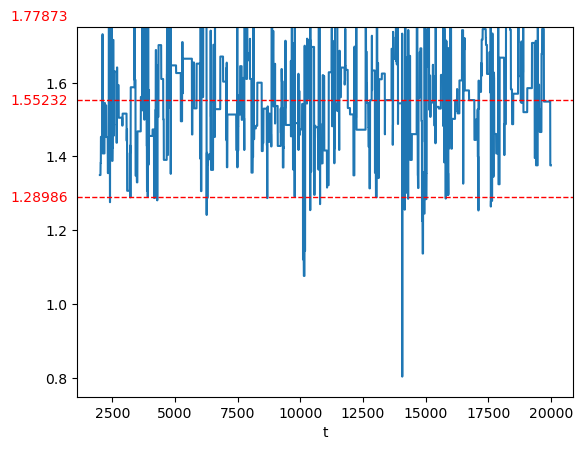

In [999]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


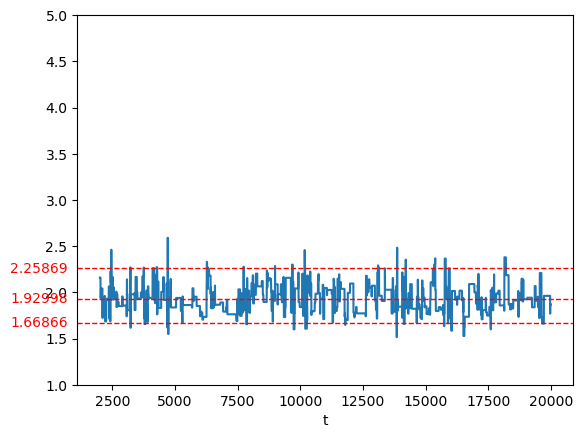

In [1001]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(1, 5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


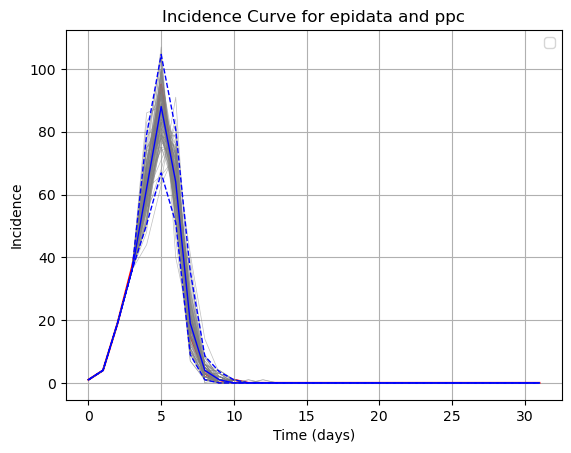

In [1007]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


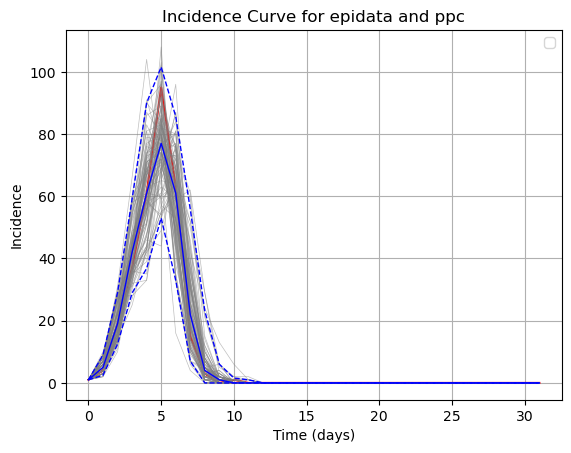

In [1004]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [633]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


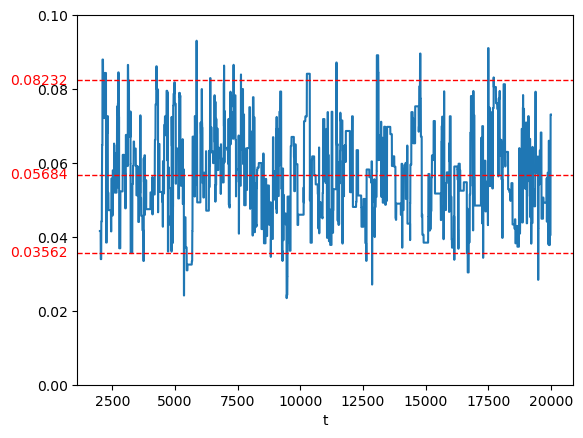

In [632]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


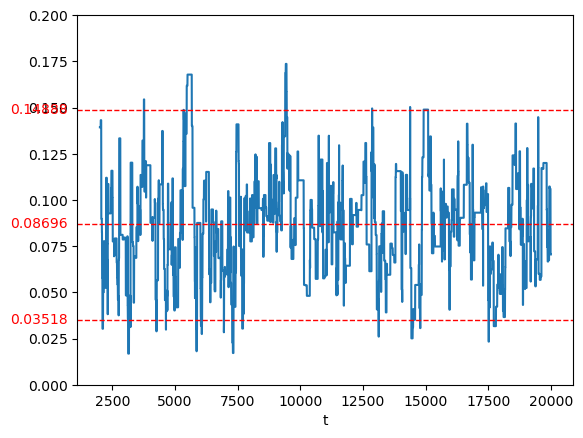

In [634]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


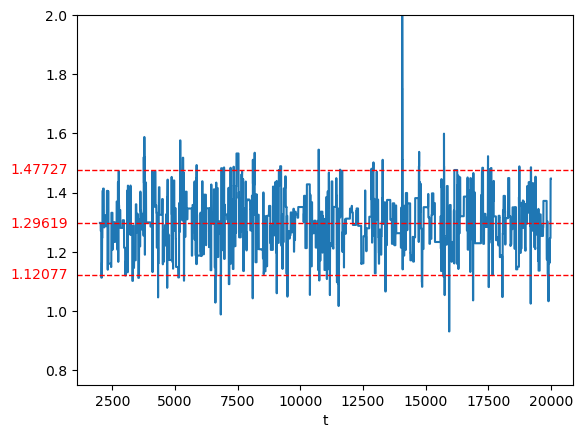

In [635]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


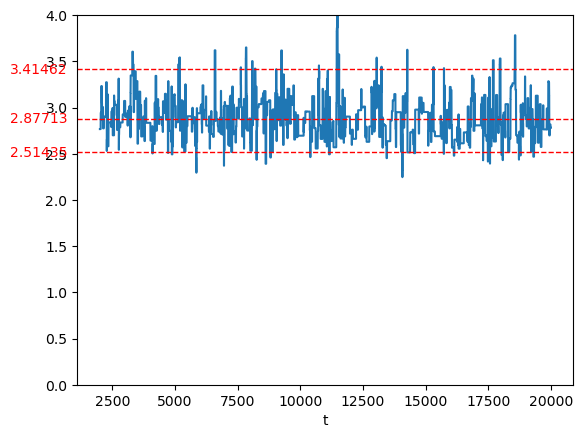

In [636]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


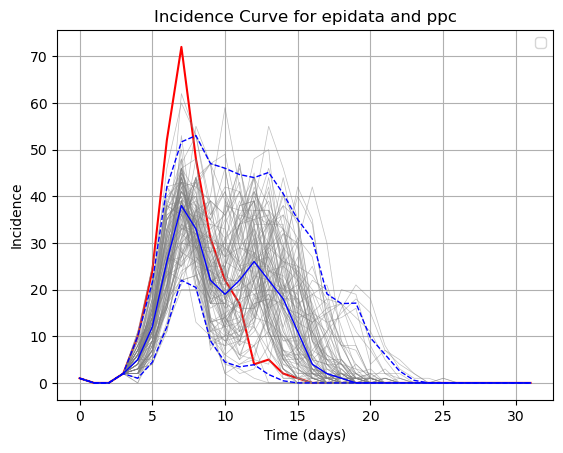

In [637]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


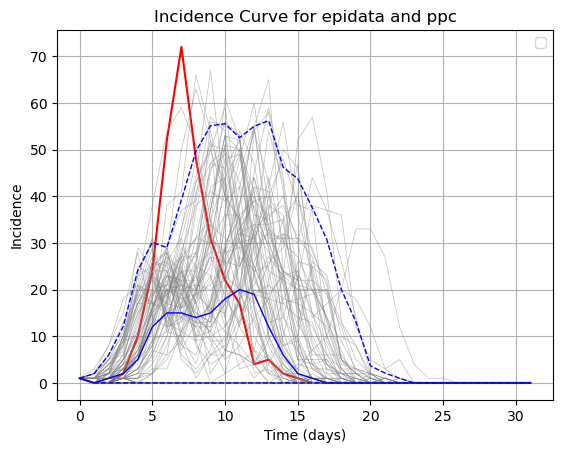

In [638]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model V: likelihood inflated

In [94]:
samples_composite_bc_tilde_woeps_infcentroids_inflated = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids_inflated.csv')
samples_composite_bc_tilde_woeps_infcentroids_inflated_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a0"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a1"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["beta"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["tilde_beta"])

### $\alpha_{0}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


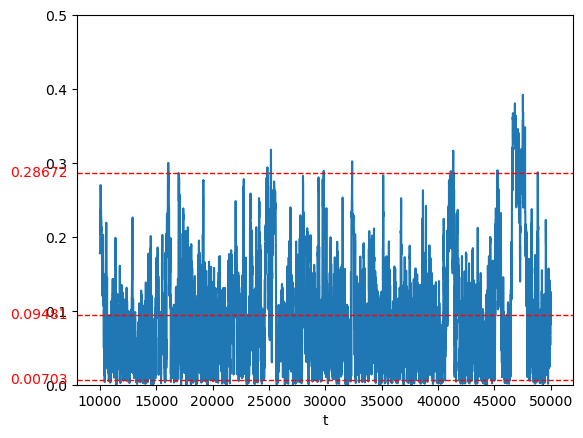

In [95]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])
plt.ylim(0, 0.5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


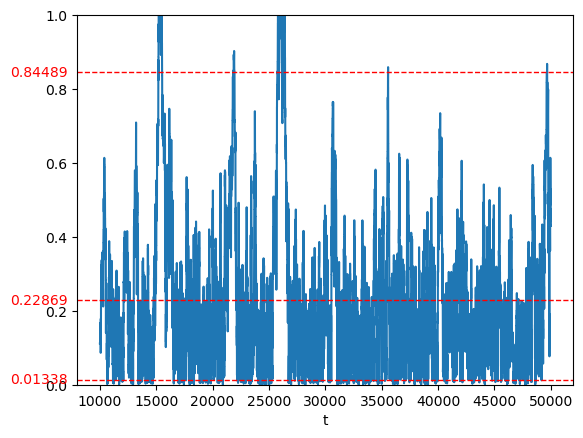

In [96]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])
plt.ylim(0, 1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


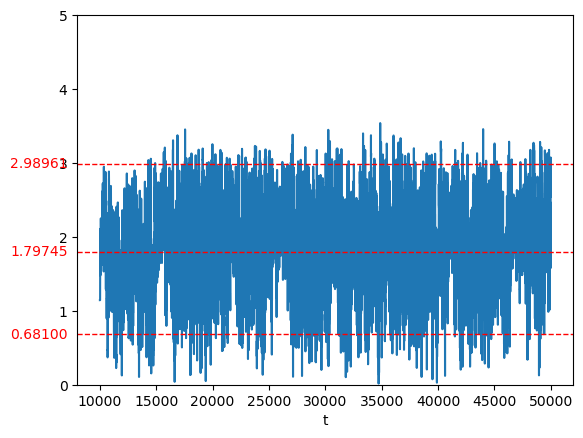

In [97]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])
plt.ylim(0, 5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


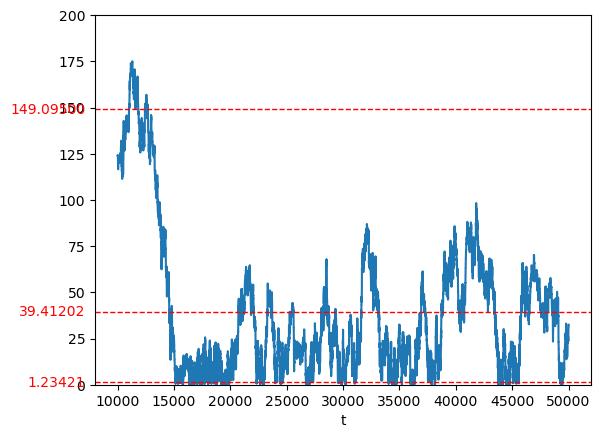

In [99]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])
plt.ylim(0, 200)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

# 5 Clusters

(-1.0, 40.0)

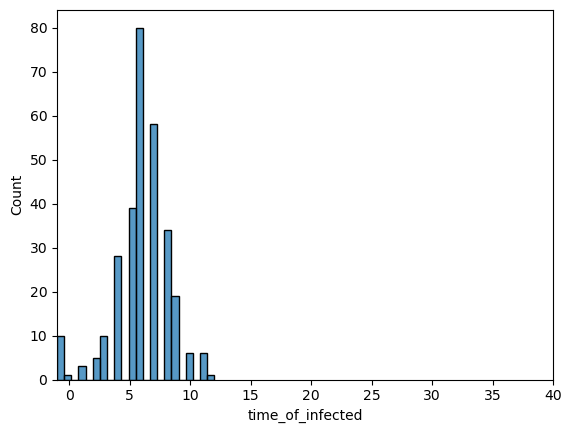

In [658]:
df = pd.read_csv('records.csv')
time = df["time_of_infected"]
sns.histplot(time)
plt.xlim(-1, 40)

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


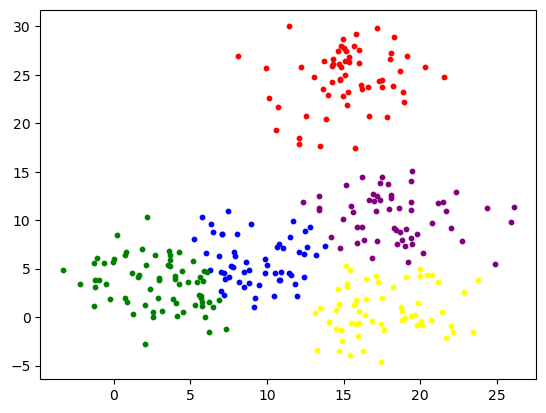

In [659]:
X = df[["position_x", "position_y"]].values
n_clusters = 5
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [660]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [661]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


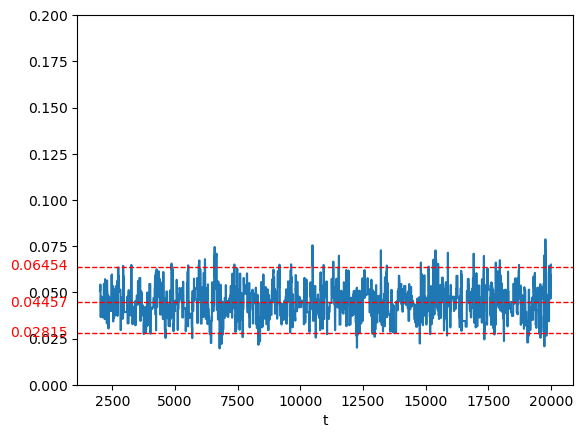

In [662]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


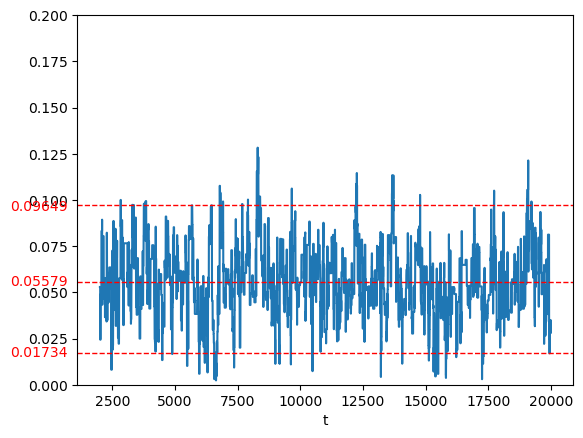

In [663]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


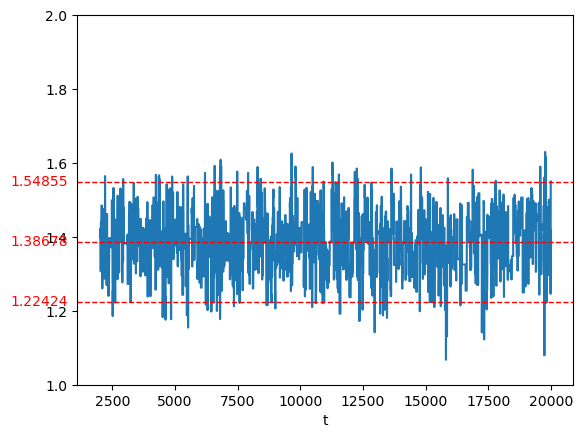

In [664]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


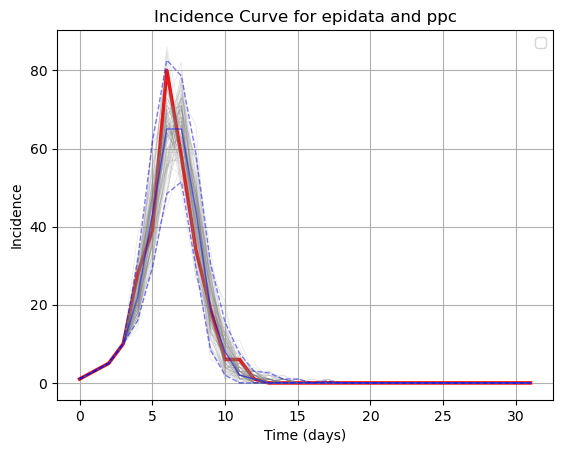

In [667]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 2.5, color = "red")
#plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "green")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.2)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue", alpha = 0.5)
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue", alpha = 0.5)
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue", alpha = 0.5)
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


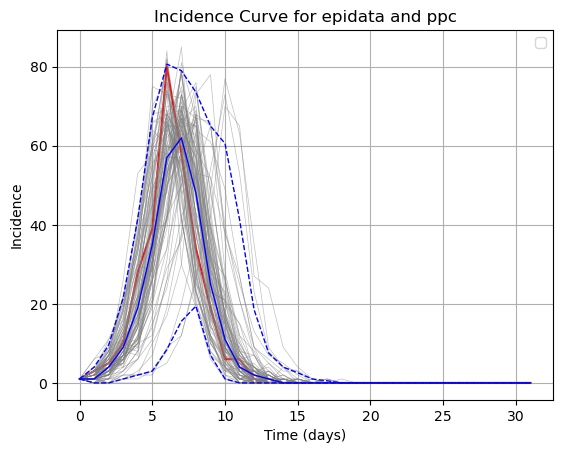

In [666]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model I: with tilde_beta

In [668]:
#full model
#composite-between clusters
samples_composite_bc_tilde = pd.read_csv('samples_composite_bc_tilde.csv')
samples_compositebc_tilde_a0 = pd.DataFrame(samples_composite_bc_tilde["a0"])
samples_compositebc_tilde_a1 = pd.DataFrame(samples_composite_bc_tilde["a1"])
samples_compositebc_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["beta"])
samples_compositebc_tilde_epsilon = pd.DataFrame(samples_composite_bc_tilde["epsilon"])
samples_compositebc_tilde_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["tilde_beta"])


### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


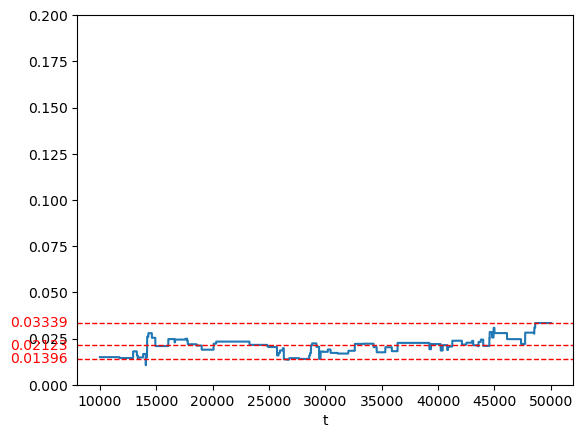

In [146]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a0[9999:50000])[0]
p025 = samples_compositebc_tilde_a0[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_tilde_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_tilde_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


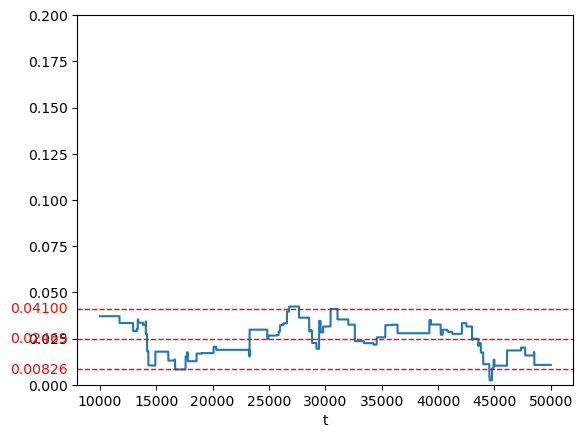

In [147]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a1[9999:50000])[0]
p025 = samples_compositebc_tilde_a1[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


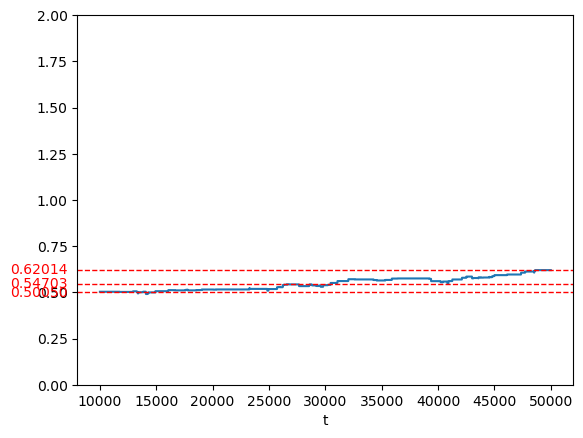

In [148]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_beta[9999:50000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\epsilon$


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


IndexError: invalid index to scalar variable.

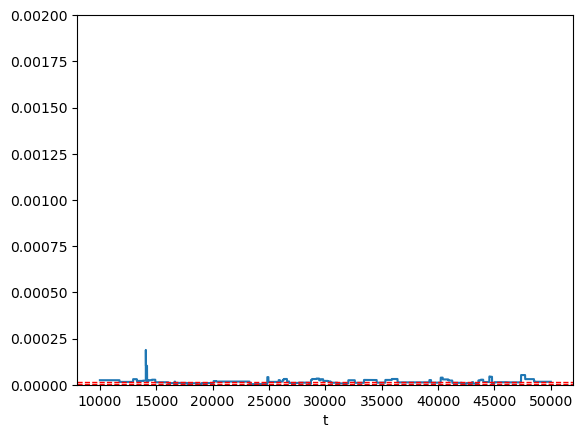

In [149]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_epsilon[9999:50000])[0]
p025 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_epsilon[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


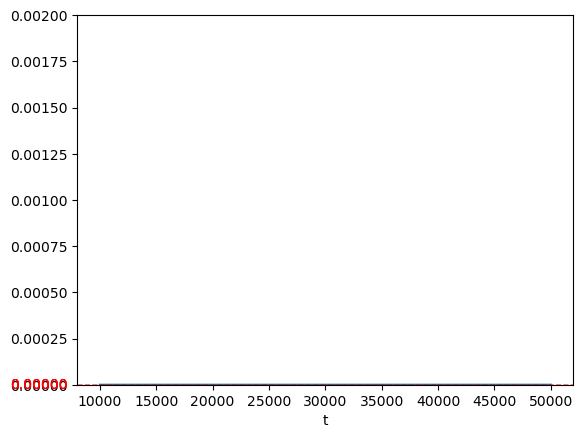

In [150]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_tilde_beta[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Model II: without tilde_beta

In [62]:
#composite-between clusters
samples_composite_bc = pd.read_csv('samples_composite_bc.csv')
samples_compositebc_a0 = pd.DataFrame(samples_composite_bc["a0"])
samples_compositebc_a1 = pd.DataFrame(samples_composite_bc["a1"])
samples_compositebc_beta = pd.DataFrame(samples_composite_bc["beta"])
samples_compositebc_epsilon = pd.DataFrame(samples_composite_bc["epsilon"])

### $\alpha_0$

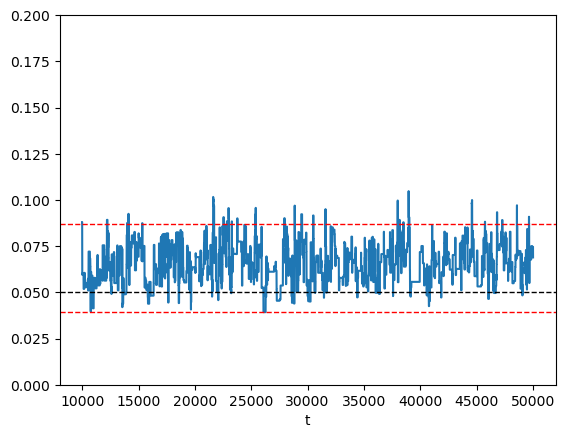

In [63]:
times = range(9999,50000)
plt.plot(times, samples_compositebc_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(0.05,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [64]:
print(np.mean(samples_compositebc_a0[9999:50000]))
print(samples_compositebc_a0.quantile(0.025)[0], samples_compositebc_a0.quantile(0.975)[0])

a0    0.065432
dtype: float64
0.0392753 0.0867619


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\alpha_1$

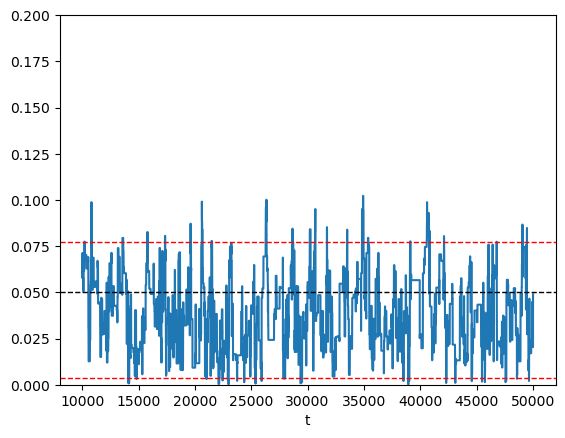

In [65]:
plt.plot(times, samples_compositebc_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(0.05,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [66]:
print(np.mean(samples_compositebc_a1[9999:50000]))
print(samples_compositebc_a1.quantile(0.025)[0], samples_compositebc_a1.quantile(0.975)[0])

a1    0.038863
dtype: float64
0.00344554 0.0774126


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\beta$

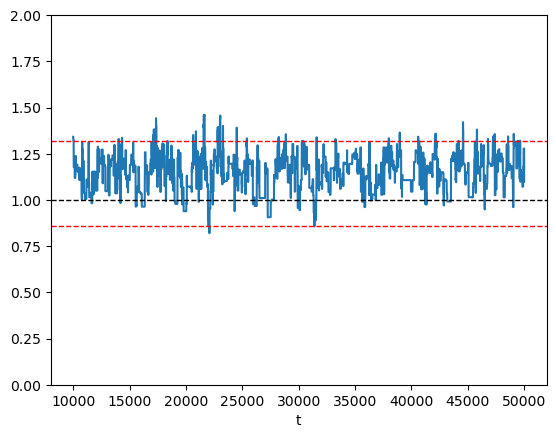

In [67]:
plt.plot(times, samples_compositebc_beta[9999:50000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(1,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [68]:
print(np.mean(samples_compositebc_beta[9999:50000]))
print(samples_compositebc_beta.quantile(0.025)[0], samples_compositebc_beta.quantile(0.975)[0])

beta    1.149051
dtype: float64
0.859541 1.31861


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\epsilon$

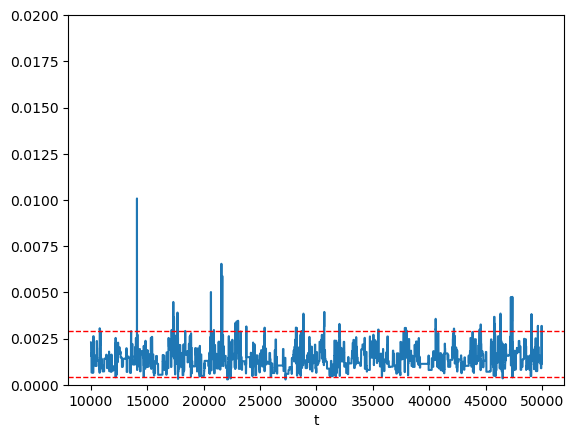

In [69]:
plt.plot(times, samples_compositebc_epsilon[9999:50000])
plt.ylim(0, 0.02)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_epsilon.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_epsilon.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
plt.show()

In [54]:
print(np.mean(samples_compositebc_epsilon[9999:50000]))
print(samples_compositebc_epsilon.quantile(0.025)[0], samples_compositebc_epsilon.quantile(0.975)[0])

epsilon    0.00132
dtype: float64
0.000429079 0.00280906


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


## Model III: without epsilon

In [678]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


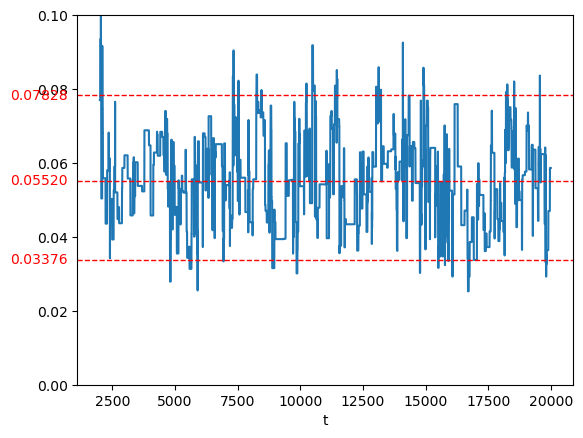

In [679]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


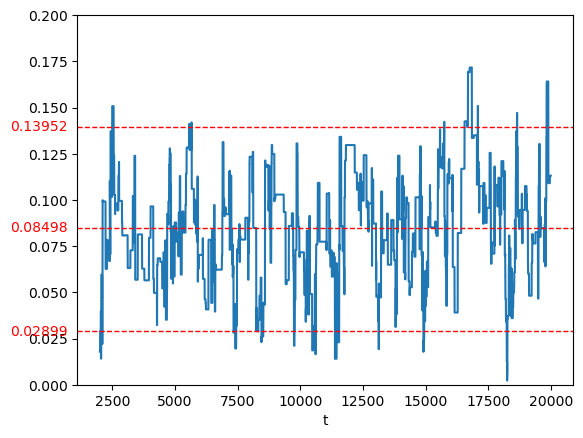

In [680]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


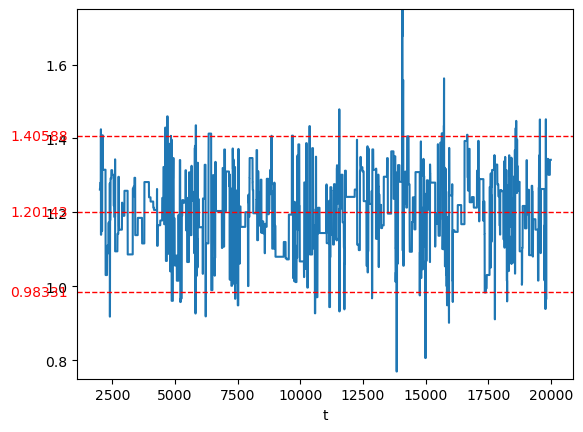

In [681]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


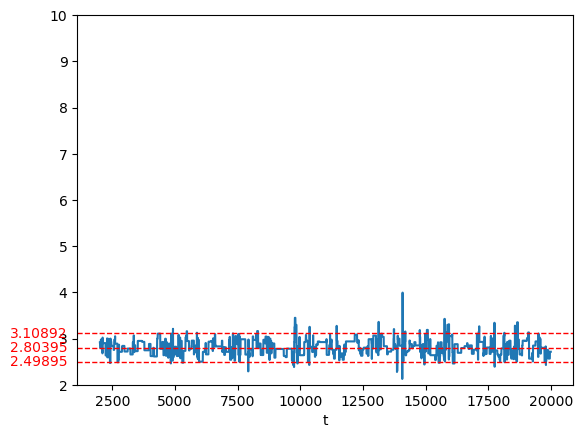

In [682]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 10)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


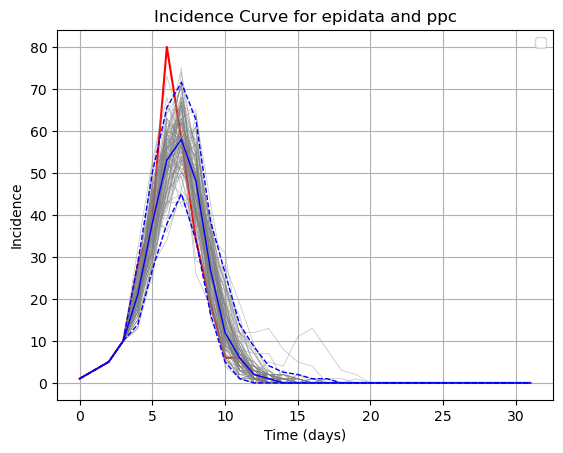

In [684]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


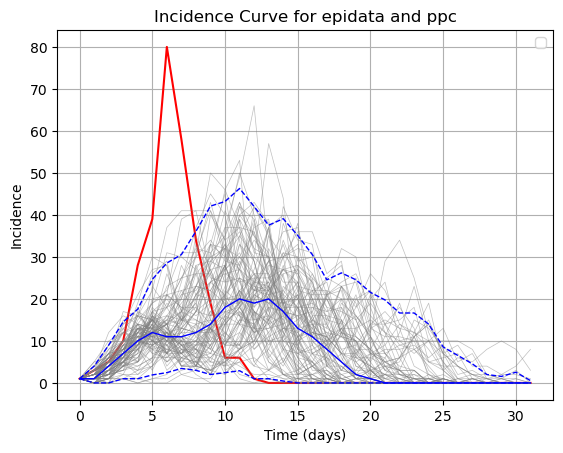

In [683]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [685]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


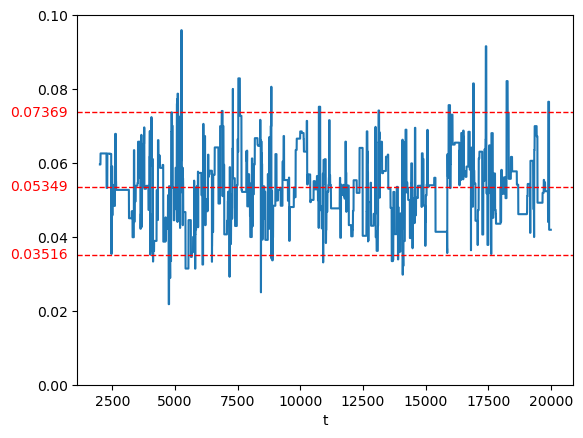

In [686]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


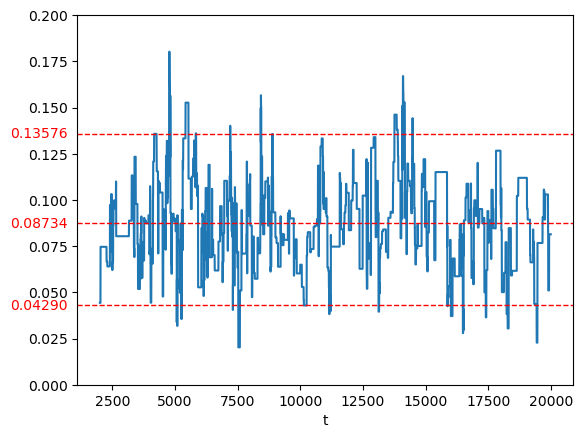

In [687]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


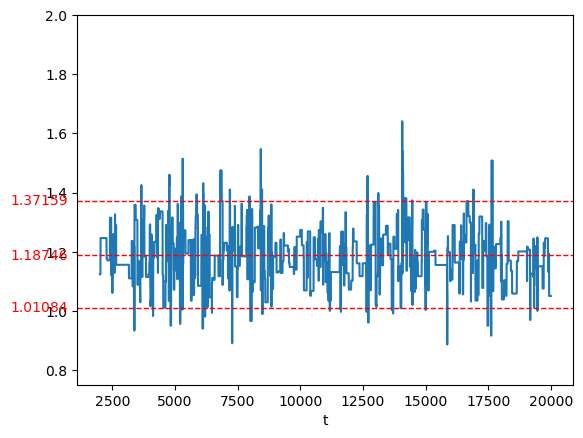

In [688]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


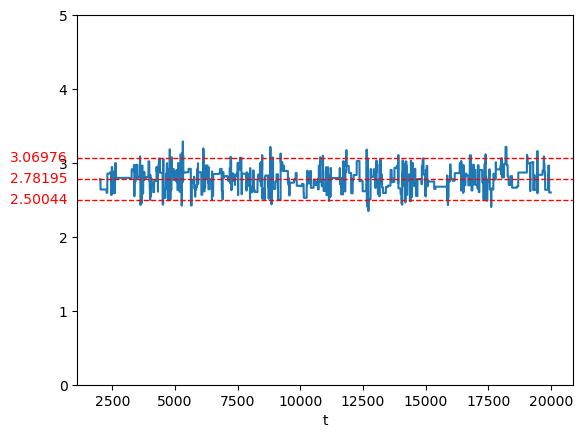

In [690]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution-start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


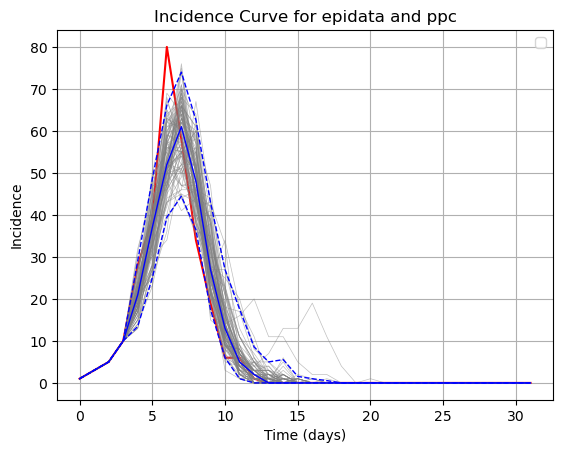

In [693]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
#plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


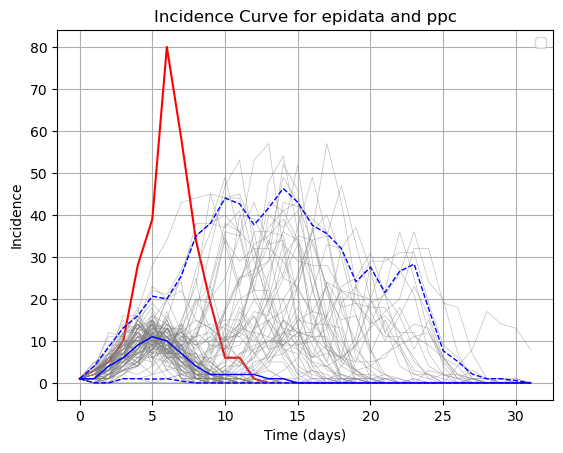

In [694]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model V: likelihood inflated

In [137]:
samples_composite_bc_tilde_woeps_infcentroids_inflated = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids_inflated.csv')
samples_composite_bc_tilde_woeps_infcentroids_inflated_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a0"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a1"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["beta"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["tilde_beta"])

### $\alpha_{0}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


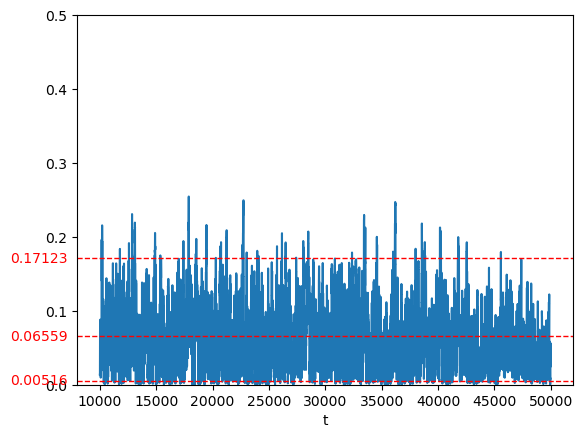

In [138]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])
plt.ylim(0, 0.5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


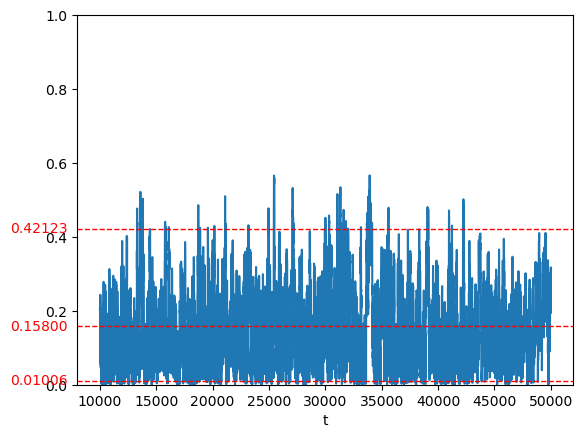

In [139]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])
plt.ylim(0, 1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


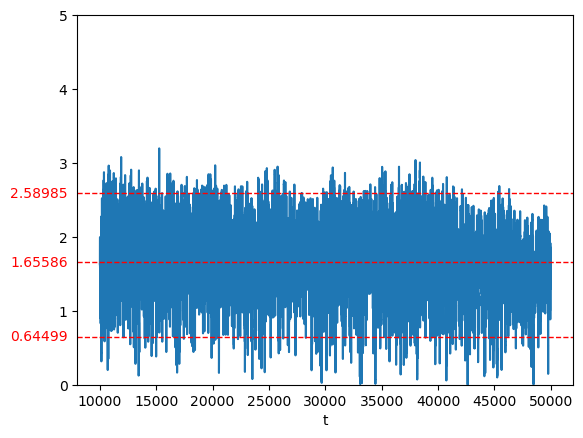

In [140]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])
plt.ylim(0, 5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


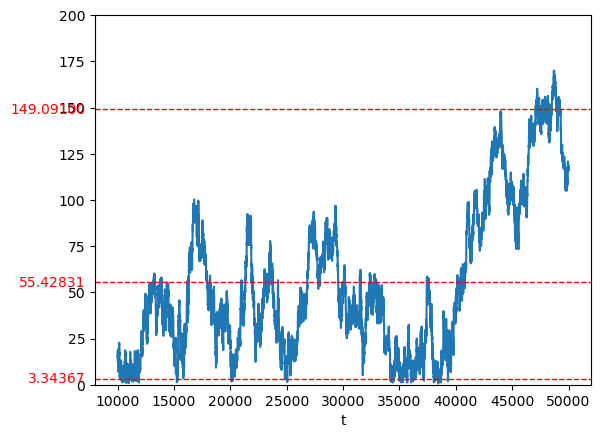

In [141]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])
plt.ylim(0, 200)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Posterior predictive distributions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


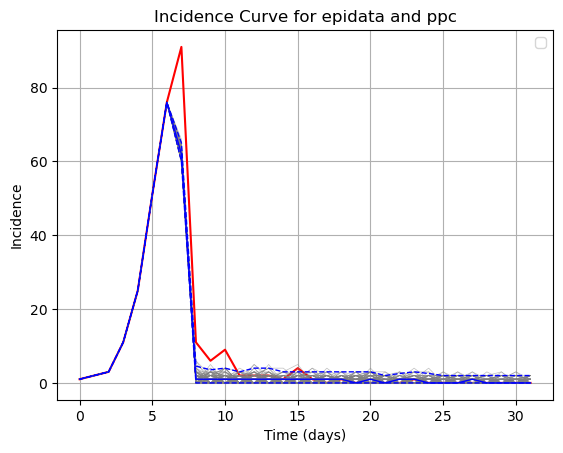

In [24]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 6 clusters

(-1.0, 40.0)

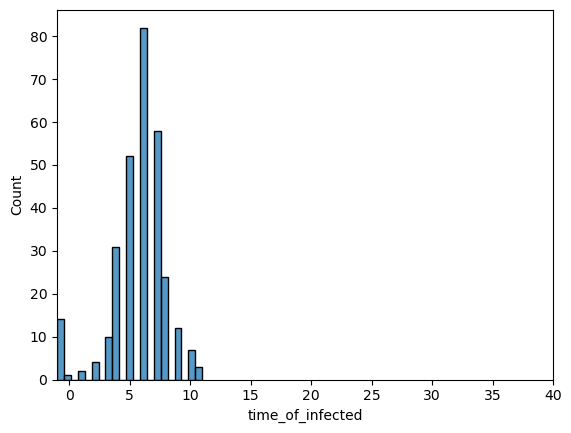

In [695]:
df = pd.read_csv('records.csv')
time = df["time_of_infected"]
sns.histplot(time)
plt.xlim(-1, 40)

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


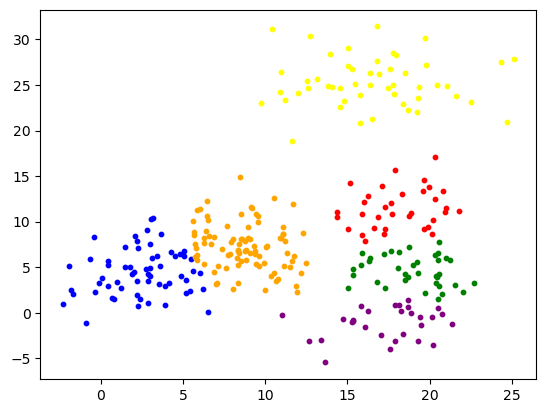

In [697]:
X = df[["position_x", "position_y"]].values
n_clusters = 6
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [698]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [713]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


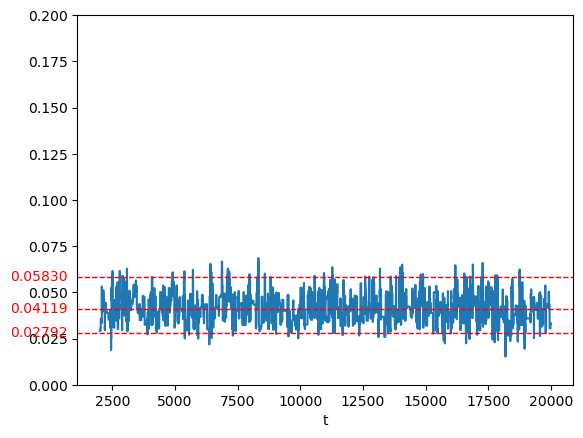

In [714]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


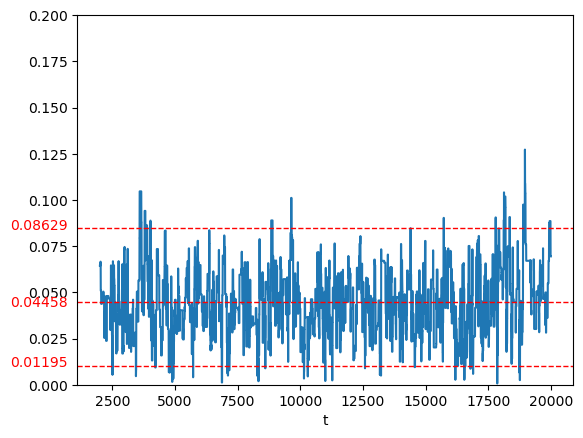

In [715]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


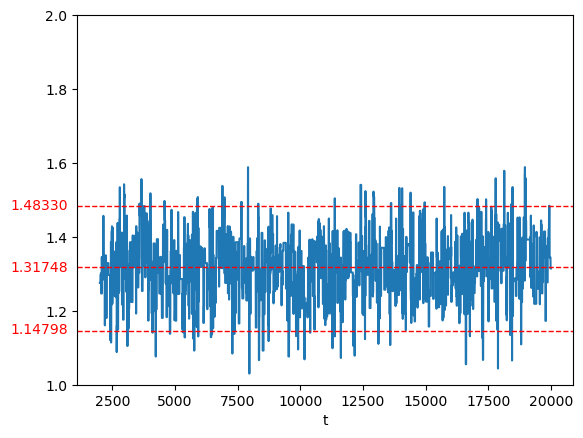

In [716]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


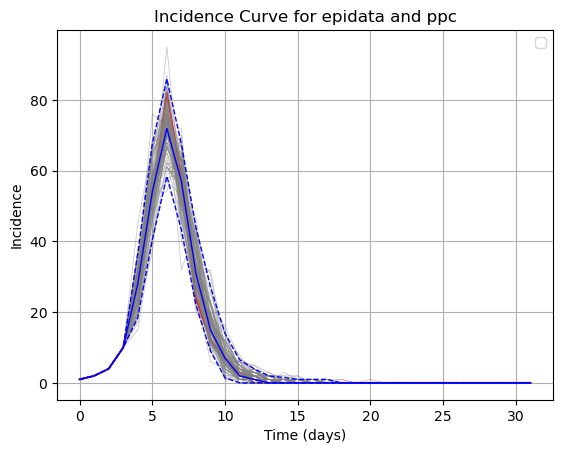

In [717]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


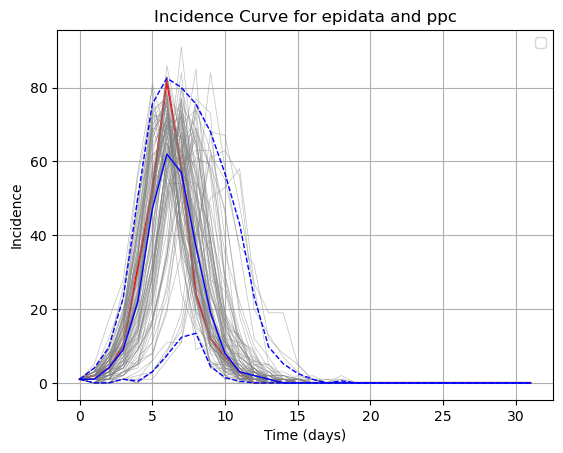

In [718]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model I: with tilde_beta

In [183]:
#full model
#composite-between clusters
samples_composite_bc_tilde = pd.read_csv('samples_composite_bc_tilde.csv')
samples_compositebc_tilde_a0 = pd.DataFrame(samples_composite_bc_tilde["a0"])
samples_compositebc_tilde_a1 = pd.DataFrame(samples_composite_bc_tilde["a1"])
samples_compositebc_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["beta"])
samples_compositebc_tilde_epsilon = pd.DataFrame(samples_composite_bc_tilde["epsilon"])
samples_compositebc_tilde_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["tilde_beta"])


### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


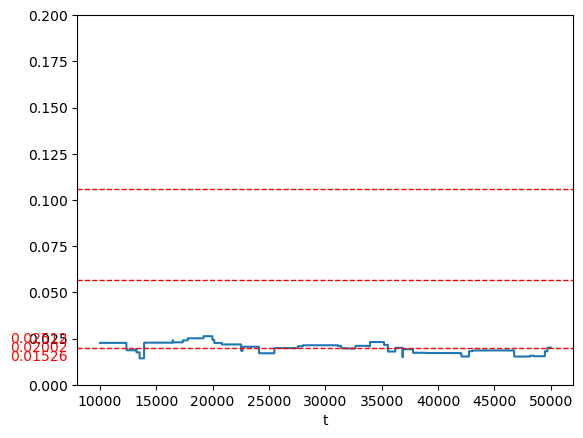

In [184]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a0[9999:50000])[0]
p025 = samples_compositebc_tilde_a0[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


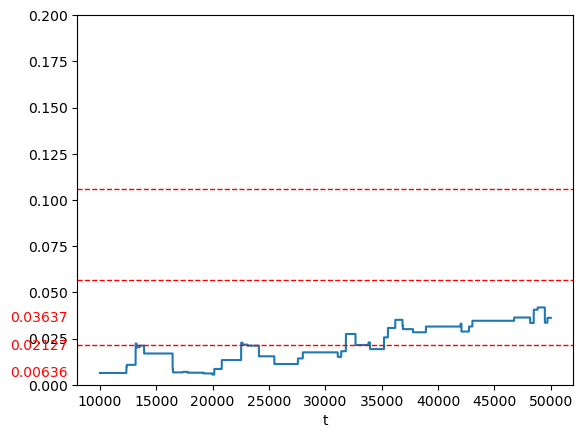

In [185]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a1[9999:50000])[0]
p025 = samples_compositebc_tilde_a1[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


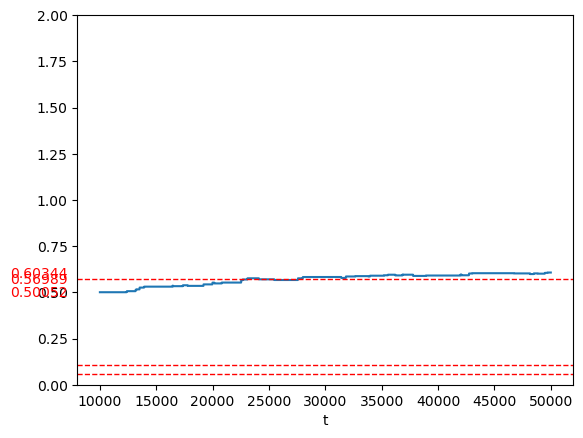

In [186]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_beta[9999:50000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\epsilon$


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


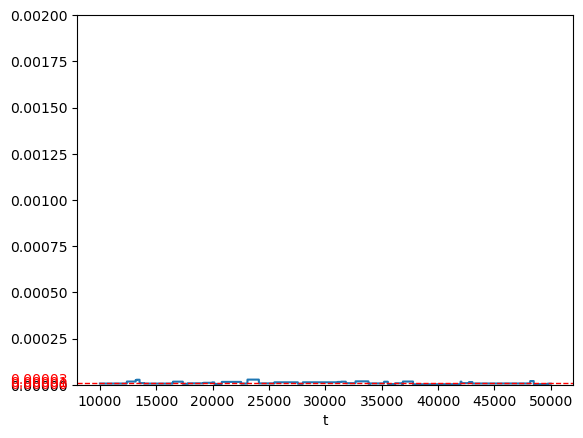

In [187]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_epsilon[9999:50000])[0]
p025 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_epsilon[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


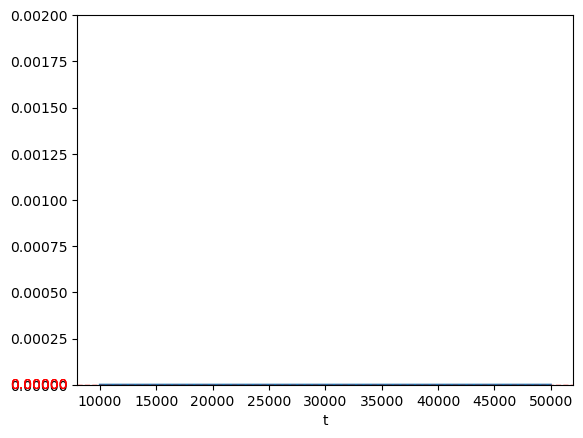

In [188]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_tilde_beta[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Model II: without tilde_beta

In [92]:
#composite-between clusters
samples_composite_bc = pd.read_csv('samples_composite_bc.csv')
samples_compositebc_a0 = pd.DataFrame(samples_composite_bc["a0"])
samples_compositebc_a1 = pd.DataFrame(samples_composite_bc["a1"])
samples_compositebc_beta = pd.DataFrame(samples_composite_bc["beta"])
samples_compositebc_epsilon = pd.DataFrame(samples_composite_bc["epsilon"])

### $\alpha_0$

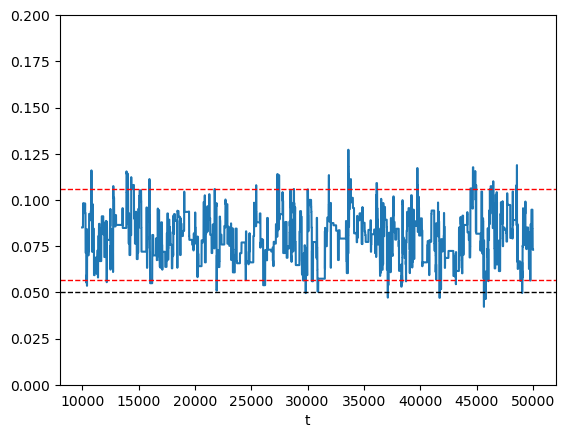

In [269]:
times = range(9999,50000)
plt.plot(times, samples_compositebc_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(0.05,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [97]:
print(np.mean(samples_compositebc_a0[9999:50000]))
print(samples_compositebc_a0.quantile(0.025)[0], samples_compositebc_a0.quantile(0.975)[0])

a0    0.048168
dtype: float64
0.027942 0.0712958


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\alpha_1$

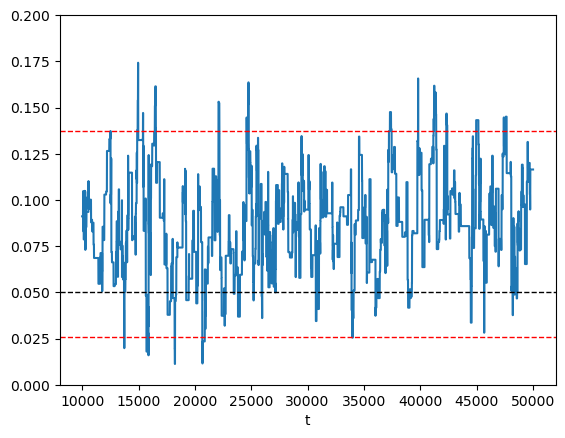

In [94]:
plt.plot(times, samples_compositebc_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(0.05,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [98]:
print(np.mean(samples_compositebc_a1[9999:50000]))
print(samples_compositebc_a1.quantile(0.025)[0], samples_compositebc_a1.quantile(0.975)[0])

a1    0.086911
dtype: float64
0.0258244 0.137225


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\beta$

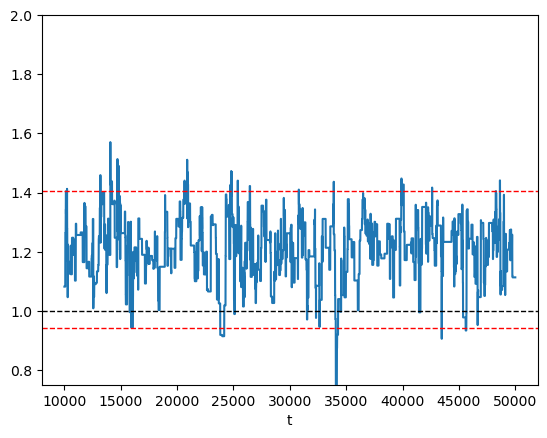

In [99]:
plt.plot(times, samples_compositebc_beta[9999:50000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(1,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [100]:
print(np.mean(samples_compositebc_beta[9999:50000]))
print(samples_compositebc_beta.quantile(0.025)[0], samples_compositebc_beta.quantile(0.975)[0])

beta    1.207218
dtype: float64
0.942916 1.40393


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\epsilon$

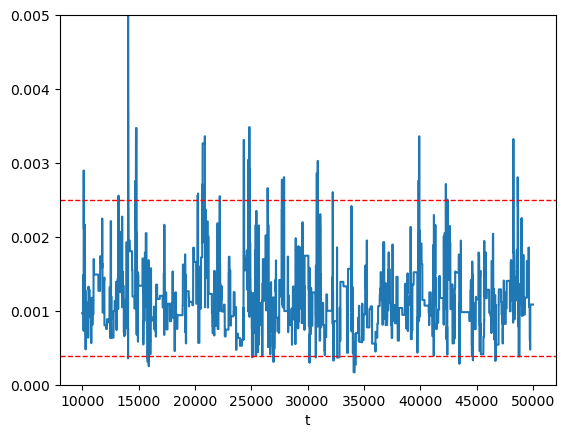

In [101]:
plt.plot(times, samples_compositebc_epsilon[9999:50000])
plt.ylim(0, 0.005)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_epsilon.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_epsilon.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
plt.show()

In [102]:
print(np.mean(samples_compositebc_epsilon[9999:50000]))
print(samples_compositebc_epsilon.quantile(0.025)[0], samples_compositebc_epsilon.quantile(0.975)[0])

epsilon    0.001162
dtype: float64
0.000382329 0.0025023


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


## Model III: without epsilon

In [706]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


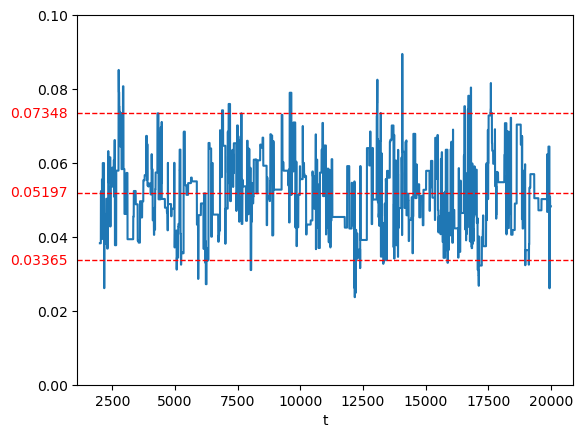

In [707]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


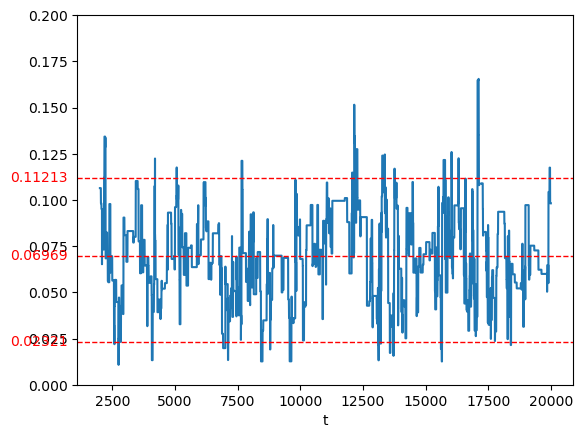

In [708]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


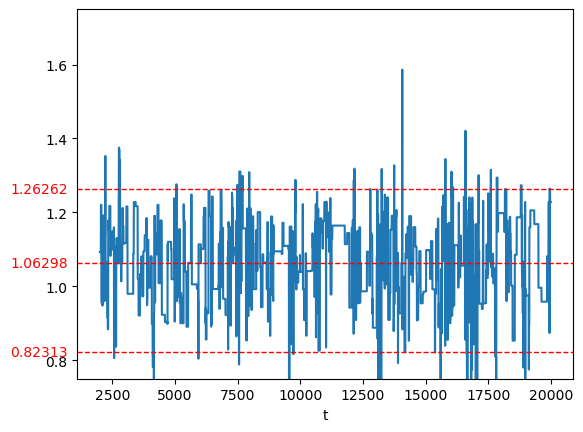

In [709]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


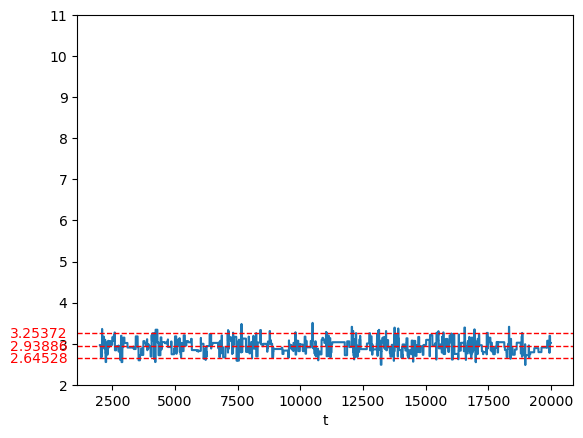

In [710]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 11)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


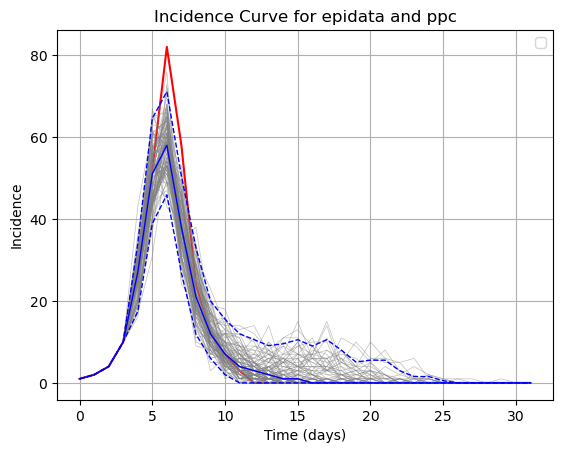

In [711]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


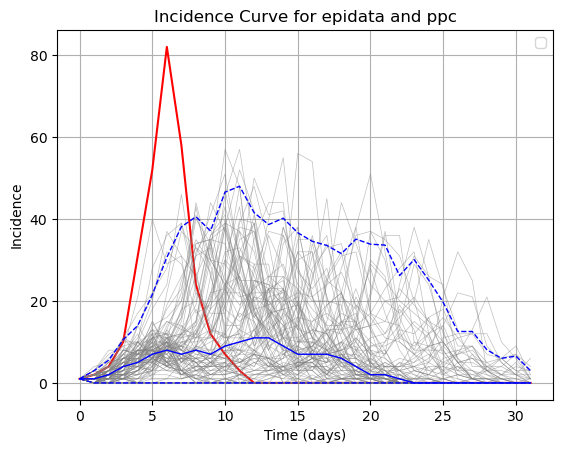

In [712]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [699]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


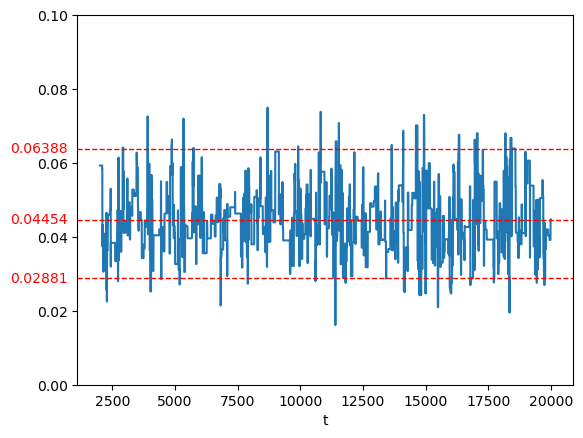

In [700]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


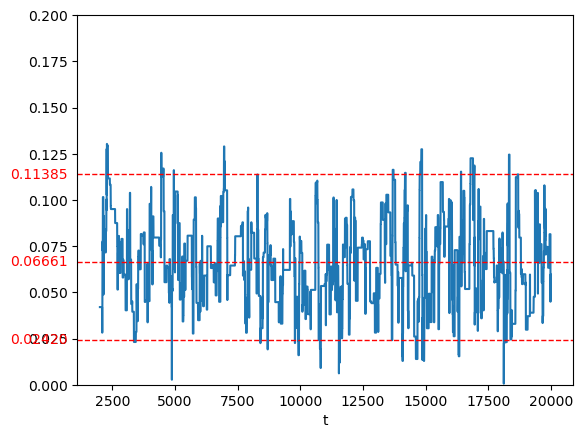

In [701]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


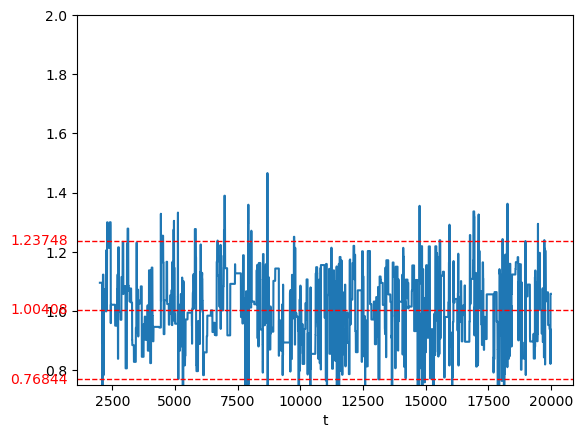

In [702]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


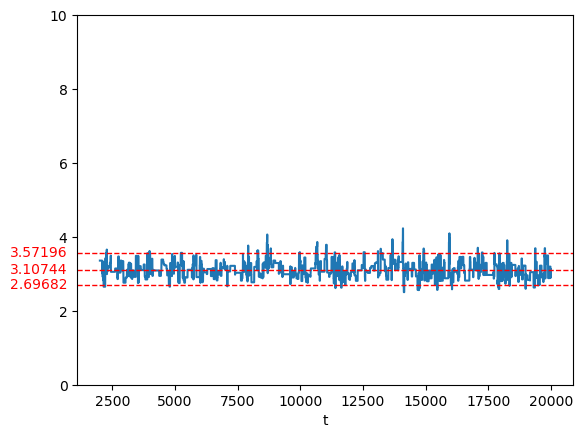

In [703]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 10)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


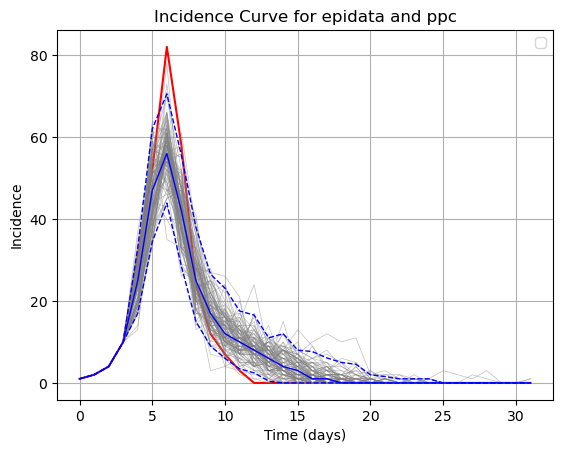

In [704]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


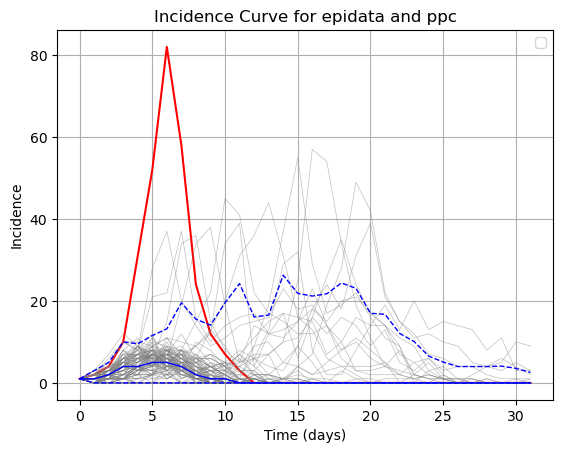

In [705]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model V: likelihood inflated

In [178]:
samples_composite_bc_tilde_woeps_infcentroids_inflated = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids_inflated.csv')
samples_composite_bc_tilde_woeps_infcentroids_inflated_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a0"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a1"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["beta"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["tilde_beta"])

### $\alpha_{0}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


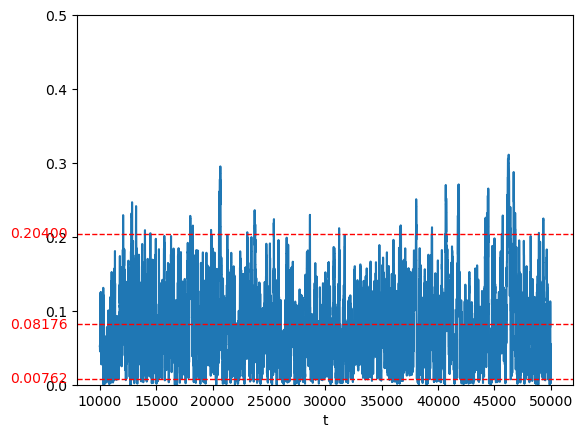

In [179]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])
plt.ylim(0, 0.5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


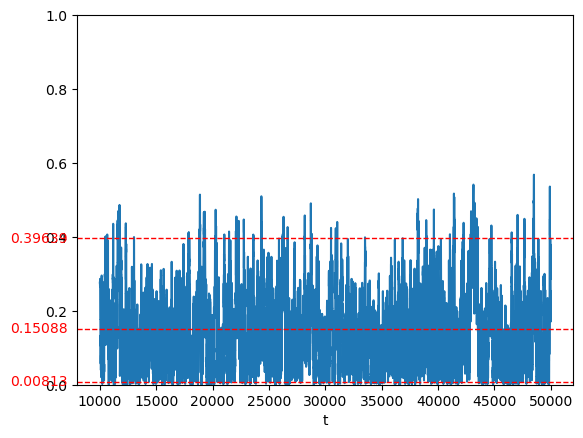

In [180]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])
plt.ylim(0, 1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


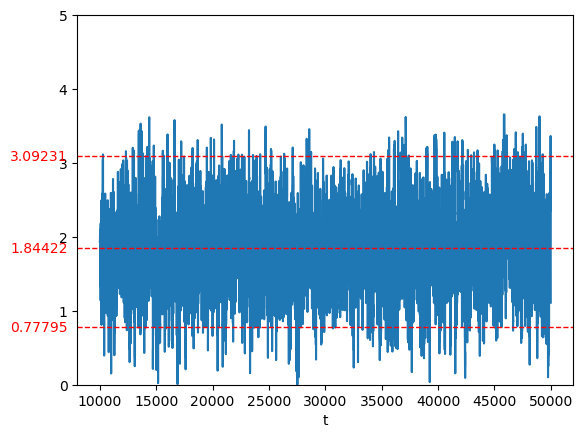

In [181]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])
plt.ylim(0, 5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


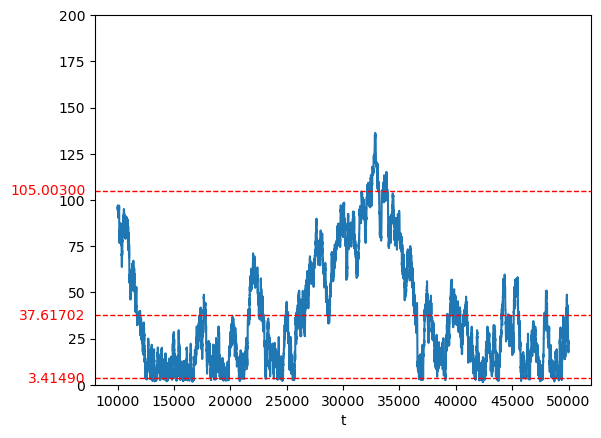

In [182]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])
plt.ylim(0, 200)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Posterior predictive distributions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


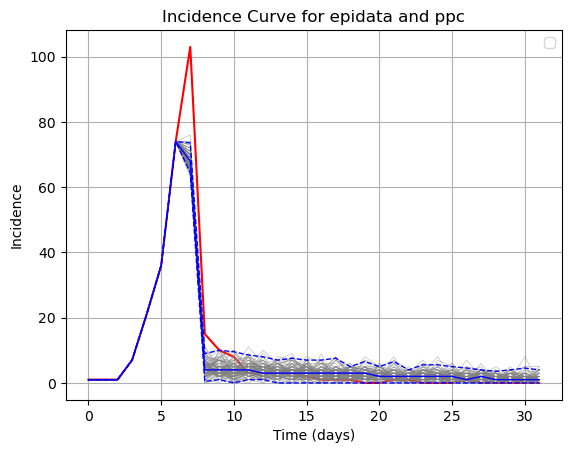

In [22]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 7 clusters

(-1.0, 40.0)

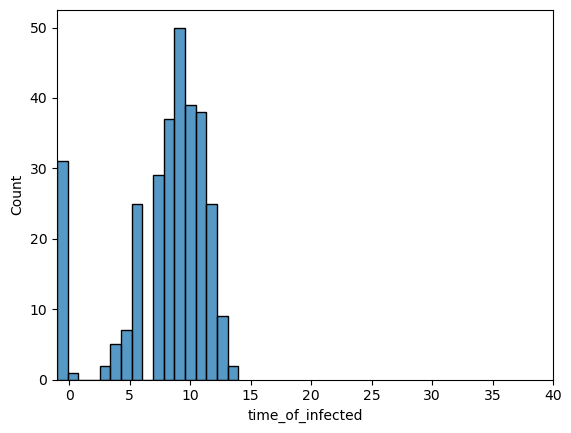

In [719]:
df = pd.read_csv('records.csv')
time = df["time_of_infected"]
sns.histplot(time)
plt.xlim(-1, 40)

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


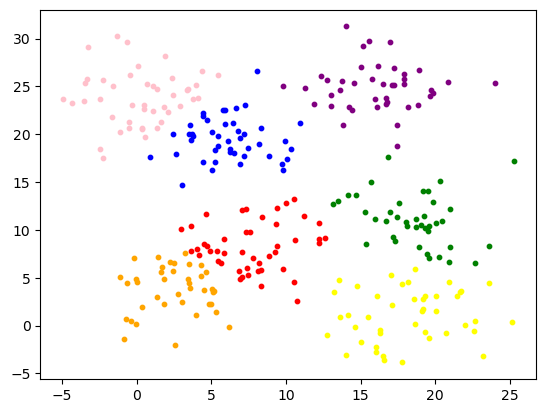

In [720]:
X = df[["position_x", "position_y"]].values
n_clusters = 7
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [721]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [722]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


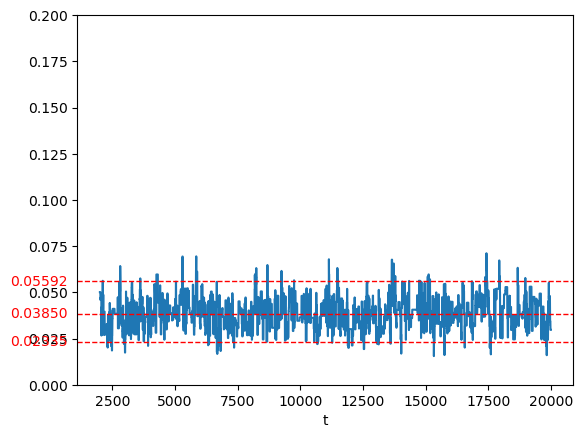

In [723]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


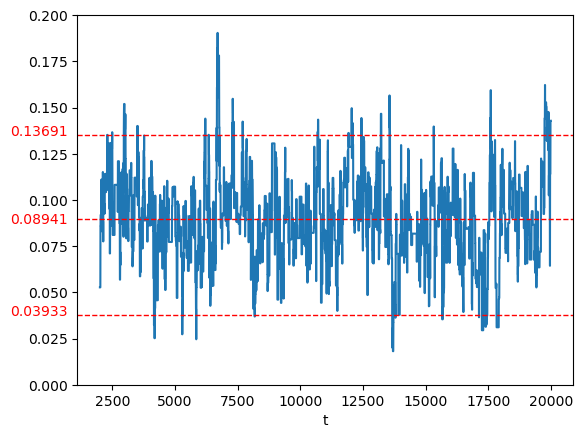

In [724]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


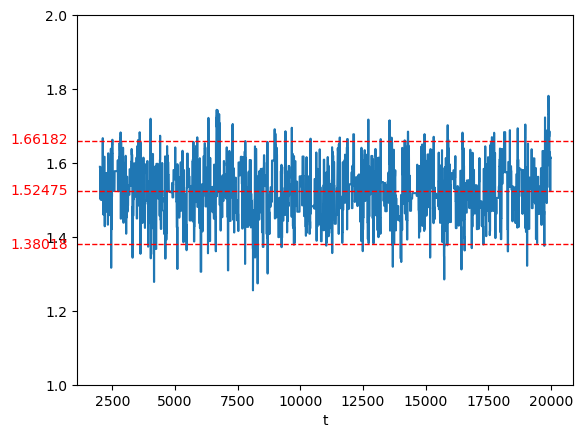

In [727]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


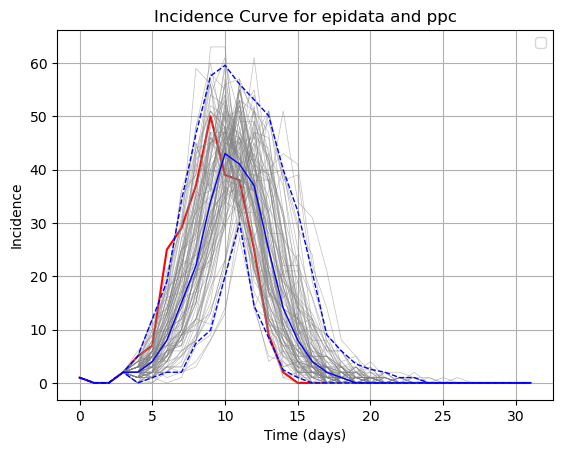

In [726]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


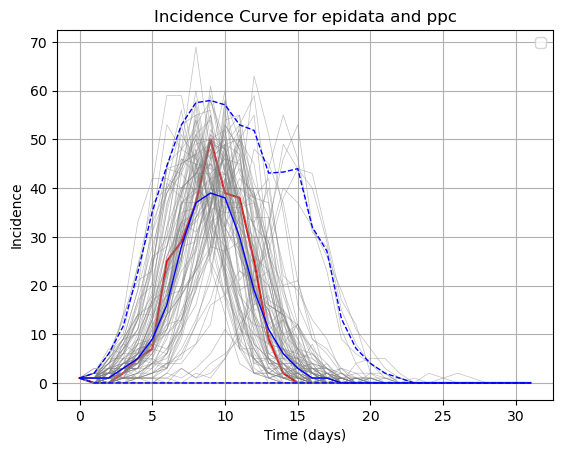

In [728]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model I: with tilde_beta

In [144]:
#full model
#composite-between clusters
samples_composite_bc_tilde = pd.read_csv('samples_composite_bc_tilde.csv')
samples_compositebc_tilde_a0 = pd.DataFrame(samples_composite_bc_tilde["a0"])
samples_compositebc_tilde_a1 = pd.DataFrame(samples_composite_bc_tilde["a1"])
samples_compositebc_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["beta"])
samples_compositebc_tilde_epsilon = pd.DataFrame(samples_composite_bc_tilde["epsilon"])
samples_compositebc_tilde_tilde_beta = pd.DataFrame(samples_composite_bc_tilde["tilde_beta"])


### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


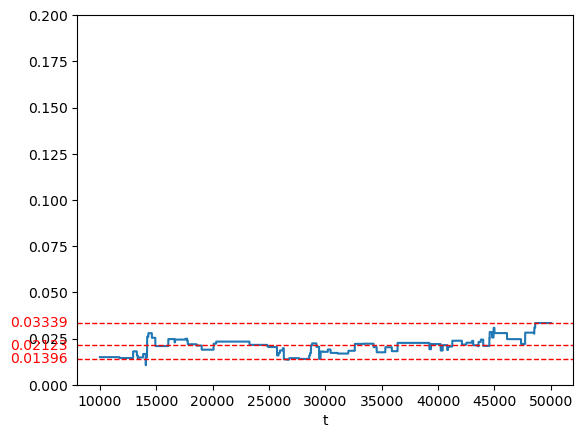

In [146]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a0[9999:50000])[0]
p025 = samples_compositebc_tilde_a0[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_compositebc_tilde_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_tilde_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


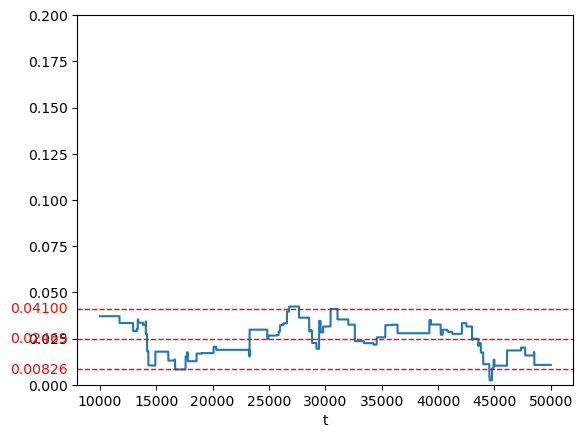

In [147]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_a1[9999:50000])[0]
p025 = samples_compositebc_tilde_a1[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


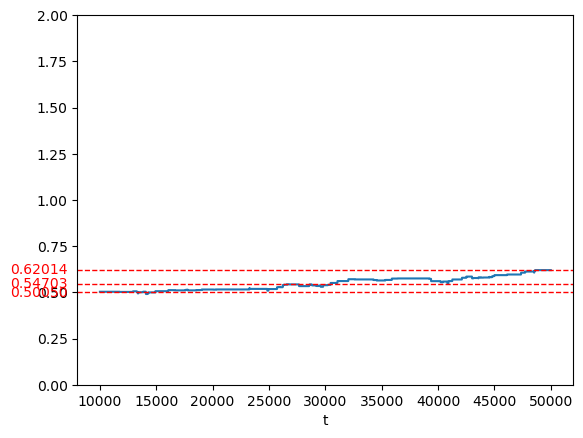

In [148]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_beta[9999:50000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\epsilon$


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


IndexError: invalid index to scalar variable.

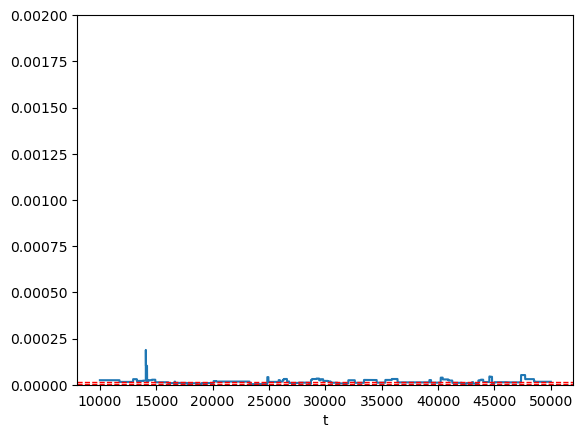

In [149]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_epsilon[9999:50000])[0]
p025 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_epsilon[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_epsilon[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


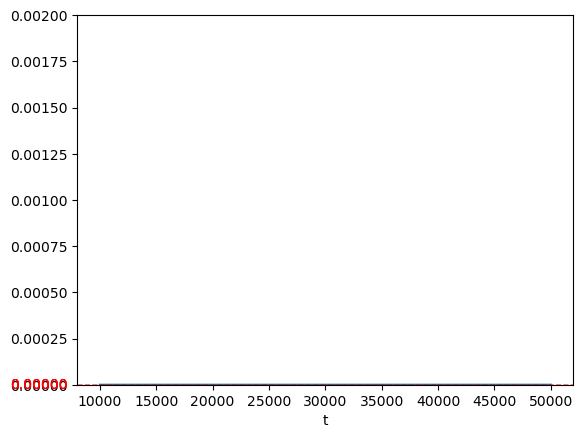

In [150]:
times = range(9999,50000)
mean = np.mean(samples_compositebc_tilde_tilde_beta[9999:50000])[0]
p025 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_compositebc_tilde_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_compositebc_tilde_tilde_beta[9999:50000])
plt.ylim(0, 0.002)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Model II: without tilde_beta

In [115]:
#composite-between clusters
samples_composite_bc = pd.read_csv('samples_composite_bc.csv')
samples_compositebc_a0 = pd.DataFrame(samples_composite_bc["a0"])
samples_compositebc_a1 = pd.DataFrame(samples_composite_bc["a1"])
samples_compositebc_beta = pd.DataFrame(samples_composite_bc["beta"])
samples_compositebc_epsilon = pd.DataFrame(samples_composite_bc["epsilon"])

### $\alpha_0$

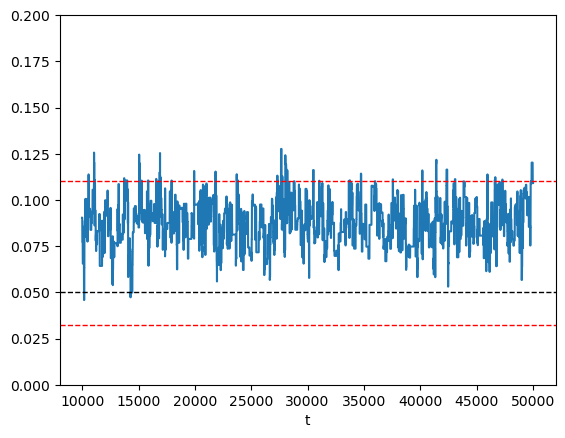

In [116]:
times = range(9999,50000)
plt.plot(times, samples_compositebc_a0[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(0.05,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [117]:
print(np.mean(samples_compositebc_a0[9999:50000]))
print(samples_compositebc_a0.quantile(0.025)[0], samples_compositebc_a0.quantile(0.975)[0])

a0    0.087416
dtype: float64
0.0320493 0.110155


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\alpha_1$

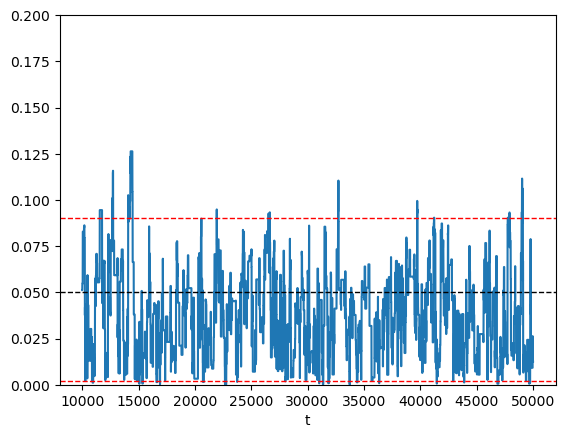

In [118]:
plt.plot(times, samples_compositebc_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(0.05,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [119]:
print(np.mean(samples_compositebc_a1[9999:50000]))
print(samples_compositebc_a1.quantile(0.025)[0], samples_compositebc_a1.quantile(0.975)[0])

a1    0.037199
dtype: float64
0.00227817 0.0902111


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\beta$

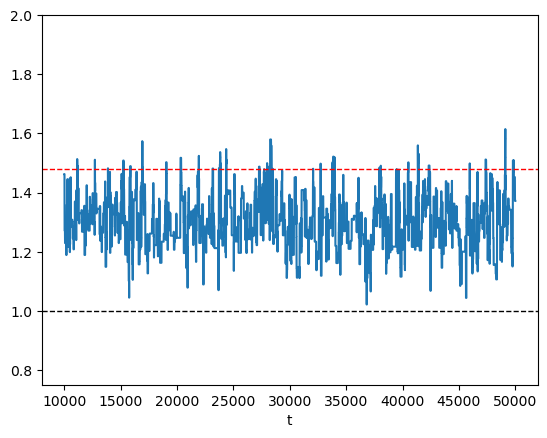

In [120]:
plt.plot(times, samples_compositebc_beta[9999:50000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)
plt.axhline(1,color = "black", linestyle = "--", linewidth = 1)
plt.show()

In [121]:
print(np.mean(samples_compositebc_beta[9999:50000]))
print(samples_compositebc_beta.quantile(0.025)[0], samples_compositebc_beta.quantile(0.975)[0])

beta    1.296597
dtype: float64
0.295721 1.48002


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


### $\epsilon$

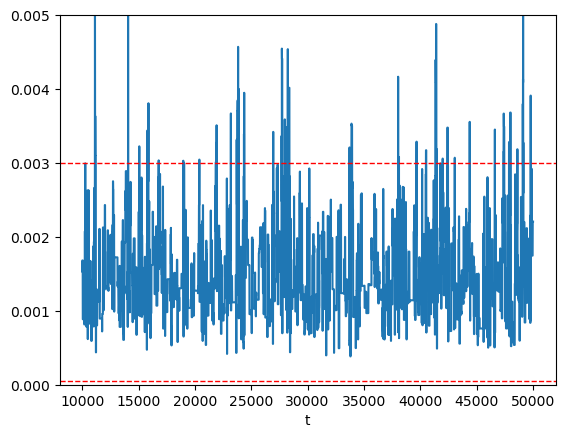

In [122]:
plt.plot(times, samples_compositebc_epsilon[9999:50000])
plt.ylim(0, 0.005)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(samples_compositebc_epsilon.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_compositebc_epsilon.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
plt.show()

In [123]:
print(np.mean(samples_compositebc_epsilon[9999:50000]))
print(samples_compositebc_epsilon.quantile(0.025)[0], samples_compositebc_epsilon.quantile(0.975)[0])

epsilon    0.001476
dtype: float64
4.67959e-05 0.00299482


/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


## Model III: without epsilon

In [731]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


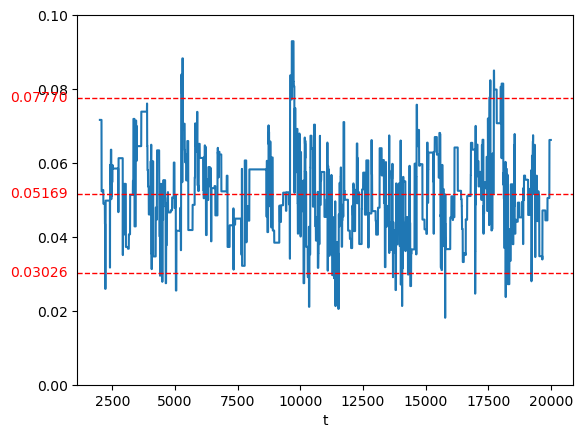

In [732]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


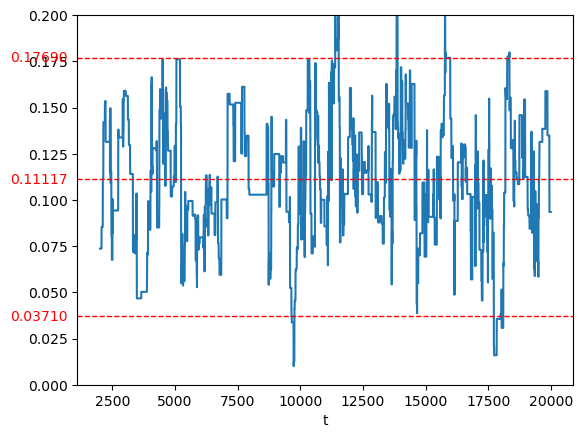

In [733]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


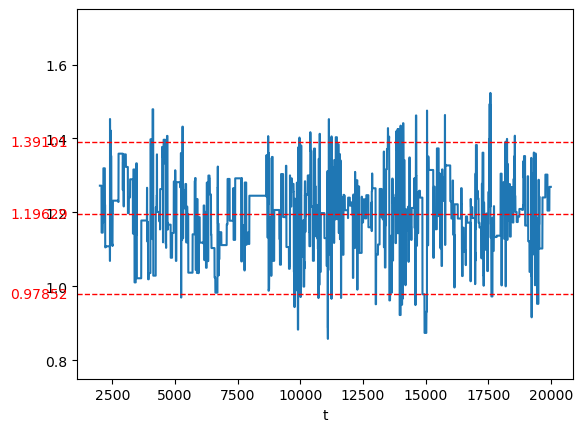

In [734]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


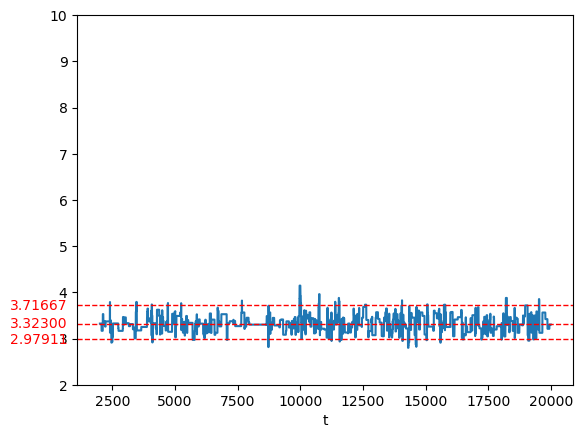

In [735]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 10)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


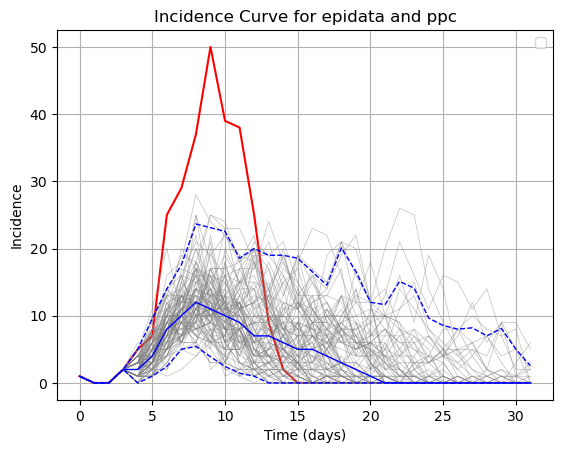

In [738]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


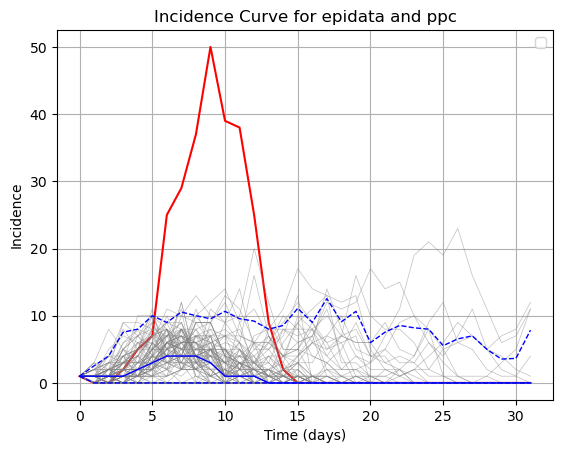

In [736]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [739]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


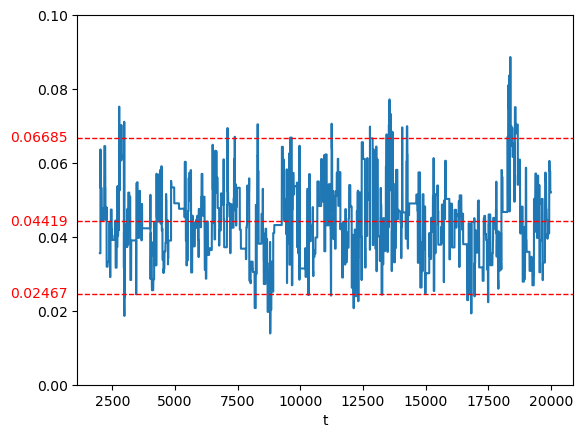

In [740]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


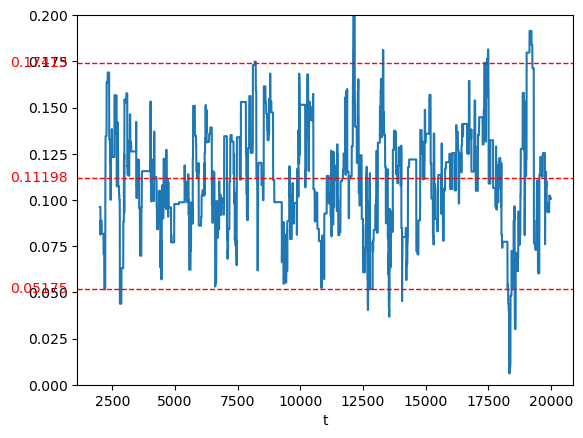

In [741]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


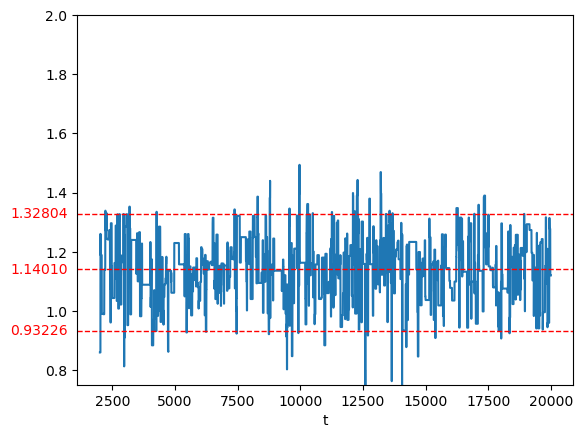

In [742]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


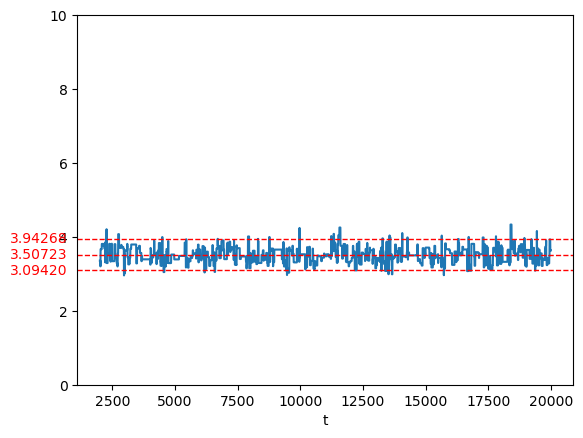

In [743]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 10)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


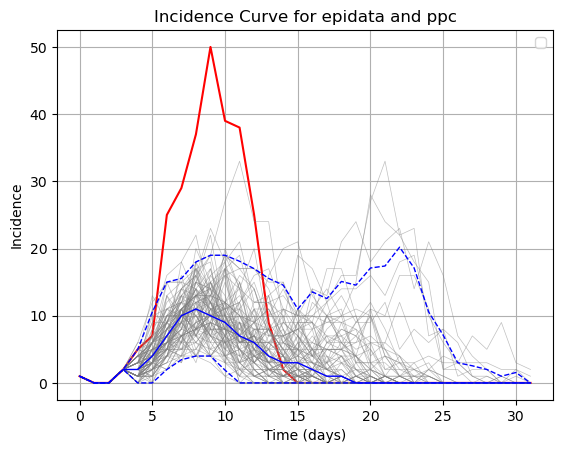

In [744]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df['time_of_infected']), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution-start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


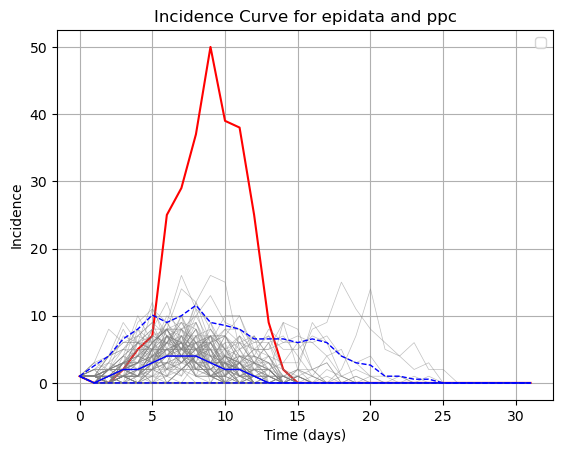

In [745]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model V: likelihood inflated

In [197]:
samples_composite_bc_tilde_woeps_infcentroids_inflated = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids_inflated.csv')
samples_composite_bc_tilde_woeps_infcentroids_inflated_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a0"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["a1"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["beta"])
samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_inflated["tilde_beta"])

### $\alpha_{0}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


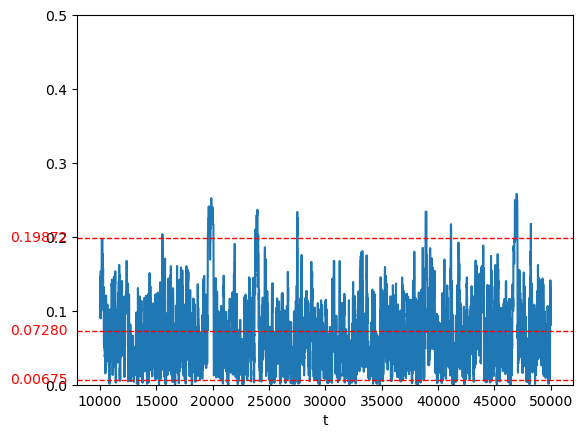

In [198]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a0[9999:50000])
plt.ylim(0, 0.5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


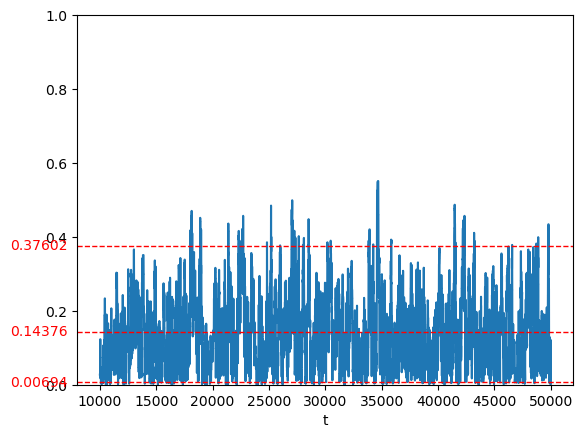

In [199]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_a1[9999:50000])
plt.ylim(0, 1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


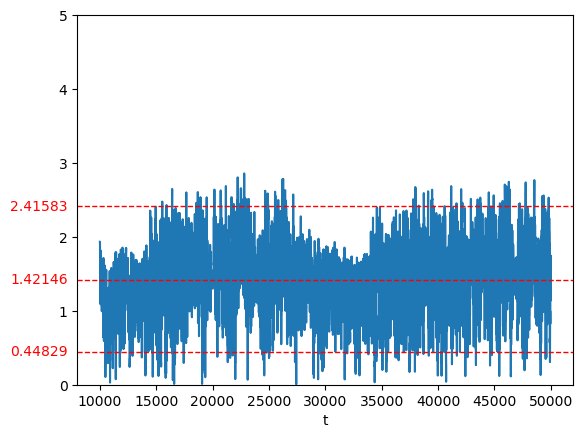

In [200]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_beta[9999:50000])
plt.ylim(0, 5)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


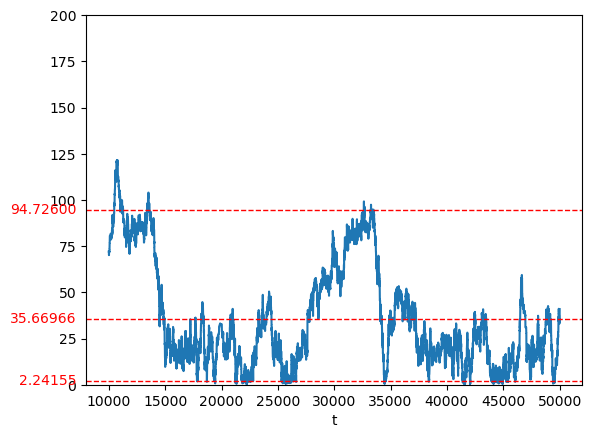

In [201]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_inflated_tilde_beta[9999:50000])
plt.ylim(0, 200)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

## Posterior predictive distributions

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


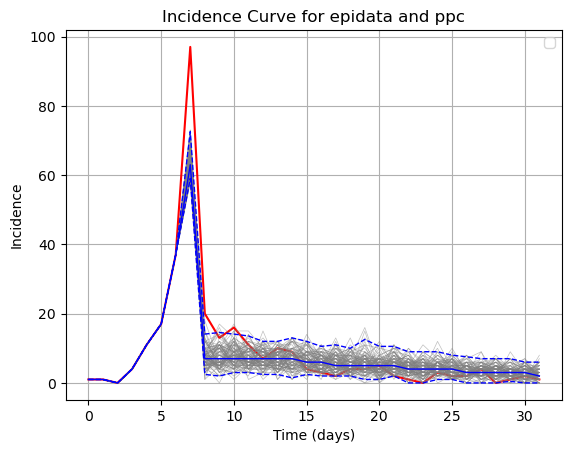

In [20]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 8 Clusters

In [748]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


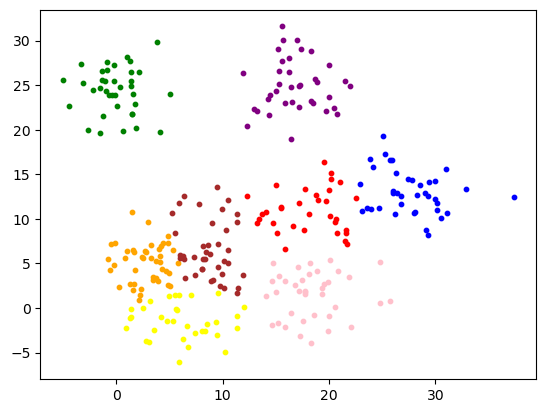

In [751]:
X = df[["position_x", "position_y"]].values
n_clusters = 8
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [752]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [768]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


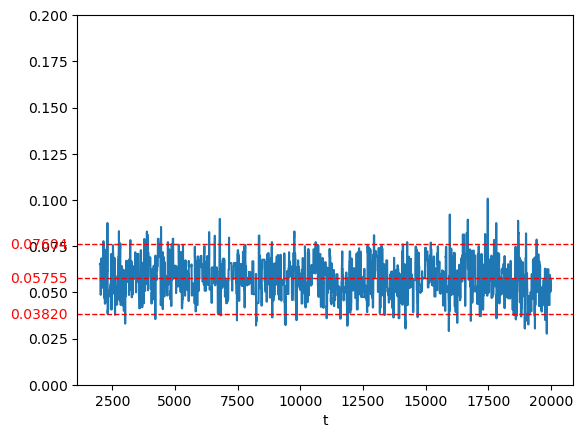

In [769]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


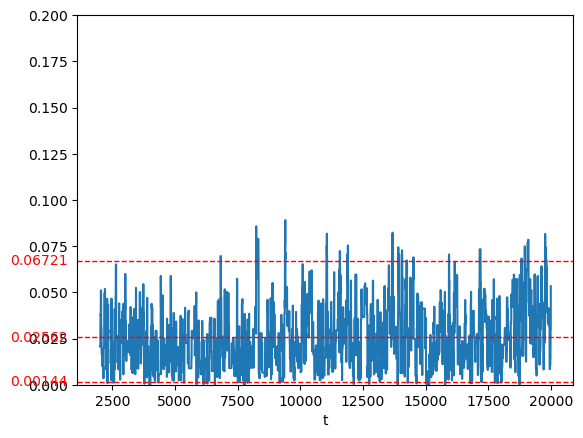

In [770]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


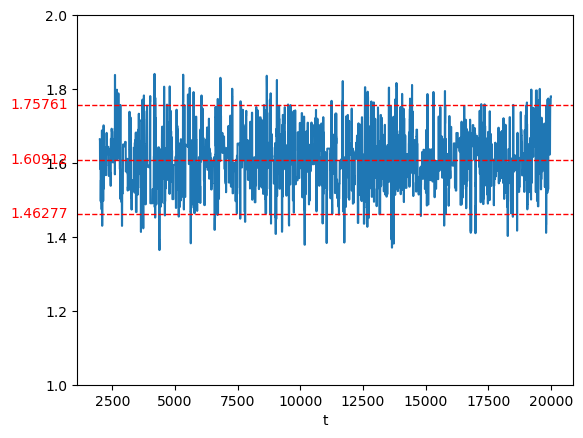

In [176]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


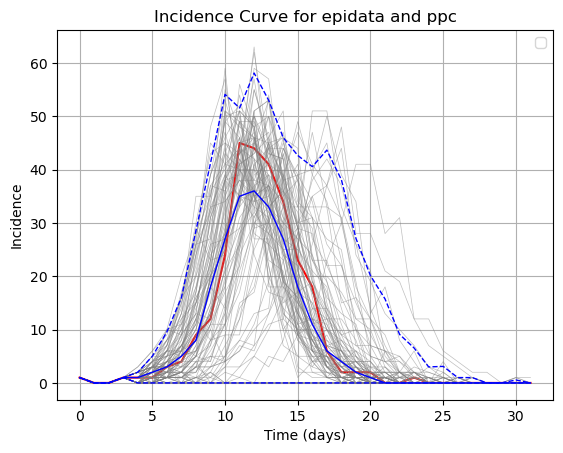

In [773]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


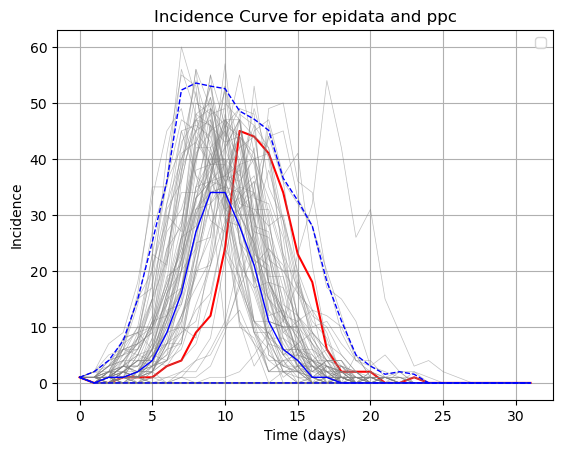

In [772]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model III: without epsilon

In [761]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


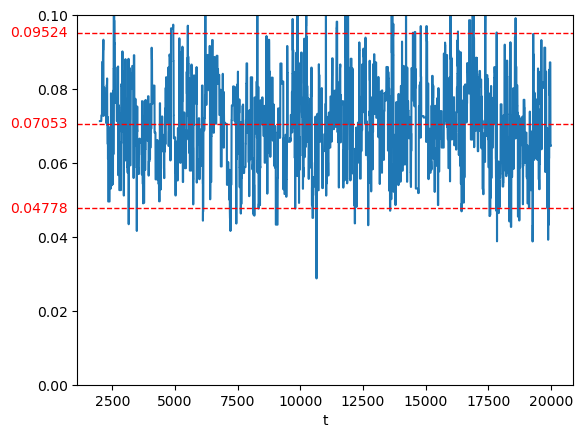

In [762]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


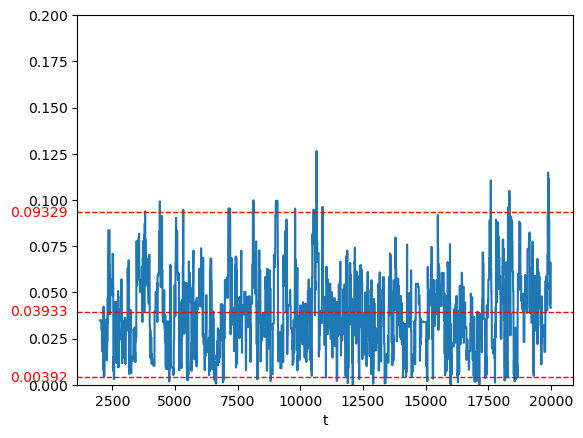

In [763]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


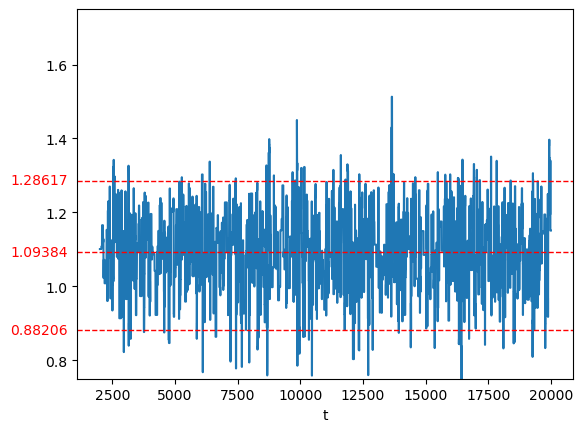

In [764]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


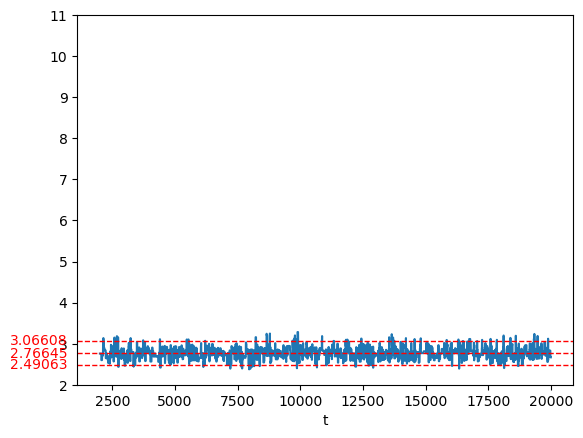

In [765]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 11)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


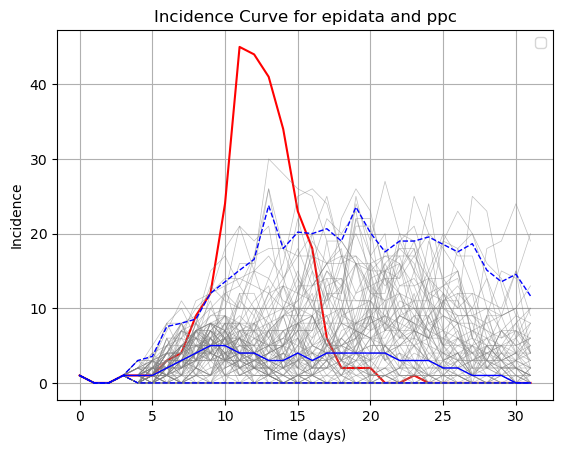

In [766]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


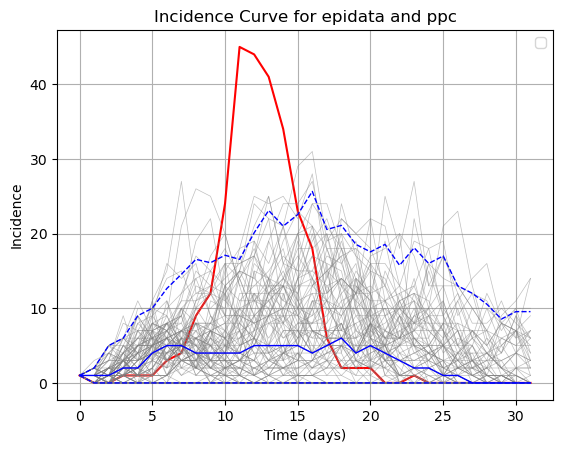

In [767]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [753]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


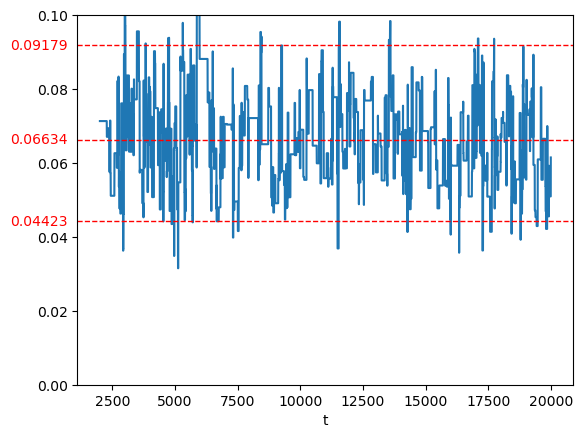

In [754]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


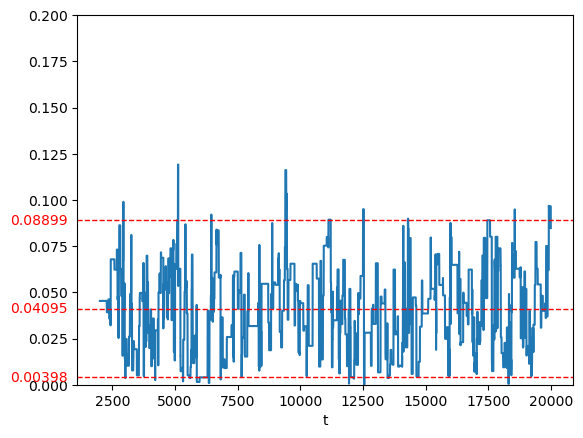

In [755]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


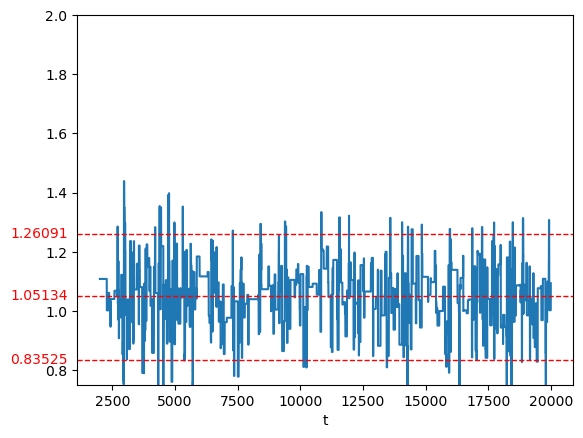

In [756]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


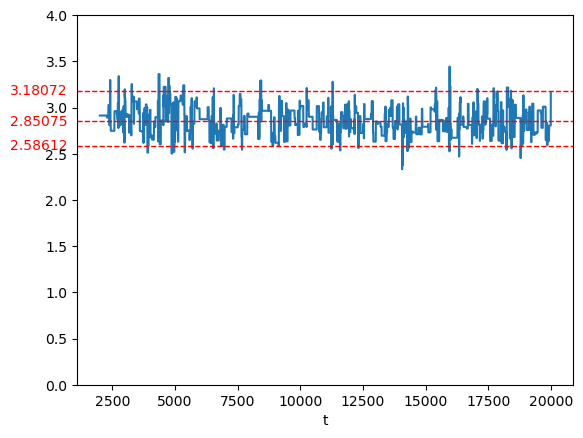

In [757]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


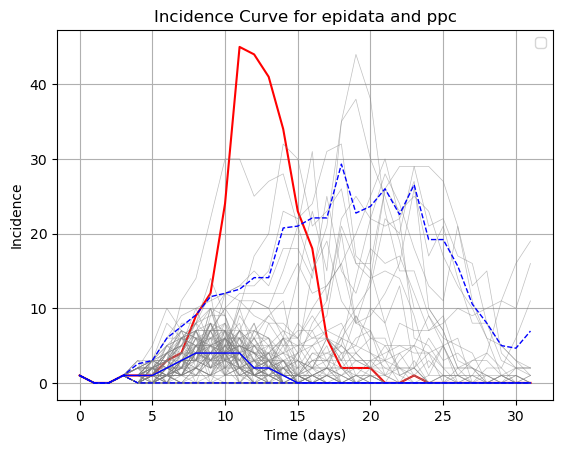

In [759]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


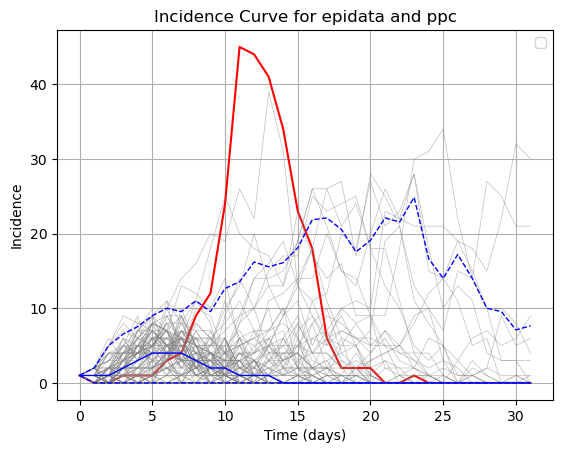

In [760]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 10 Clusters

In [786]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


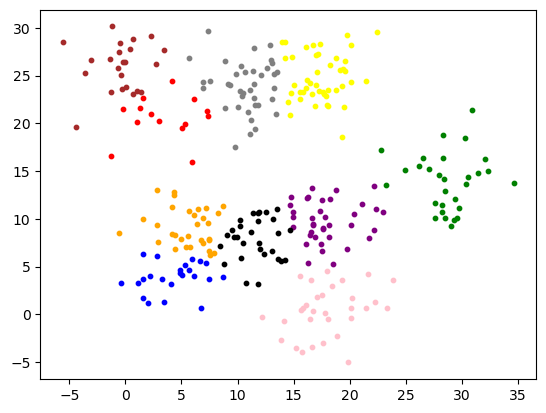

In [787]:
X = df[["position_x", "position_y"]].values
n_clusters = 10
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [788]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [789]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


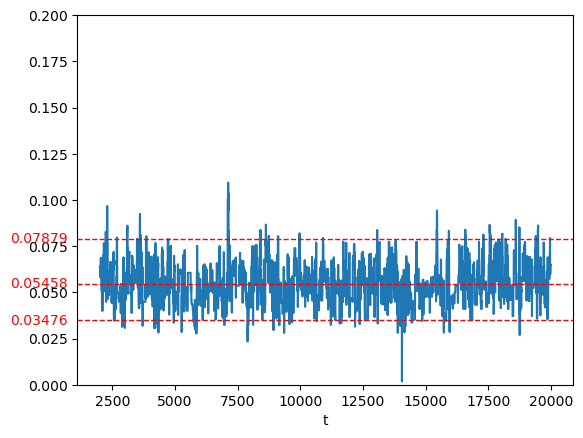

In [790]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


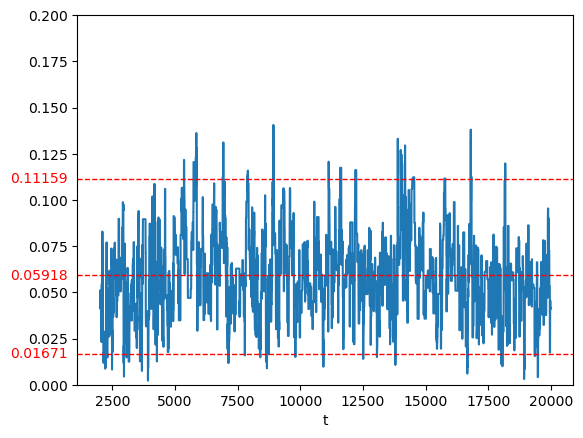

In [791]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


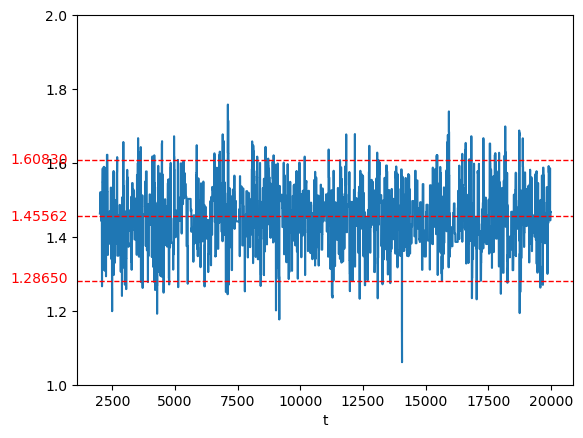

In [792]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


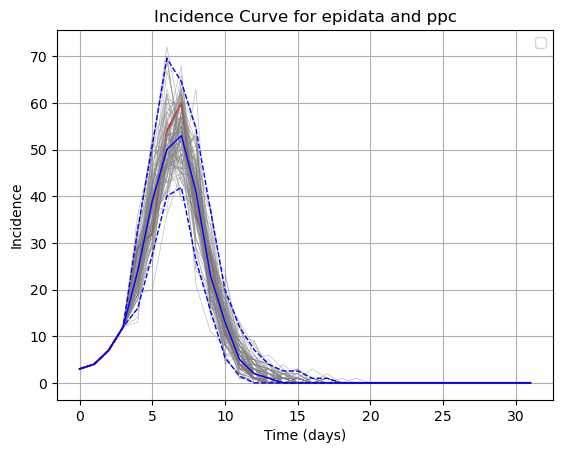

In [793]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


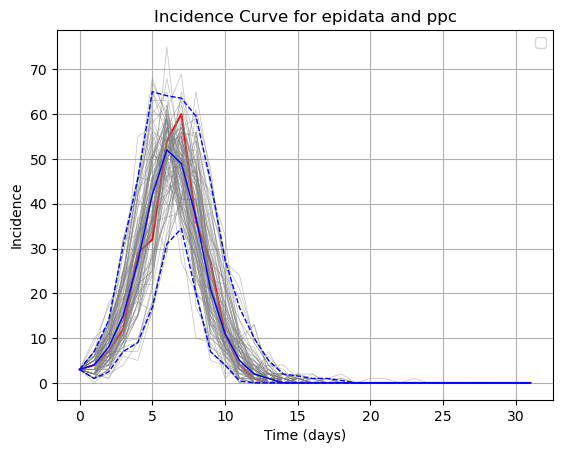

In [794]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model III: without epsilon

In [795]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


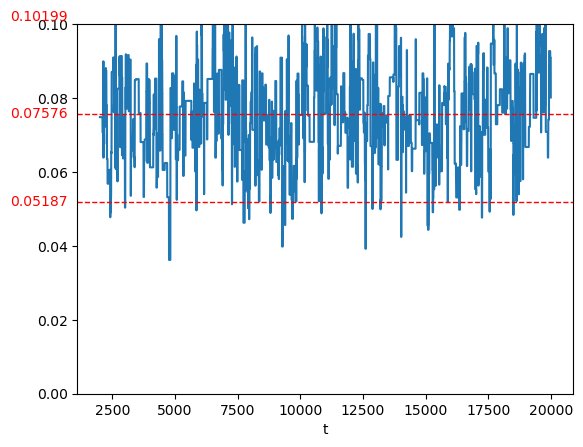

In [796]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


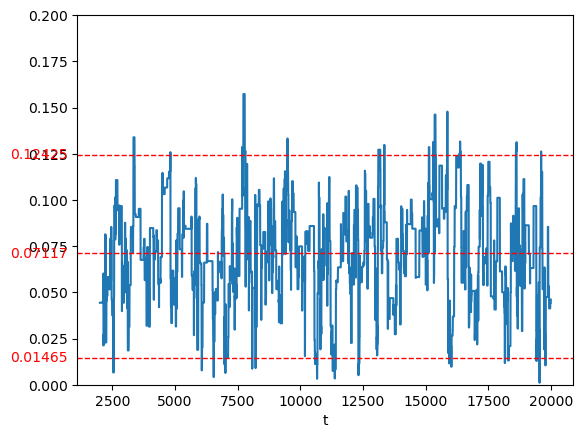

In [797]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


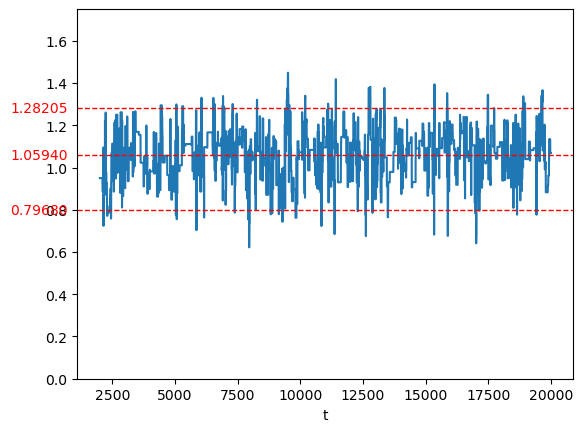

In [798]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


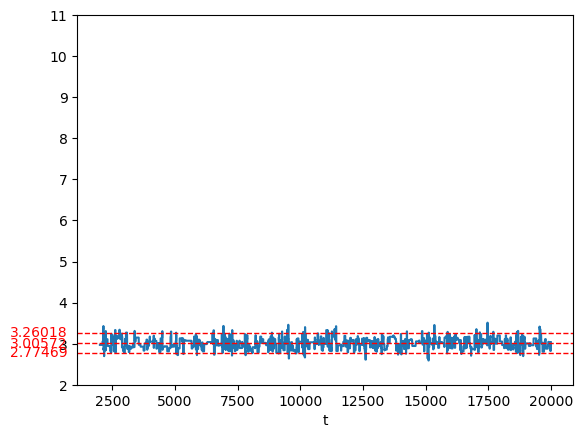

In [799]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 11)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


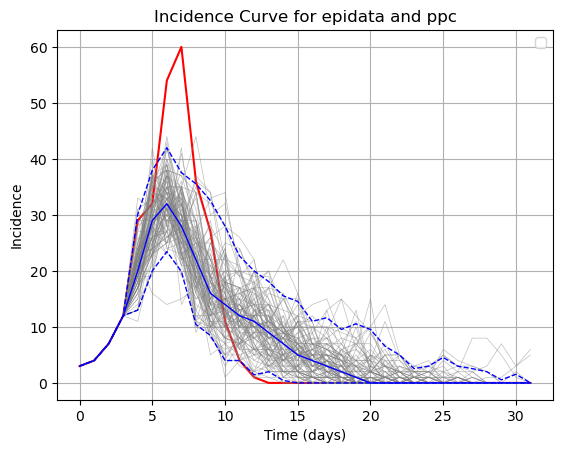

In [800]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


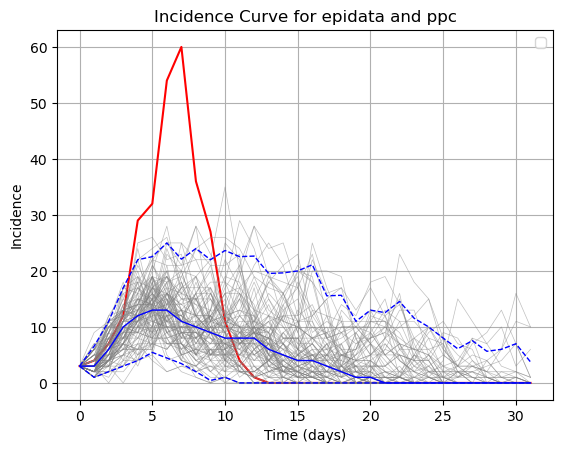

In [801]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [802]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


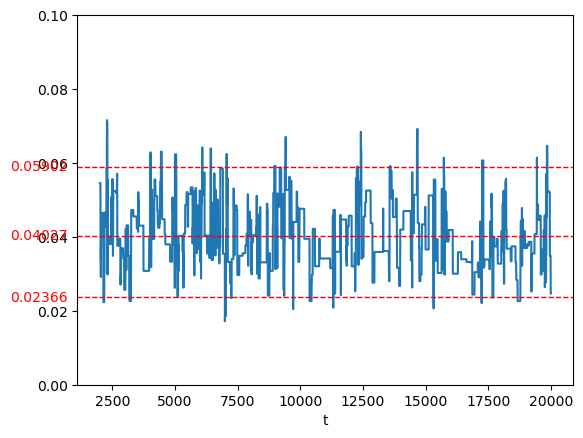

In [803]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


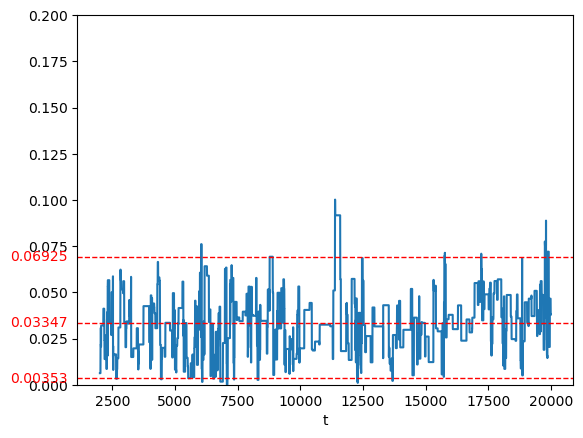

In [804]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


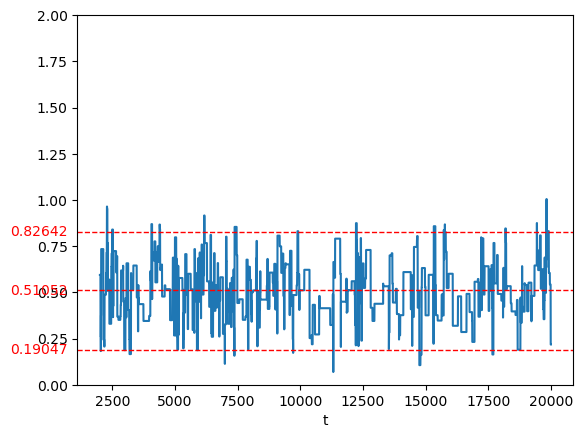

In [805]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


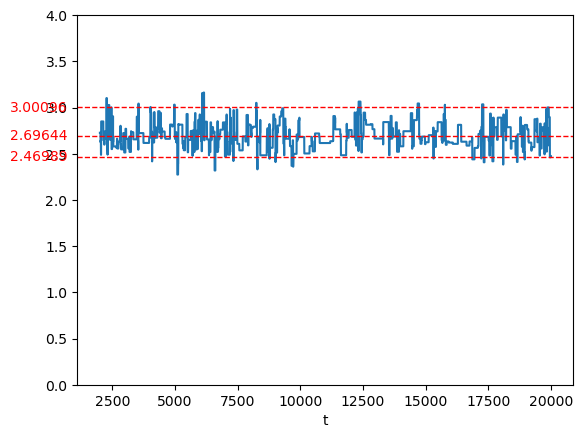

In [806]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


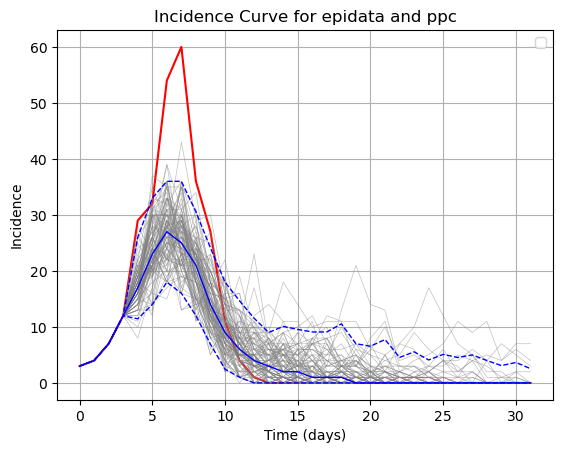

In [807]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


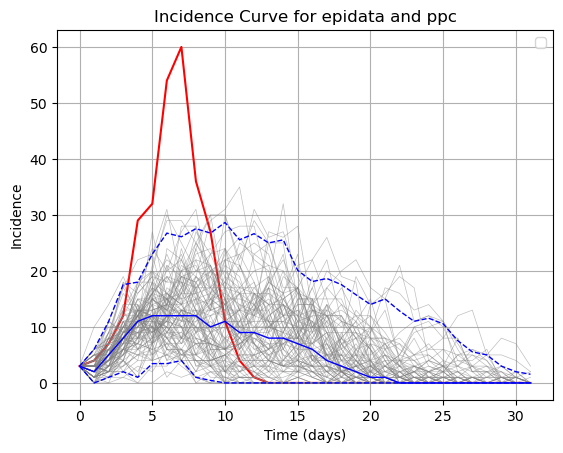

In [808]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 15 Clusters

In [812]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


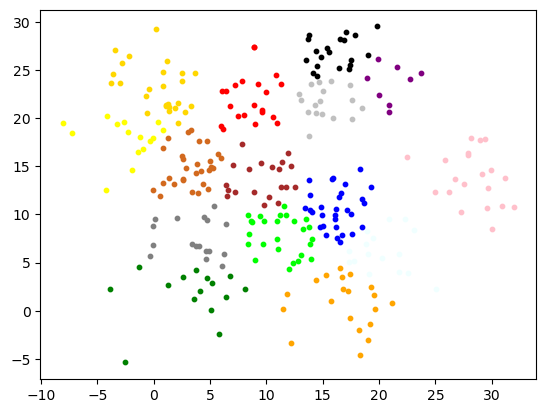

In [813]:
X = df[["position_x", "position_y"]].values
n_clusters = 15
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray','gold','silver','chocolate','azure','lime']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [814]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [121]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


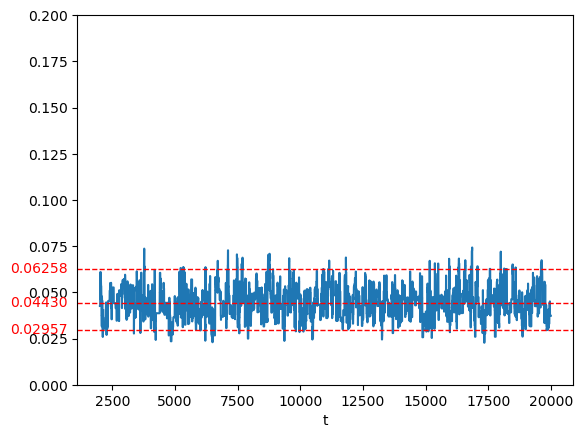

In [122]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


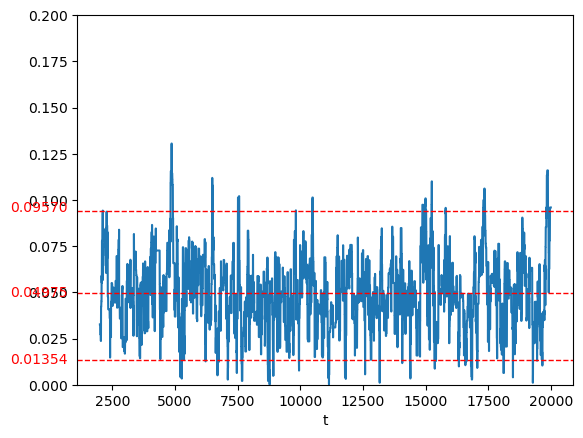

In [123]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


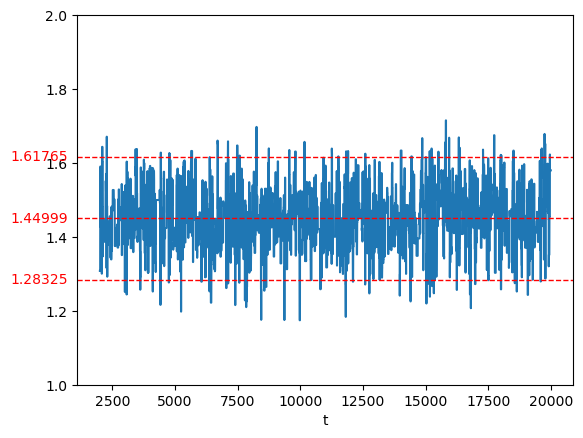

In [124]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


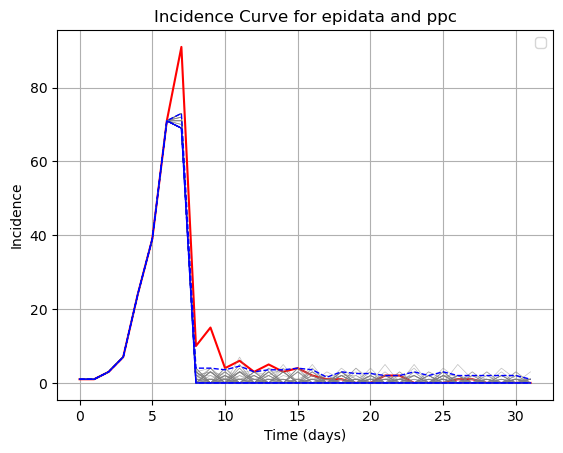

In [71]:
#start from day 7
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


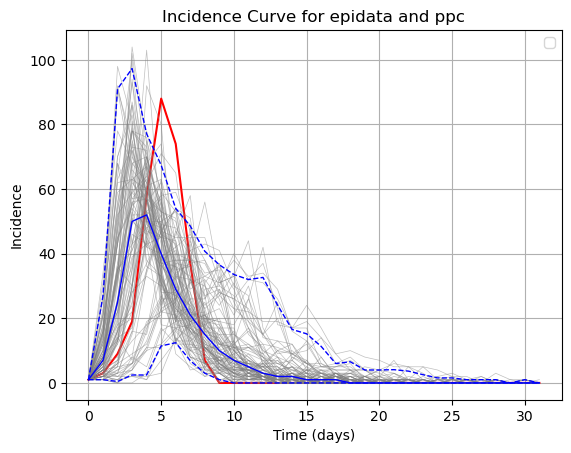

In [128]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model III: without epsilon

In [275]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


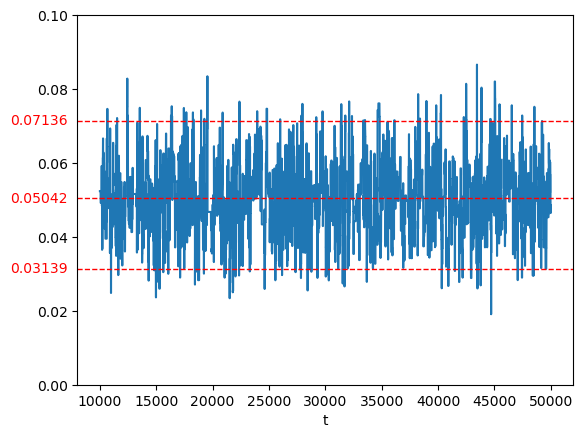

In [276]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[9999:50000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


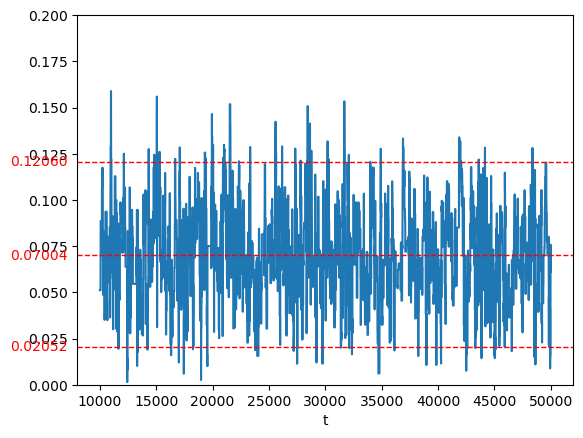

In [277]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[9999:50000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


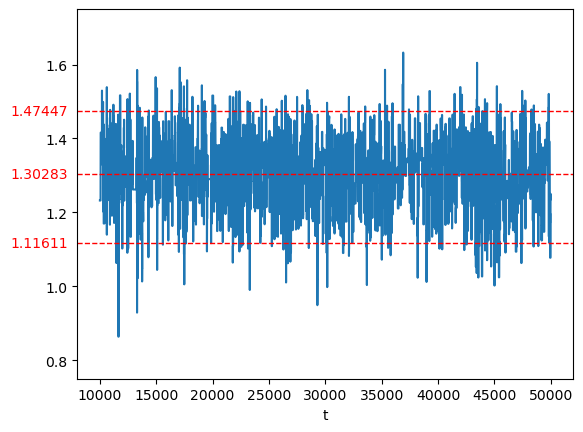

In [278]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[9999:50000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


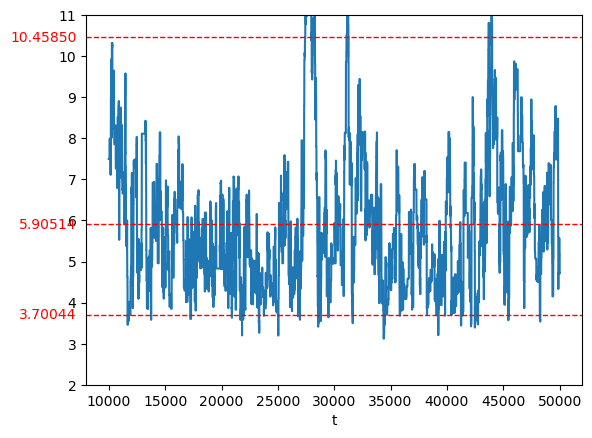

In [280]:
times = range(9999,50000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[9999:50000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[9999:50000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[9999:50000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[9999:50000])
plt.ylim(2, 11)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


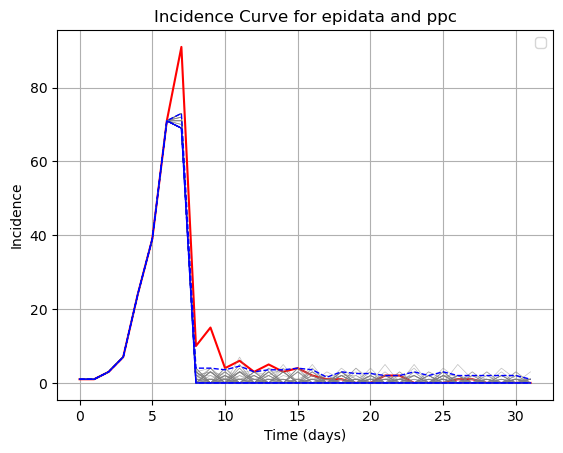

In [71]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


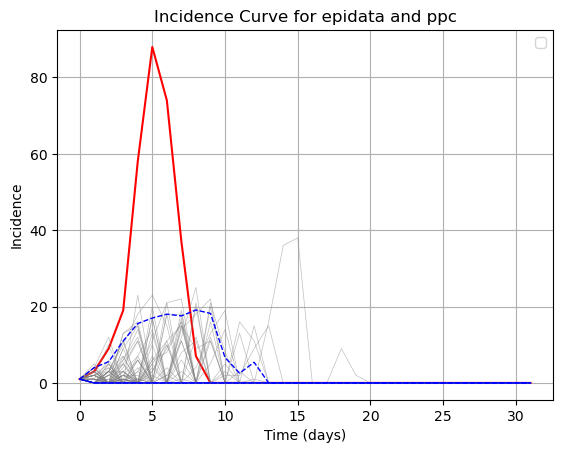

In [145]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [135]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


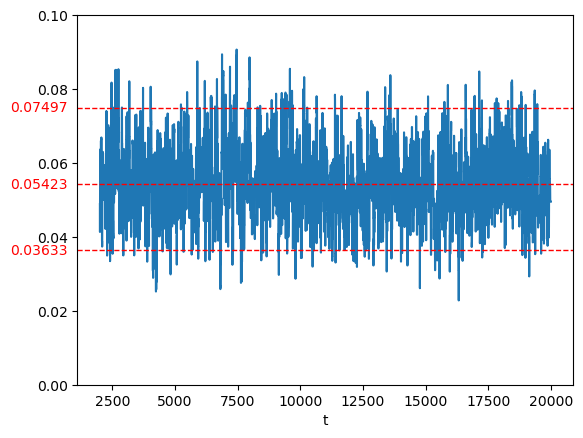

In [136]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


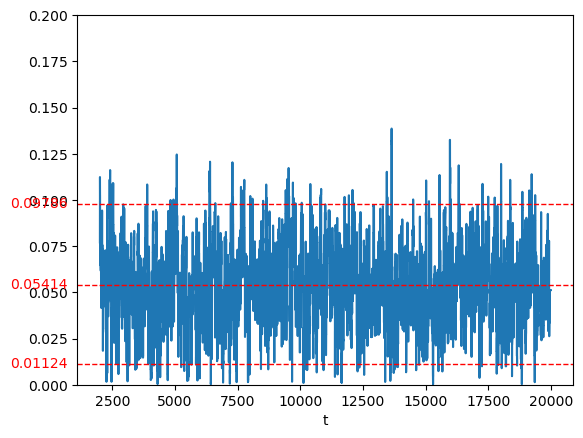

In [138]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


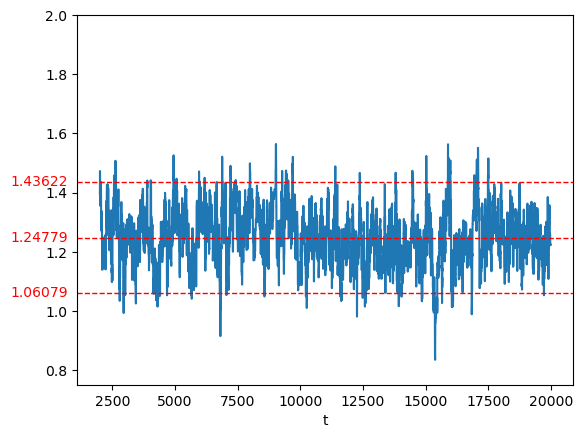

In [139]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


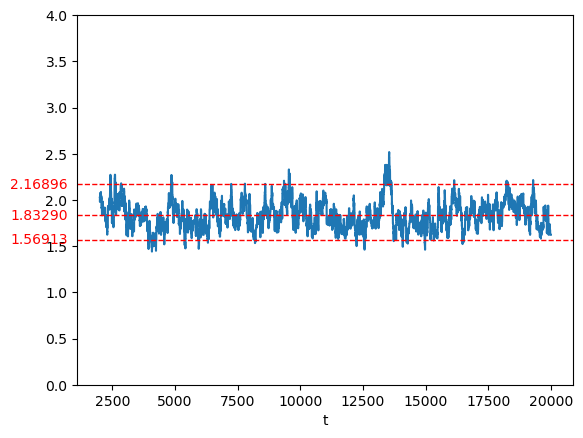

In [140]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


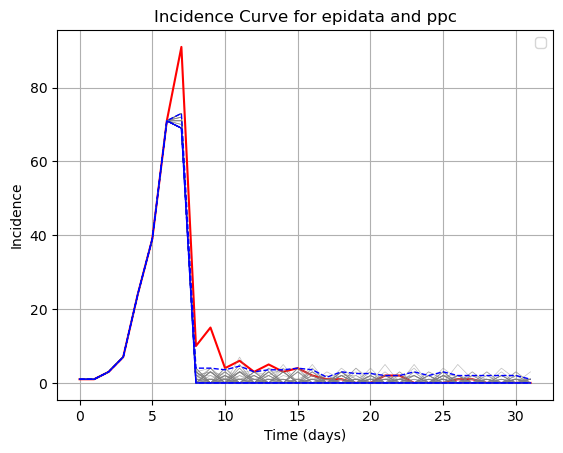

In [71]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df_ppc.iloc[0].astype(int)), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


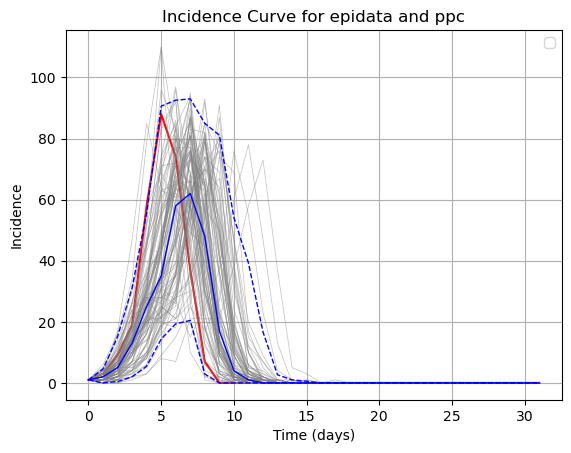

In [144]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# 20 Clusters

In [129]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


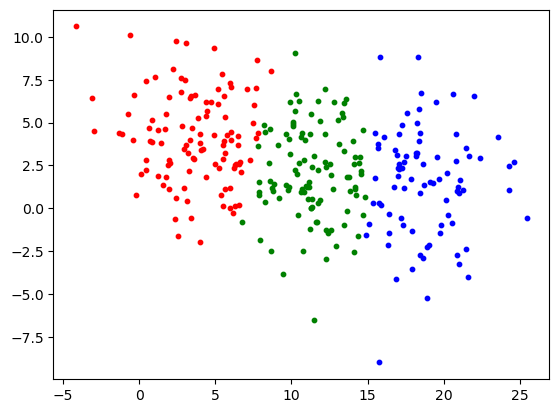

In [126]:
X = df[["position_x", "position_y"]].values
n_clusters = 3
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [127]:
df.to_csv("records.csv", index=False)

## Standard ILM

In [235]:
#full model
#composite-between clusters
samples = pd.read_csv('samples.csv')
samples_a0 = pd.DataFrame(samples["a0"])
samples_a1 = pd.DataFrame(samples["a1"])
samples_beta = pd.DataFrame(samples["beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


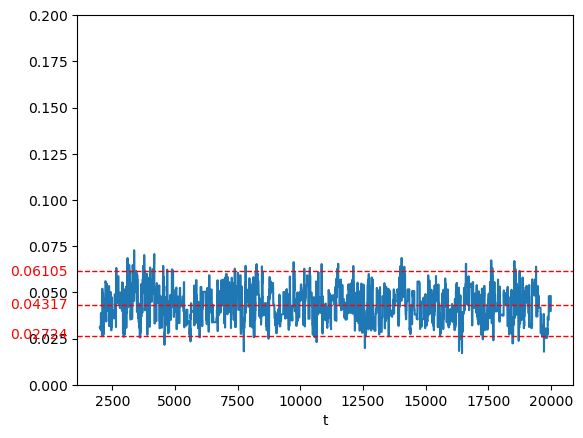

In [236]:
times = range(1999,20000)
mean = np.mean(samples_a0[1999:20000])[0]
p025 = samples_a0[1999:20000].quantile(0.025)[0]
p975 = samples_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a0[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a0.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a0.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


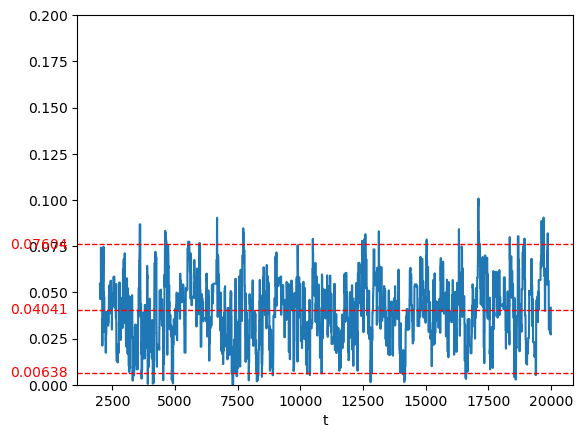

In [237]:
times = range(1999,20000)
mean = np.mean(samples_a1[1999:20000])[0]
p025 = samples_a1[1999:20000].quantile(0.025)[0]
p975 = samples_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_a1.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_a1.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


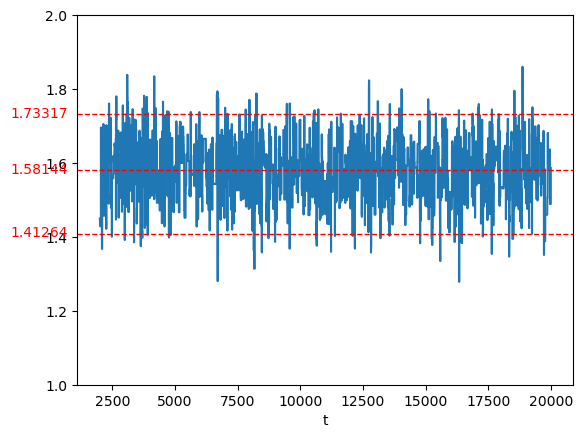

In [238]:
times = range(1999,20000)
mean = np.mean(samples_beta[1999:20000])[0]
p025 = samples_beta[1999:20000].quantile(0.025)[0]
p975 = samples_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_beta[1999:20000])
plt.ylim(1, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(samples_beta.quantile(0.025)[0],color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(samples_beta.quantile(0.975)[0],color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


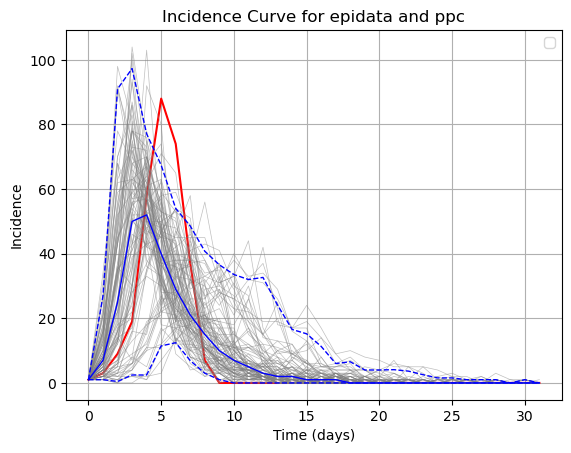

In [128]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model III: without epsilon

In [253]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


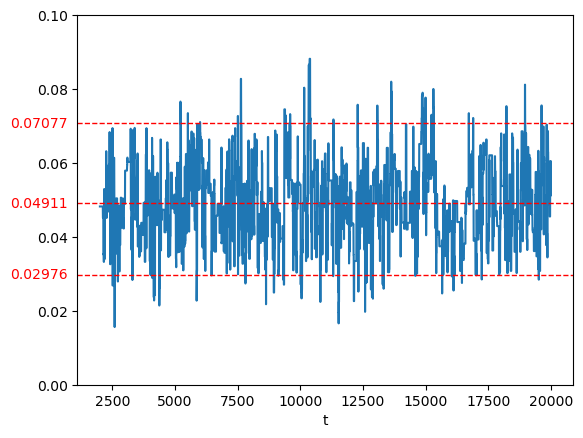

In [254]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


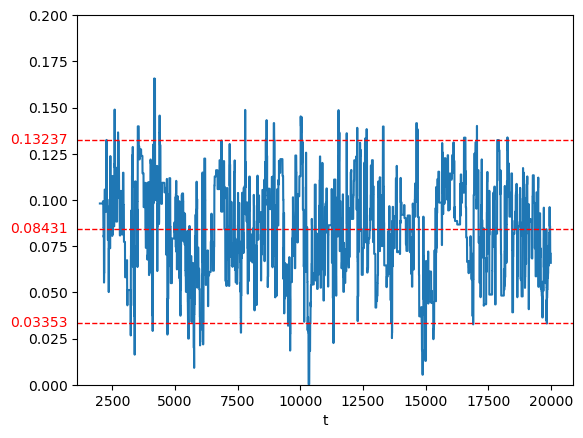

In [255]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


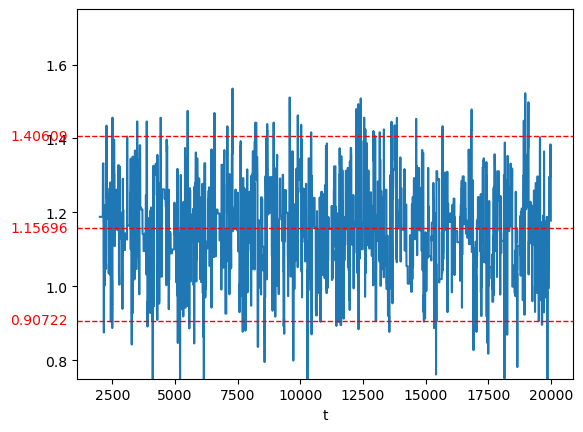

In [256]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0.75, 1.75)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


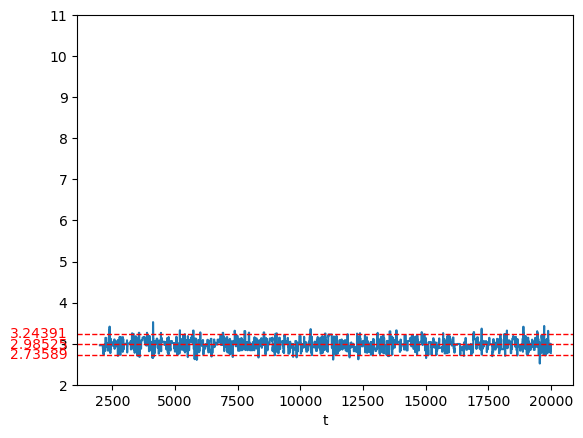

In [257]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(2, 11)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


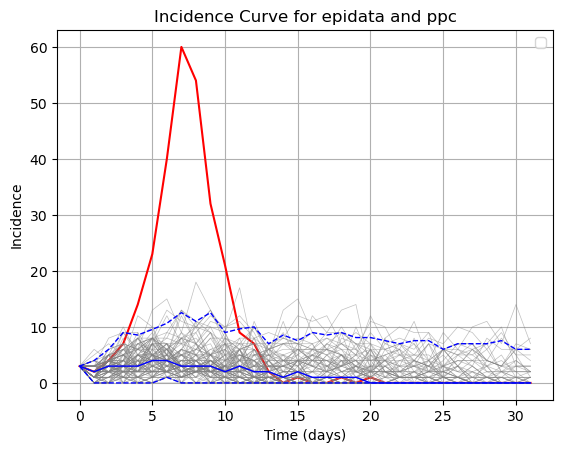

In [258]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model IV: use centroids of infected population instead of cluster centroids

In [240]:
samples_composite_bc_tilde_woeps_infcentroids = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids.csv')
samples_composite_bc_tilde_woeps_infcentroids_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a0"])
samples_composite_bc_tilde_woeps_infcentroids_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["a1"])
samples_composite_bc_tilde_woeps_infcentroids_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["beta"])
samples_composite_bc_tilde_woeps_infcentroids_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


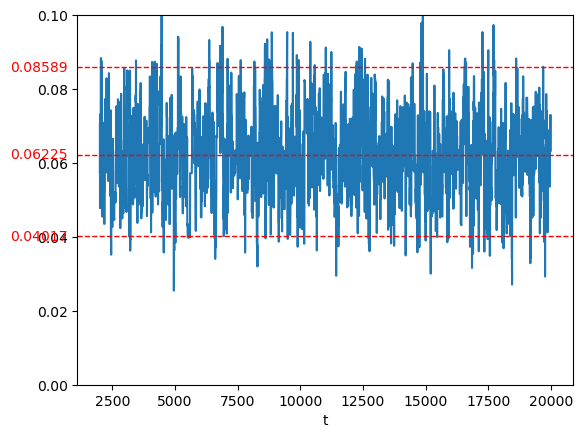

In [241]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


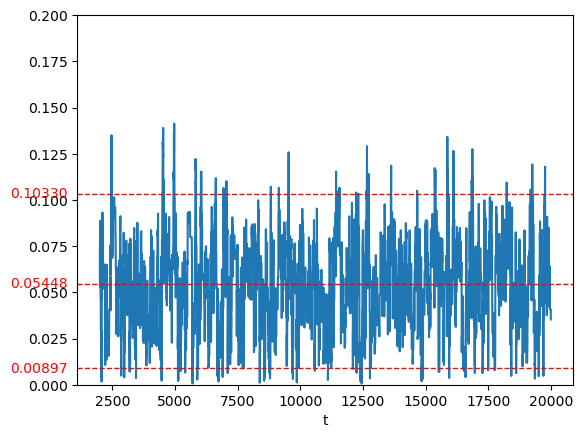

In [242]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


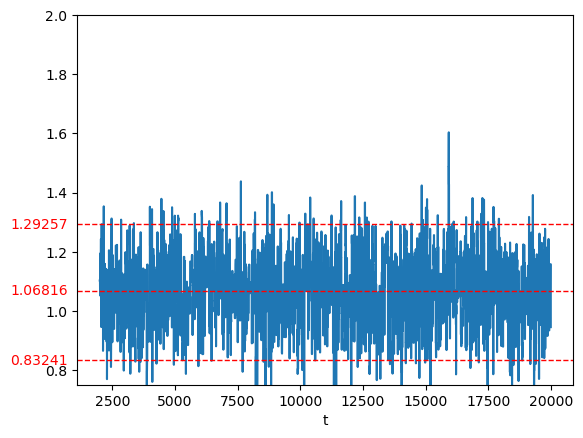

In [243]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_beta[1999:20000])
plt.ylim(0.75, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


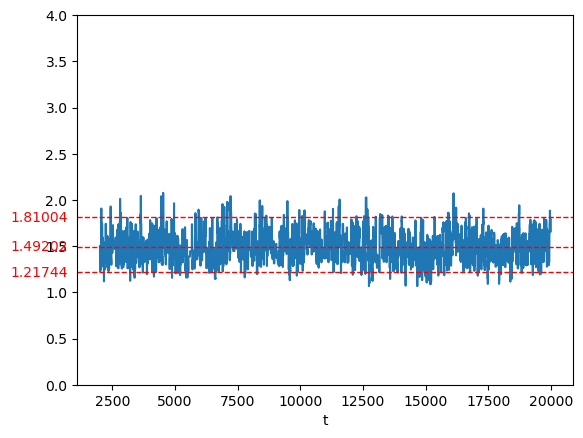

In [244]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


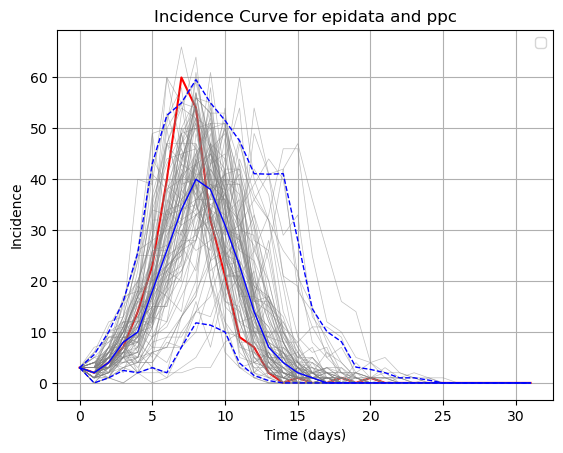

In [245]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# Homogeneous Population

In [1080]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]
cluster_id = df["cluster_id"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


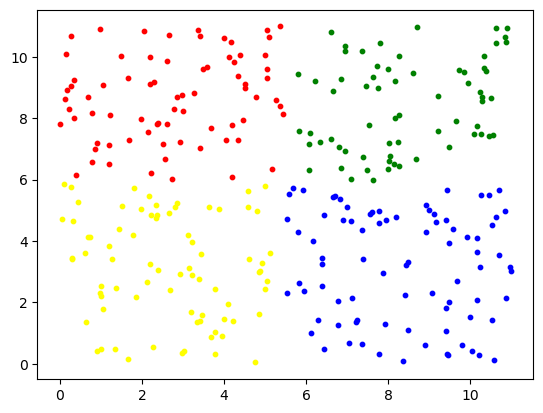

In [1081]:
X = df[["position_x", "position_y"]].values
n_clusters = 4
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [1082]:
df.to_csv("records.csv", index=False)

In [1083]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


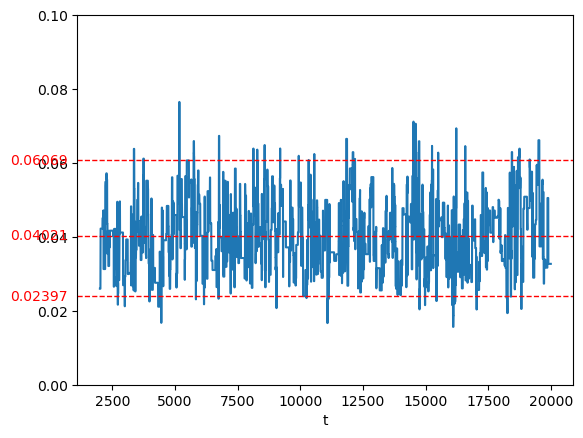

In [1084]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


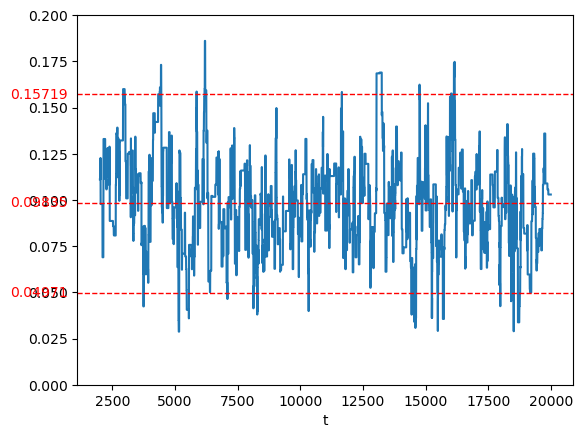

In [1085]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


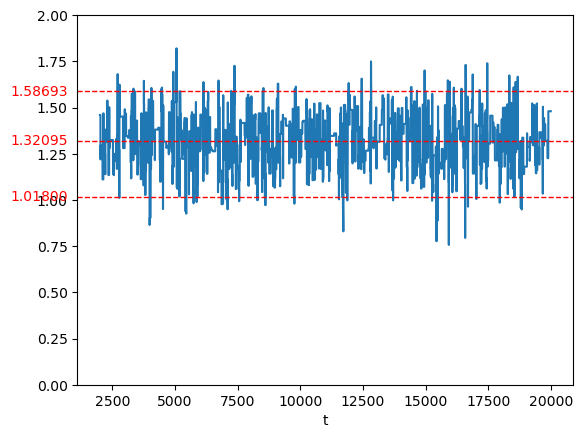

In [1086]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


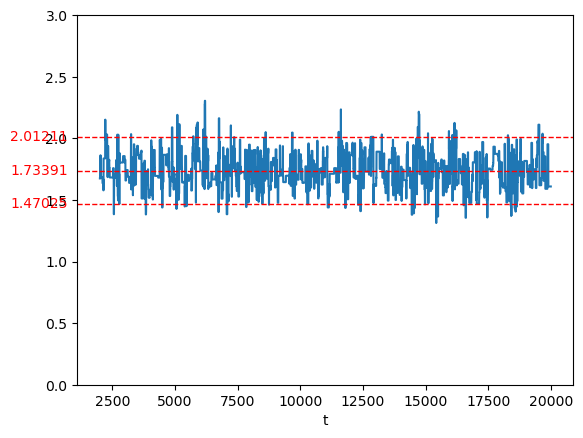

In [1087]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(0, 3)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


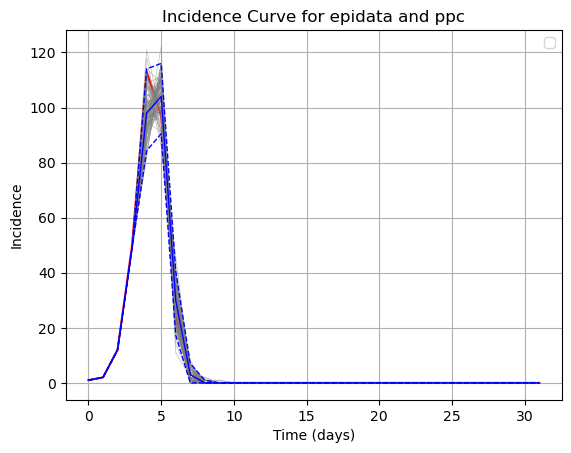

In [1088]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


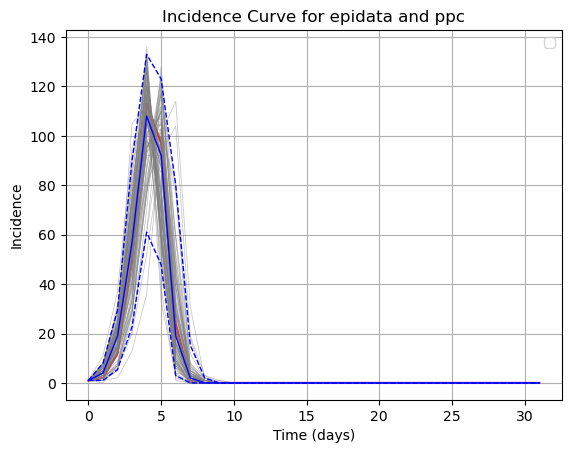

In [1089]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# Heterogeneous Population - large variance

In [3]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]
cluster_id = df["cluster_id"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


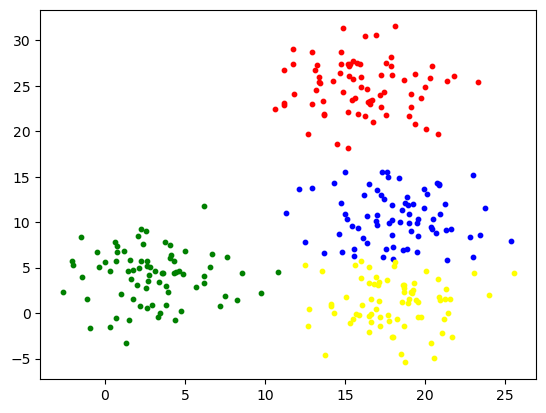

In [1160]:
X = df[["position_x", "position_y"]].values
n_clusters = 4
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [1163]:
def plot_t_days_records(time):
    for i in range(300):
        if df.iloc[i][1]==-1:
            if cluster_id[i]==0:
                plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==1:
                plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==2:
                plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='black', facecolors='none')
            if cluster_id[i]==3:
                plt.scatter(x[i], y[i], marker = "^", s = 10, edgecolors='black', facecolors='none')
        else:
            if time<df.iloc[i][1]:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='black', facecolors='none')
                if cluster_id[i]==3:
                    plt.scatter(x[i], y[i], marker = "^", s = 10, edgecolors='black', facecolors='none')
            elif df.iloc[i][1]<=time<df.iloc[i][2]:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='red', facecolors='red')
                if cluster_id[i]==3:
                    plt.scatter(x[i], y[i], marker = "^", s = 10, edgecolors='red', facecolors='red')
            else:
                if cluster_id[i]==0:
                    plt.scatter(x[i], y[i], marker = "o", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==1:
                    plt.scatter(x[i], y[i], marker = "s", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==2:
                    plt.scatter(x[i], y[i], marker = "d", s = 10, edgecolors='blue', facecolors='blue')
                if cluster_id[i]==3:
                    plt.scatter(x[i], y[i], marker = "^", s = 10, edgecolors='blue', facecolors='blue')
    plt.show()

In [1161]:
df.to_csv("records.csv", index=False)

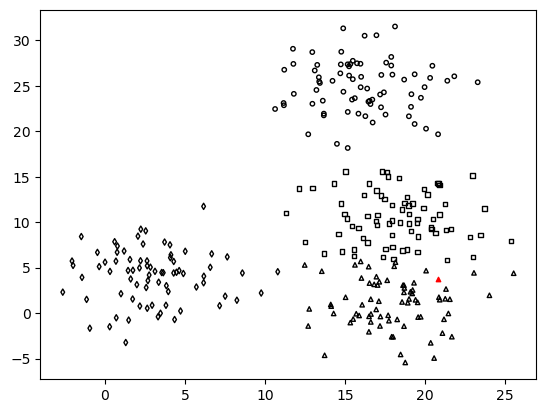

In [1164]:
plot_t_days_records(0)

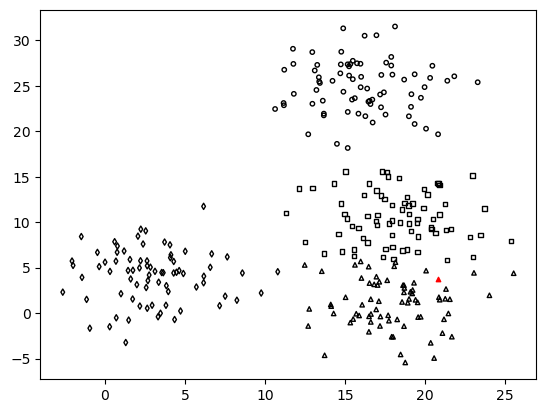

In [1165]:
plot_t_days_records(1)

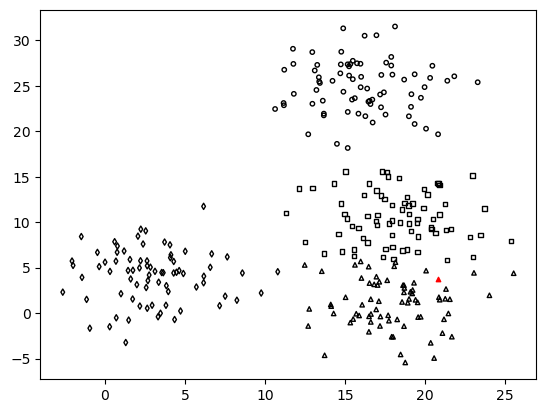

In [1166]:
plot_t_days_records(2)

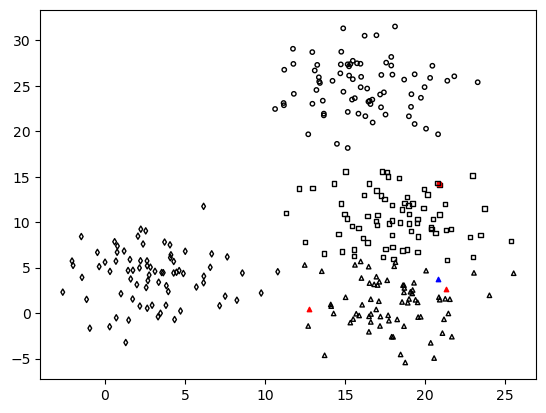

In [1167]:
plot_t_days_records(3)

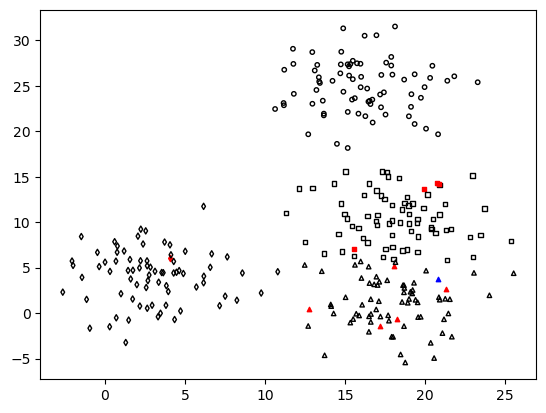

In [1168]:
plot_t_days_records(4)

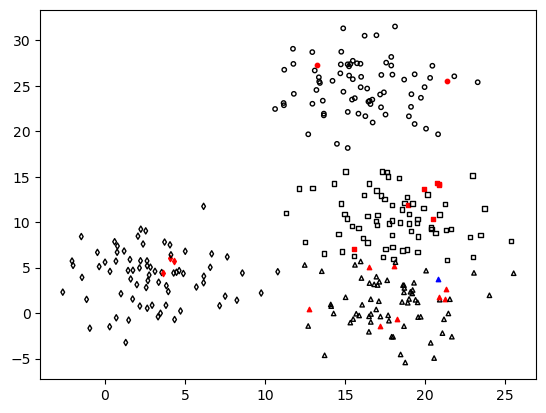

In [1169]:
plot_t_days_records(5)

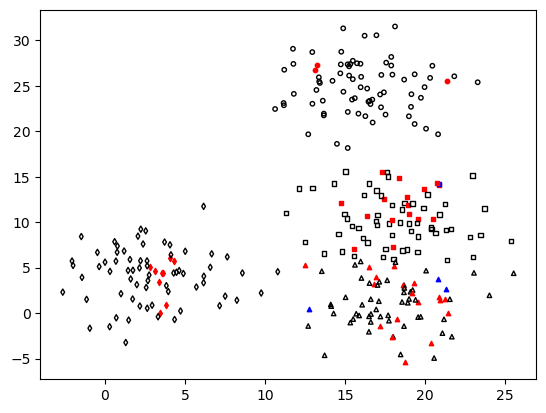

In [1170]:
plot_t_days_records(6)

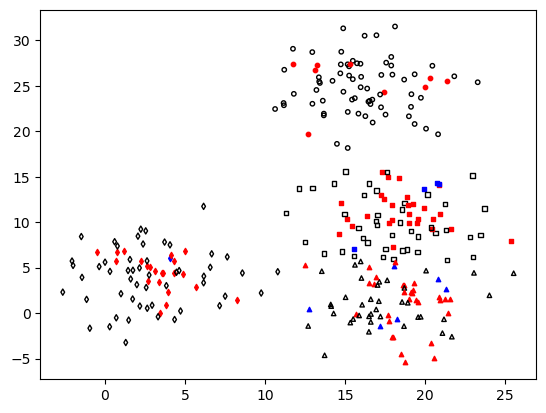

In [1171]:
plot_t_days_records(7)

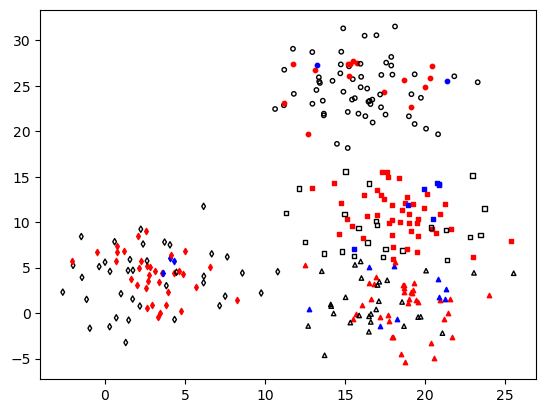

In [1172]:
plot_t_days_records(8)

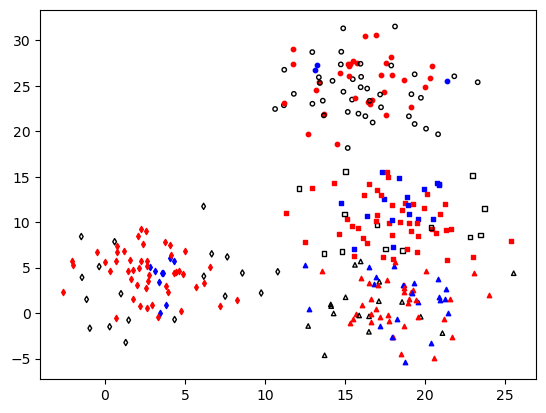

In [1173]:
plot_t_days_records(9)

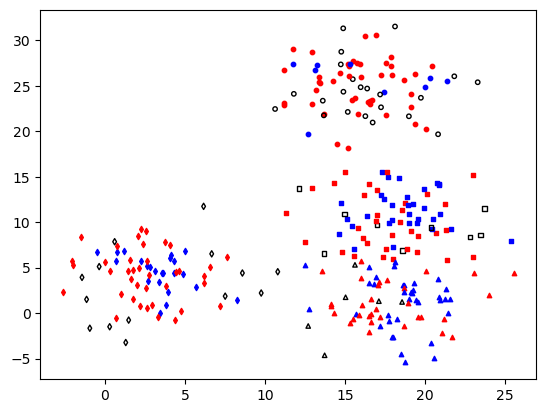

In [1174]:
plot_t_days_records(10)

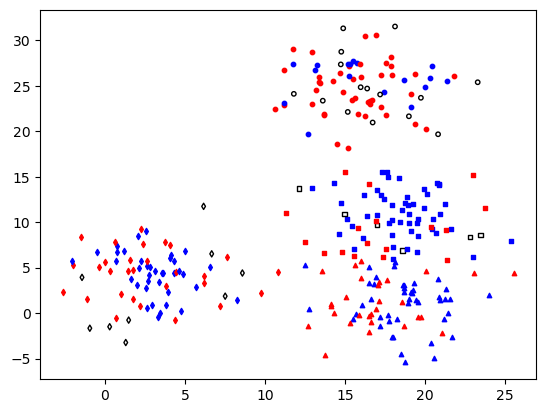

In [1175]:
plot_t_days_records(11)

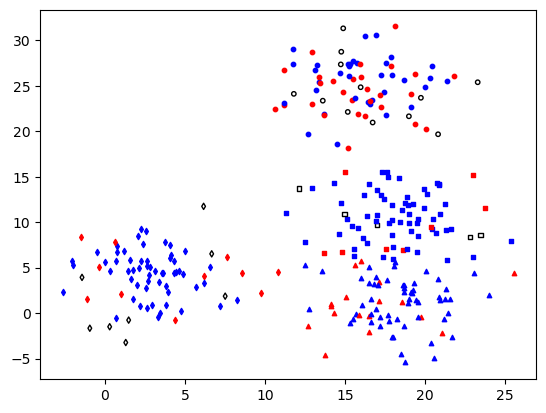

In [1176]:
plot_t_days_records(12)

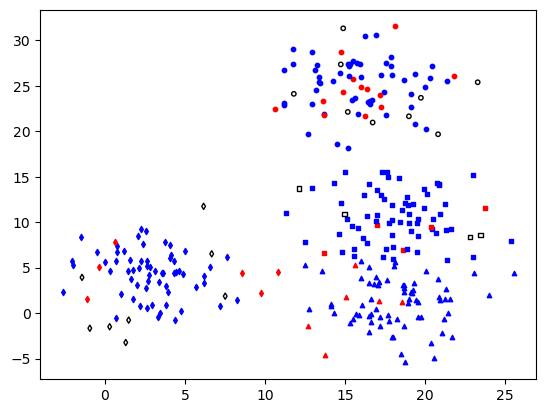

In [1177]:
plot_t_days_records(13)

(-1.0, 40.0)

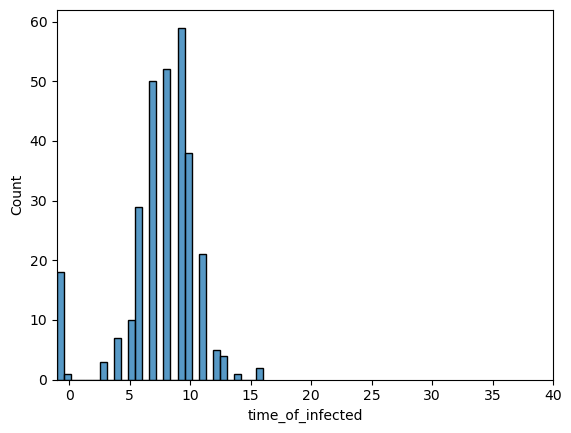

In [1178]:
sns.histplot(time)
plt.xlim(-1, 40)

## Model III: without epsilon

In [1120]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


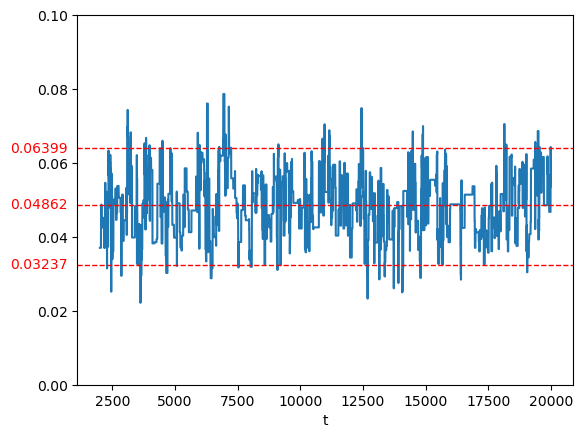

In [1121]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


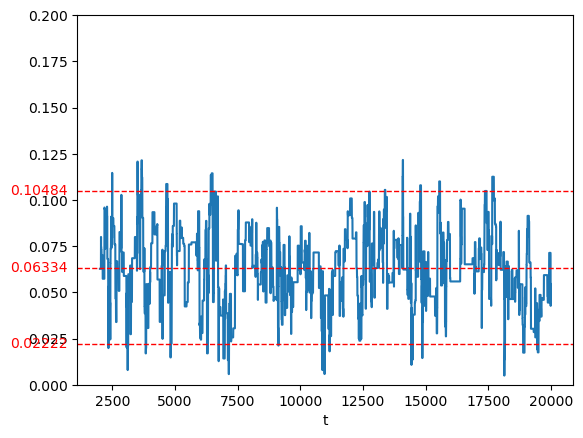

In [1122]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


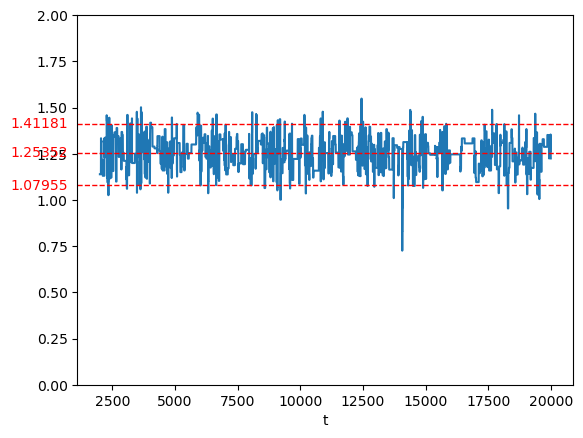

In [1123]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


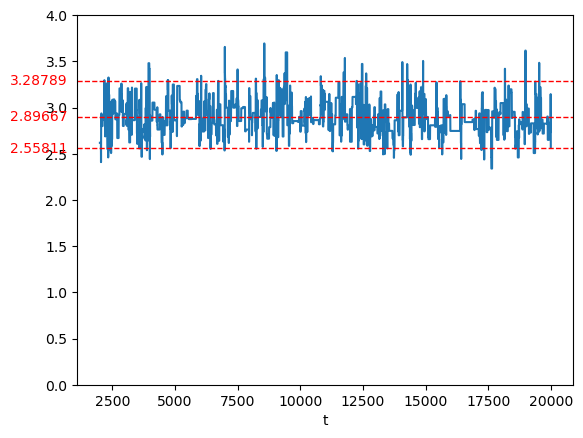

In [1124]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 6

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


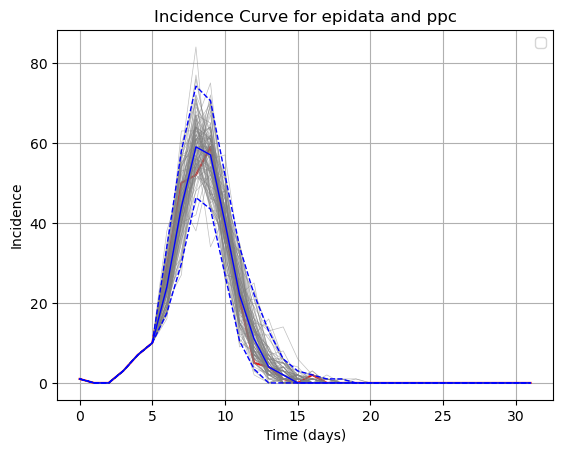

In [1213]:
#inference using all epidata and simulate from day 6
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 10

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


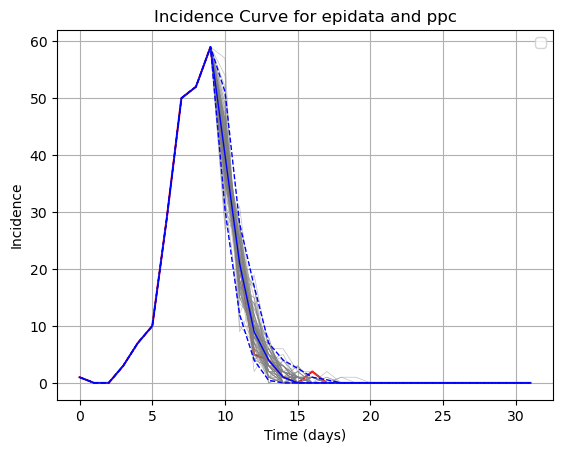

In [1218]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 11

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


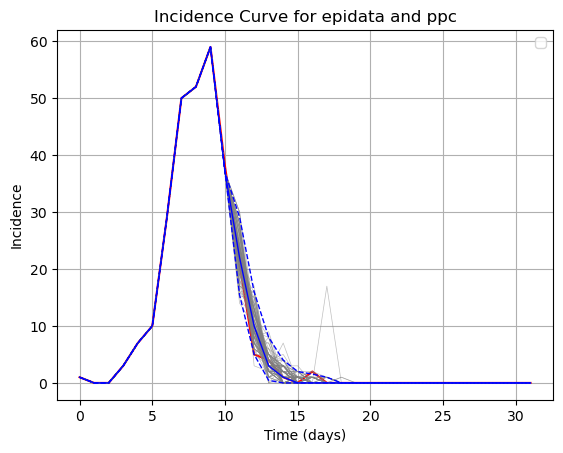

In [1219]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


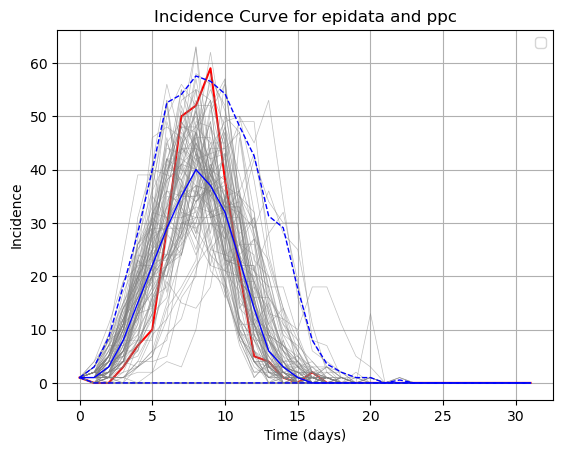

In [1217]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - 2 sequential observations

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


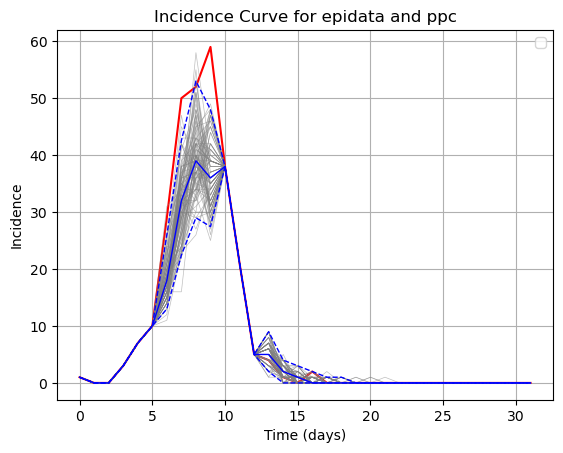

In [1220]:
#observe on day 3-5 and 10-12
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        if inf_time_tab[i]==-100:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


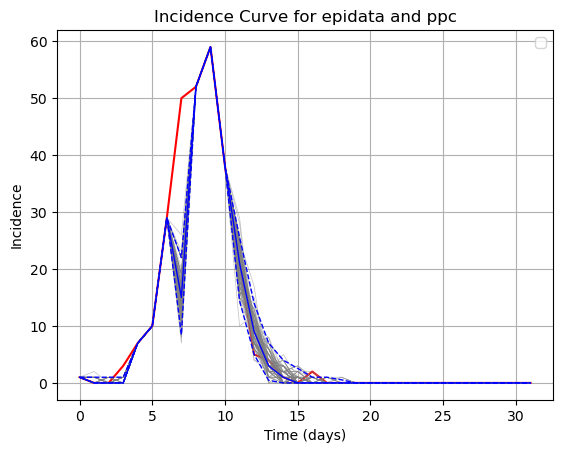

In [1222]:
#observe on day 4-6 and 8-10
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        if inf_time_tab[i]==-100:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

## Model VI: delta power

In [1142]:
#composite-between clusters
samples_composite_bc_tilde_woeps_infcentroids_delta = pd.read_csv('samples_composite_bc_tilde_woeps_infcentroids_delta.csv')
samples_composite_bc_tilde_woeps_infcentroids_delta_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_delta["a0"])
samples_composite_bc_tilde_woeps_infcentroids_delta_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_delta["a1"])
samples_composite_bc_tilde_woeps_infcentroids_delta_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_delta["beta"])
samples_composite_bc_tilde_woeps_infcentroids_delta_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_delta["tilde_beta"])
samples_composite_bc_tilde_woeps_infcentroids_delta_delta = pd.DataFrame(samples_composite_bc_tilde_woeps_infcentroids_delta["delta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


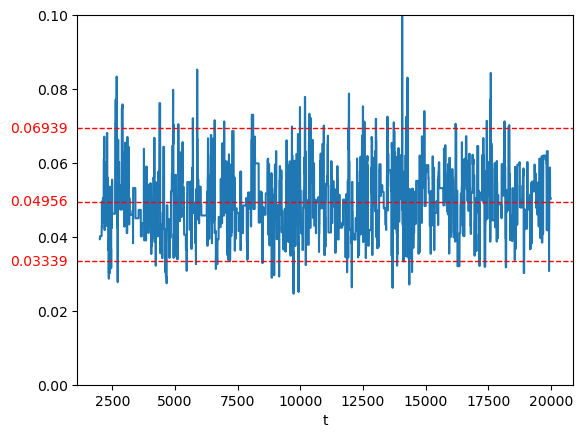

In [1143]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_delta_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_delta_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_delta_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_delta_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


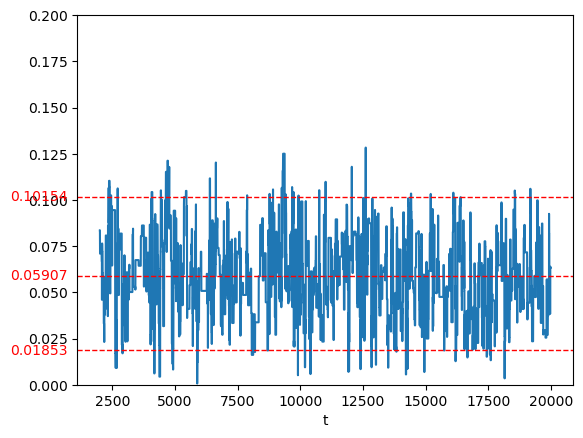

In [1144]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_delta_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_delta_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_delta_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_delta_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


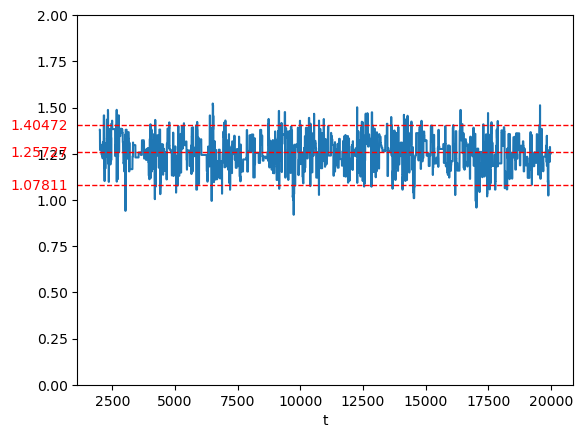

In [1145]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_delta_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_delta_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_delta_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_delta_beta[1999:20000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


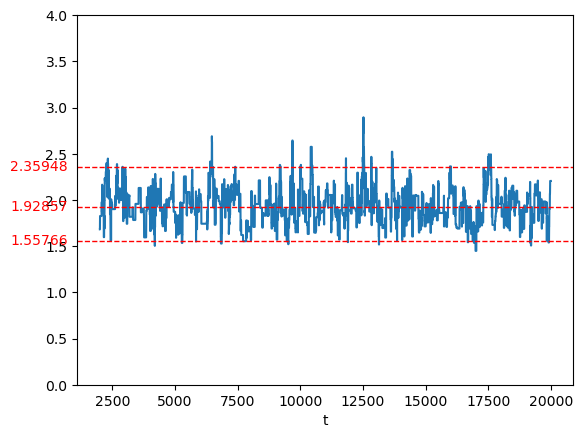

In [1146]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_delta_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_delta_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_delta_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_delta_tilde_beta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\delta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


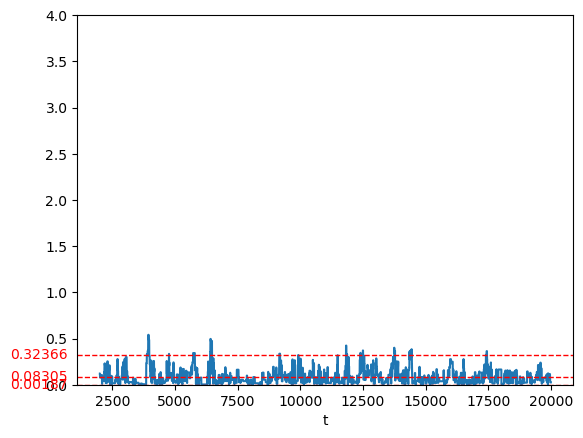

In [1147]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_infcentroids_delta_delta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_infcentroids_delta_delta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_infcentroids_delta_delta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_infcentroids_delta_delta[1999:20000])
plt.ylim(0, 4)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 6
- on day 5, each cluster at least has 1 infection

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


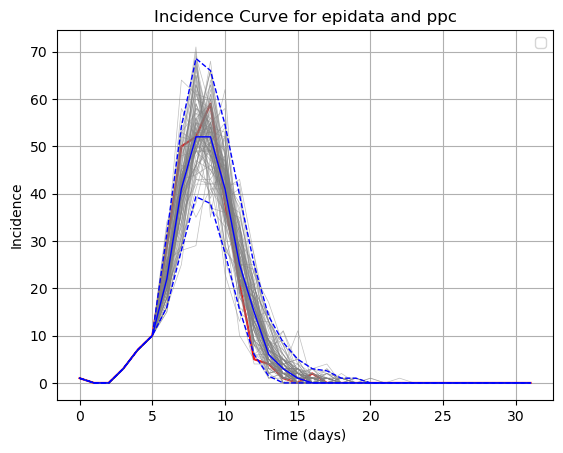

In [1148]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 10
- the peak is day 9

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


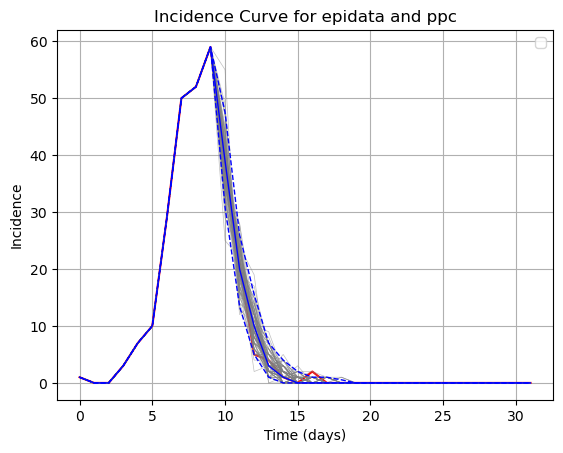

In [1179]:
#inference using all epidata and simulate from day 10
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 11
- after observing a decrease in incidence

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


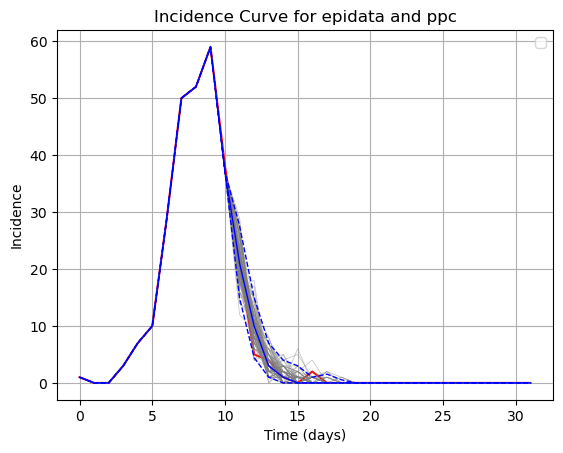

In [24]:
#inference using all epidata and simulate from day 11
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 1
- start predicting once 1 infection was observed

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


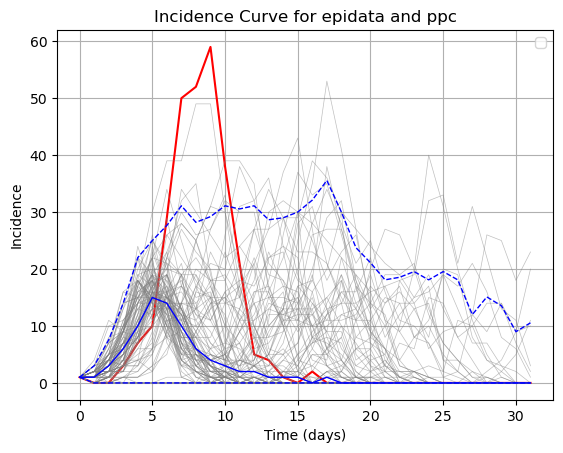

In [1181]:
#inference using all epidata and simulate from day 11
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - one step forward


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


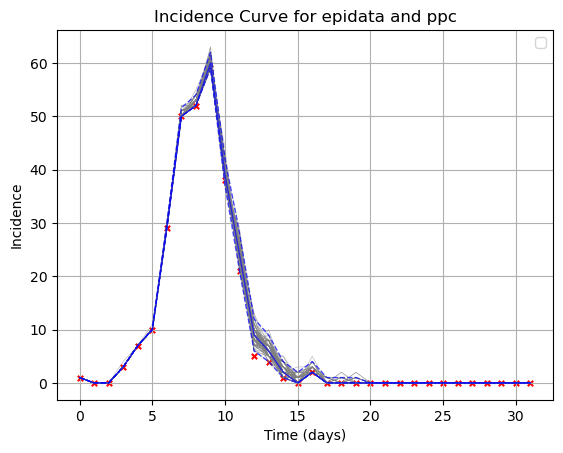

In [20]:
#starts from day 3
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        if inf_time_tab[i]==-100:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.scatter(range(32), cal_inc(df["time_of_infected"]), color="red", marker="x", s= 15)
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue", alpha = 0.7)
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue", alpha = 0.7)
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue", alpha = 0.7)
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - two-step forward

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


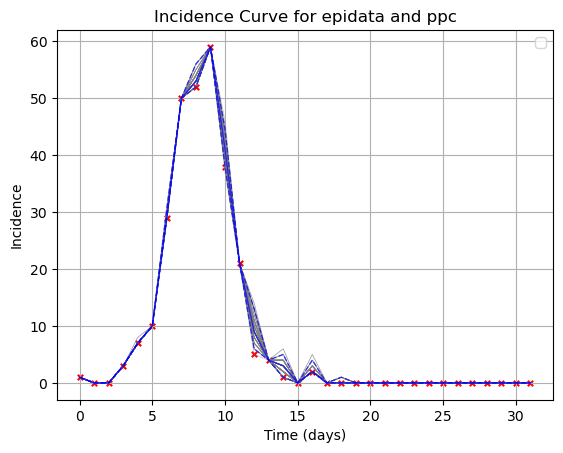

In [22]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        if inf_time_tab[i]==-100:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.scatter(range(32), cal_inc(df["time_of_infected"]), color="red", marker="x", s= 15)
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue", alpha = 0.7)
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue", alpha = 0.7)
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue", alpha = 0.7)
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - three-step forward

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


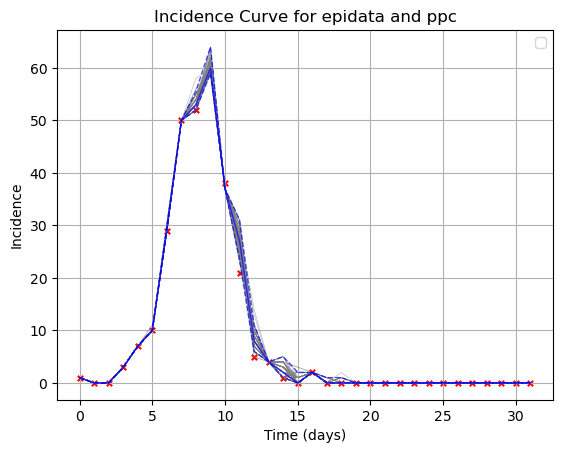

In [23]:
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        if inf_time_tab[i]==-100:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.scatter(range(32), cal_inc(df["time_of_infected"]), color="red", marker="x", s= 15)
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue", alpha = 0.7)
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue", alpha = 0.7)
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue", alpha = 0.7)
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

# Heterogeneous Population - small variance

In [1067]:
df = pd.read_csv('records.csv')
x = df["position_x"]
y = df["position_y"]
time = df["time_of_infected"]
cluster_id = df["cluster_id"]

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


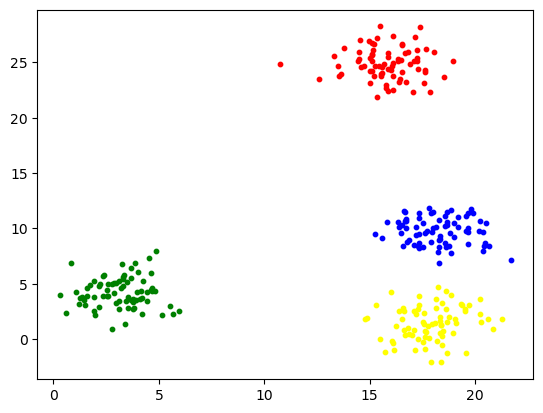

In [1068]:
X = df[["position_x", "position_y"]].values
n_clusters = 4
# Initialize and fit the KMeans model
cluster = KMeans(n_clusters=n_clusters, random_state=0).fit(X)
y_pred = cluster.labels_ 
df["cluster_id"] = y_pred
color=['red','blue','green','yellow','purple','orange','pink','brown','black','gray']
fig, axi1=plt.subplots(1)
for i in range(n_clusters):
    axi1.scatter(X[y_pred==i, 0], X[y_pred==i, 1],
               marker='o',
               s=10,
               c=color[i])
#axi1.scatter(centroid[:,0],centroid[:,1],marker='x',s=100,c='black')

In [1071]:
df.to_csv("records.csv", index=False)

In [1072]:
#composite-between clusters
samples_composite_bc_tilde_woeps = pd.read_csv('samples_composite_bc_tilde_woeps.csv')
samples_composite_bc_tilde_woeps_a0 = pd.DataFrame(samples_composite_bc_tilde_woeps["a0"])
samples_composite_bc_tilde_woeps_a1 = pd.DataFrame(samples_composite_bc_tilde_woeps["a1"])
samples_composite_bc_tilde_woeps_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["beta"])
samples_composite_bc_tilde_woeps_tilde_beta = pd.DataFrame(samples_composite_bc_tilde_woeps["tilde_beta"])

### $\alpha_0$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


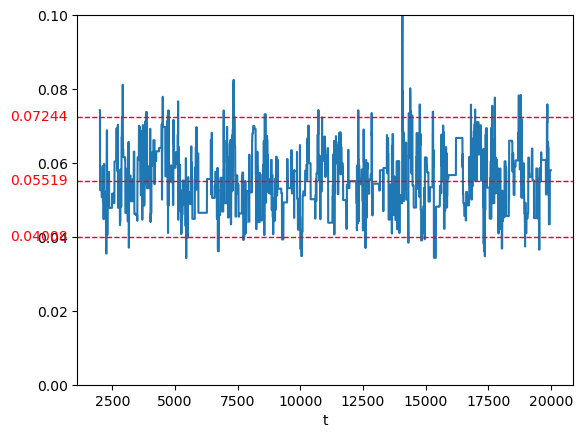

In [1073]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a0[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a0[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a0[1999:20000])
plt.ylim(0, 0.1)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\alpha_1$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


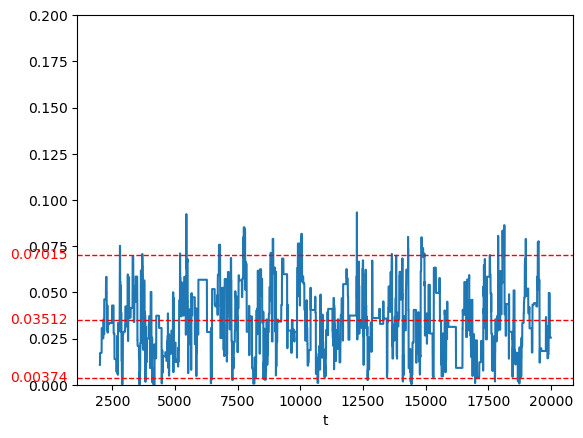

In [1074]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_a1[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_a1[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_a1[1999:20000])
plt.ylim(0, 0.2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\beta$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


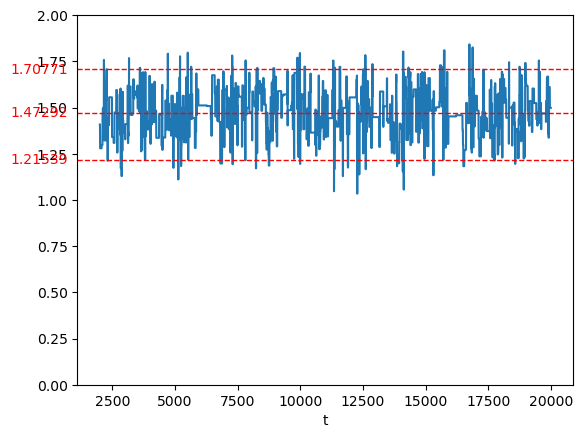

In [1075]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_beta[1999:20000])
plt.ylim(0, 2)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### $\tilde{\beta}$

/Users/yiraozhang/anaconda3/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3462: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)


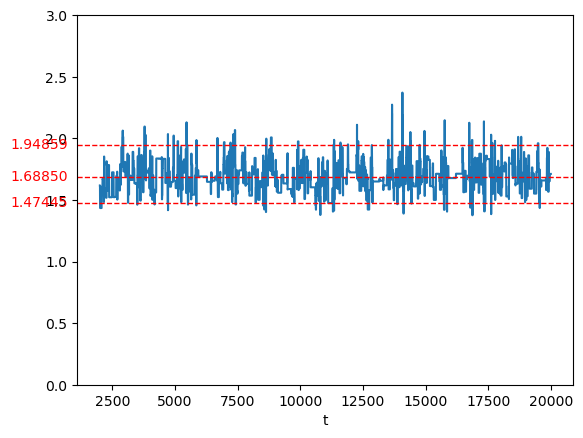

In [1076]:
times = range(1999,20000)
mean = np.mean(samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])[0]
p025 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.025)[0]
p975 = samples_composite_bc_tilde_woeps_tilde_beta[1999:20000].quantile(0.975)[0]
fig, ax=plt.subplots()
plt.plot(times, samples_composite_bc_tilde_woeps_tilde_beta[1999:20000])
plt.ylim(0, 3)
plt.xlabel("t")
plt.ylabel("")
plt.axhline(mean,color = "red", linestyle = "--", linewidth = 1)  
plt.axhline(p025,color = "red", linestyle = "--", linewidth = 1)                                                                                                                                                    
plt.axhline(p975,color = "red", linestyle = "--", linewidth = 1)  
trans = transforms.blended_transform_factory(
    ax.get_yticklabels()[0].get_transform(), ax.transData)
ax.text(0,mean, "{:.5f}".format(mean), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p025, "{:.5f}".format(p025), color="red", transform=trans, 
        ha="right", va="center")
ax.text(0,p975, "{:.5f}".format(p975), color="red", transform=trans, 
        ha="right", va="center")
plt.show()

### Posterior predictive distribution - start from day 4

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


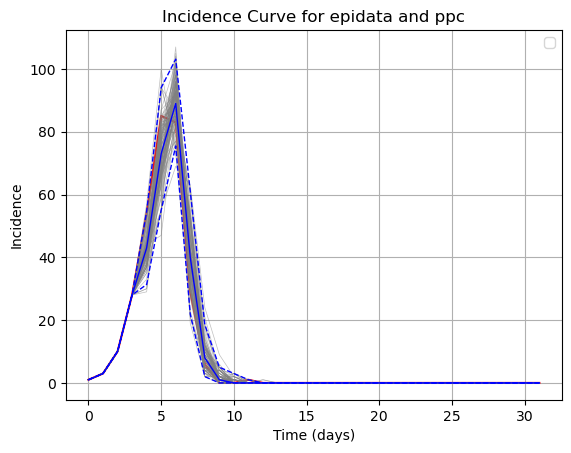

In [1078]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()

### Posterior predictive distribution - start from day 0

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


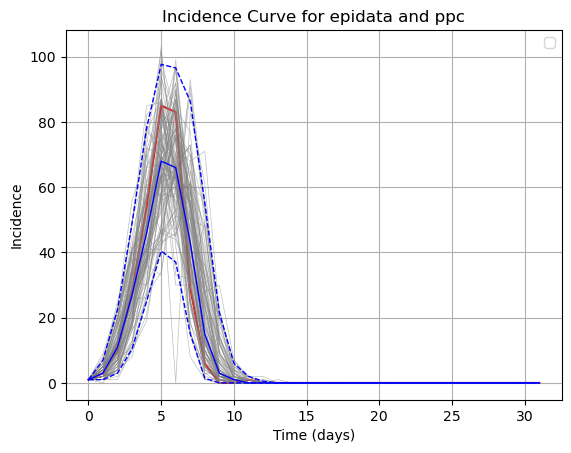

In [1079]:
#inference using all epidata and simulate from day 0
def cal_inc(inf_time_tab):
    incidence = [0 for _ in range(32)]
    for i in range(300):
        if inf_time_tab[i]==-1:
            continue
        incidence[inf_time_tab[i]] += 1
    return incidence
posteriors = [[0 for _ in range(32)] for _ in range(99)]
df_ppc = pd.read_csv('posterior_predictive_checks_inftime.csv', header=None)
df_ppc = df_ppc.drop(df_ppc.columns[-1], axis=1)
rows, cols = df_ppc.shape
plt.plot(range(32), cal_inc(df["time_of_infected"]), linewidth = 1.5, color = "red")
for i in range(1,100):
    plt.plot(range(32), cal_inc(df_ppc.iloc[i].astype(int)), linewidth = 0.5, color = "grey", alpha = 0.5)
    posteriors[i-1] = cal_inc(df_ppc.iloc[i].astype(int))
posteriors = np.array(posteriors)
medians = np.median(posteriors, axis=0)
percentiles_025 = np.percentile(posteriors, 2.5, axis=0)
percentiles_975 = np.percentile(posteriors, 97.5, axis=0)
plt.plot(range(32), medians, linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_025, linestyle='--', linewidth = 1, color = "blue")
plt.plot(range(32), percentiles_975, linestyle='--', linewidth = 1, color = "blue")
plt.xlabel('Time (days)')
plt.ylabel('Incidence')
plt.title('Incidence Curve for epidata and ppc')
plt.legend()
plt.grid(True)
plt.show()